<center> <font size="6"> Group 15 - Binary Classification </font> </center>

|      |     Student Name     |     Student ID     | 
|---   |         ---          |           ---          |
| 1    |     Emília Santos    |       20230446         | 
| 2    |      Francisco Castro      |       20230992         |
| 3    |      Maria Carlota Fortunato        |       20230382         |
| 4    |      Inês Valverde       |       r20201472         | 

# 1. Data Integration

In [1]:
import pandas as pd
from matplotlib import pyplot
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import numpy as np
from numpy import array
from ydata_profiling import ProfileReport
from math import ceil
import re
import os
import ast
import time
from sklearn.tree import export_graphviz
import graphviz
import pydotplus
# for better resolution plots
%config InlineBackend.figure_format = 'retina' # optionally, you can change 'svg' to 'retina'

# Seeting seaborn style
sns.set()

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.preprocessing import OrdinalEncoder, TargetEncoder

import category_encoders as ce

import scipy.stats as stats
from scipy.stats import chi2_contingency

from sklearn.datasets import make_classification
from sklearn.pipeline import Pipeline
from sklearn.metrics import make_scorer, f1_score, classification_report
from sklearn.feature_selection import SelectKBest, chi2, f_regression, RFE, SelectFromModel, mutual_info_classif

from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier, Lasso
from sklearn.linear_model import LassoCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import ComplementNB

from sklearn.impute import KNNImputer

from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTENC
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTEENN
from imblearn.under_sampling import EditedNearestNeighbours

from sklearn.model_selection import cross_val_score, GridSearchCV, RandomizedSearchCV, RepeatedStratifiedKFold

from sklearn.metrics import roc_curve
from sklearn.metrics import auc

import warnings
warnings.filterwarnings('ignore')

### 1.1. Import Dataset

In [2]:
data = pd.read_csv('C:/Users/Utilizador/Desktop/IMS/Mestrado/1º ano/Machine Learning/Project/train.csv', sep = ',')

In [3]:
test = pd.read_csv('C:/Users/Utilizador/Desktop/IMS/Mestrado/1º ano/Machine Learning/Project/test.csv', sep = ',')

In [4]:
pd.set_option('display.max_columns', 31)
data.head()

,encounter_id,country,patient_id,race,gender,age,weight,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,average_pulse_bpm,discharge_disposition,admission_source,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,number_of_medications,primary_diagnosis,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication,readmitted_binary,readmitted_multiclass
0,533253,USA,70110,Caucasian,Female,[70-80),?,?,0,0,2,Emergency,Family/GeneralPractice,127,Discharged to home,Emergency Room,2,48,0,20,515,276,466,8,NaN,NaN,No,No,[],No,>30 days
1,426224,USA,29775006,AfricanAmerican,Male,[50-60),?,?,0,0,0,Emergency,?,128,Discharged/transferred to a federal health car...,Clinic Referral,14,71,0,25,38,785,162,9,NaN,NaN,No,Yes,['insulin'],No,No
2,634063,USA,80729253,Caucasian,Female,[60-70),?,?,0,0,1,NaN,Family/GeneralPractice,94,Discharged to home,NaN,6,60,1,22,534,135,250,6,NaN,NaN,Ch,Yes,"['glimepiride', 'insulin']",No,No
3,890610,USA,2919042,AfricanAmerican,Male,[60-70),?,MC,0,0,1,Emergency,InternalMedicine,81,Discharged to home,Transfer from another health care facility,6,48,2,9,569,562,455,5,NaN,NaN,No,No,[],No,No
4,654194,USA,84871971,Caucasian,Female,[70-80),?,HM,1,0,0,Elective,?,126,Discharged/transferred to home with home healt...,Physician Referral,6,47,1,15,715,599,428,9,NaN,NaN,No,No,[],No,>30 days


In [5]:
data.shape

(71236, 31)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71236 entries, 0 to 71235
Data columns (total 31 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   encounter_id                           71236 non-null  int64 
 1   country                                71236 non-null  object
 2   patient_id                             71236 non-null  int64 
 3   race                                   67682 non-null  object
 4   gender                                 71236 non-null  object
 5   age                                    67679 non-null  object
 6   weight                                 71236 non-null  object
 7   payer_code                             71236 non-null  object
 8   outpatient_visits_in_previous_year     71236 non-null  int64 
 9   emergency_visits_in_previous_year      71236 non-null  int64 
 10  inpatient_visits_in_previous_year      71236 non-null  int64 
 11  admission_type 

# 2. Data Exploration

### 2.1. Identifying possible errors

In [7]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
encounter_id,71236.0,5.487986e+05,2.597047e+05,100000.0,323118.50,548370.0,774058.50,999980.0
patient_id,71236.0,5.430228e+07,3.879585e+07,135.0,23396510.25,45305631.0,87558374.25,189502619.0
outpatient_visits_in_previous_year,71236.0,3.695884e-01,1.287469e+00,0.0,0.00,0.0,0.00,42.0
emergency_visits_in_previous_year,71236.0,1.962491e-01,9.108537e-01,0.0,0.00,0.0,0.00,76.0
inpatient_visits_in_previous_year,71236.0,6.401539e-01,1.267271e+00,0.0,0.00,0.0,1.00,21.0
average_pulse_bpm,71236.0,9.961122e+01,2.304052e+01,60.0,80.00,100.0,119.00,139.0
length_of_stay_in_hospital,71236.0,4.391024e+00,2.988739e+00,1.0,2.00,4.0,6.00,14.0
number_lab_tests,71236.0,4.309565e+01,1.964292e+01,1.0,31.00,44.0,57.00,121.0
non_lab_procedures,71236.0,1.340923e+00,1.706664e+00,0.0,0.00,1.0,2.00,6.0
number_of_medications,71236.0,1.599545e+01,8.122347e+00,1.0,10.00,15.0,20.00,75.0


Looking to count, it seems that there are no missing values in the numerical variables. 
Outliers: outpatient_visits_in_previous_year, emergency_visits_in_previous_year, inpatient_visits_in_previous_year, length_of_stay_in_hospital, number_lab_tests and number_of_medications may seem to have outliers, because the max is very different from the quantiles.

In [8]:
data.describe(include = ['O']).T

,count,unique,top,freq
country,71236,1,USA,71236
race,67682,6,Caucasian,50693
gender,71236,3,Female,38228
age,67679,10,[70-80),17359
weight,71236,10,?,68990
payer_code,71236,18,?,28201
admission_type,67530,7,Emergency,37742
medical_specialty,71236,69,?,34922
discharge_disposition,68646,25,Discharged to home,42256
admission_source,66518,16,Emergency Room,40319


Looking to count, there are missing values in most all categorical variables. 
- Incoherencies will be found in country, gender, age, weight, payer_code, medical_specialty. 
- country: all the values appear to be the same, which is USA
- gender: 3 unique values 
- race, weight, medical_specialty: missing values as '?' 
- payer_code as '?' as values, but we assume that indicate individuals without insurance instead of missing values
- medication has no missing values, but when we look into the actual values we have '[]'. This indicates individuals without medication 

# 3. Data Partition

In [9]:
X = data.drop(['readmitted_binary','readmitted_multiclass'], axis=1)
y = data['readmitted_binary'] 

In [10]:
data.drop(columns = 'readmitted_multiclass', inplace = True)

In [11]:
train, val = train_test_split(data, test_size=0.3, random_state=42, stratify = y, shuffle = True)

In [12]:
metric_features = ['outpatient_visits_in_previous_year', 'emergency_visits_in_previous_year', 'inpatient_visits_in_previous_year','average_pulse_bpm','length_of_stay_in_hospital','number_lab_tests', 'non_lab_procedures', 'number_of_medications', 'number_diagnoses']

In [13]:
non_metric_features = ['country','race','gender', 'age','weight', 'payer_code','admission_type','medical_specialty','discharge_disposition', 'admission_source','primary_diagnosis','secondary_diagnosis', 'additional_diagnosis', 'glucose_test_result', 'a1c_test_result', 'change_in_meds_during_hospitalization', 'prescribed_diabetes_meds', 'medication']

In [14]:
pd.set_option('display.max_columns', 29)
train.head()

,encounter_id,country,patient_id,race,gender,age,weight,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,average_pulse_bpm,...,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,number_of_medications,primary_diagnosis,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication,readmitted_binary
23359,767545,USA,111719664,Caucasian,Male,[50-60),?,HM,3,0,0,Emergency,?,131,...,4,46,2,23,250.82,730,707,9,NaN,>8,No,No,[],No
53084,260242,USA,93187863,Caucasian,Female,[60-70),?,MC,2,0,0,Emergency,?,130,...,3,1,0,15,338,843,727,9,NaN,NaN,Ch,Yes,['insulin'],No
41986,793358,USA,2707236,Caucasian,Male,[50-60),?,?,0,0,0,Urgent,InternalMedicine,60,...,5,45,1,11,789,535,401,7,NaN,NaN,No,No,[],No
60012,907877,USA,58819140,AfricanAmerican,Female,[70-80),?,?,0,0,0,Emergency,?,69,...,5,2,0,8,402,427,425,6,NaN,NaN,No,Yes,['insulin'],No
37513,339521,USA,3242385,Caucasian,Male,[80-90),?,?,0,0,0,Emergency,?,65,...,4,59,0,6,780,250.02,276,9,NaN,NaN,Ch,Yes,"['metformin', 'glyburide']",No


In [15]:
train.shape

(49865, 30)

In [16]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49865 entries, 23359 to 63680
Data columns (total 30 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   encounter_id                           49865 non-null  int64 
 1   country                                49865 non-null  object
 2   patient_id                             49865 non-null  int64 
 3   race                                   47400 non-null  object
 4   gender                                 49865 non-null  object
 5   age                                    47385 non-null  object
 6   weight                                 49865 non-null  object
 7   payer_code                             49865 non-null  object
 8   outpatient_visits_in_previous_year     49865 non-null  int64 
 9   emergency_visits_in_previous_year      49865 non-null  int64 
 10  inpatient_visits_in_previous_year      49865 non-null  int64 
 11  admission_type  

In [17]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
encounter_id,49865.0,5.493607e+05,2.594133e+05,100020.0,324369.0,548313.0,774711.0,999966.0
patient_id,49865.0,5.429346e+07,3.881105e+07,135.0,23393988.0,45283518.0,87516477.0,189502619.0
outpatient_visits_in_previous_year,49865.0,3.650055e-01,1.263667e+00,0.0,0.0,0.0,0.0,42.0
emergency_visits_in_previous_year,49865.0,1.936027e-01,8.246386e-01,0.0,0.0,0.0,0.0,42.0
inpatient_visits_in_previous_year,49865.0,6.354557e-01,1.254075e+00,0.0,0.0,0.0,1.0,21.0
average_pulse_bpm,49865.0,9.959084e+01,2.299948e+01,60.0,80.0,100.0,119.0,139.0
length_of_stay_in_hospital,49865.0,4.397854e+00,2.992738e+00,1.0,2.0,4.0,6.0,14.0
number_lab_tests,49865.0,4.312797e+01,1.967118e+01,1.0,31.0,44.0,57.0,121.0
non_lab_procedures,49865.0,1.345593e+00,1.712298e+00,0.0,0.0,1.0,2.0,6.0
number_of_medications,49865.0,1.598442e+01,8.124069e+00,1.0,10.0,15.0,20.0,75.0


In [18]:
train.describe(include = ['O']).T

,count,unique,top,freq
country,49865,1,USA,49865
race,47400,6,Caucasian,35477
gender,49865,3,Female,26681
age,47385,10,[70-80),12240
weight,49865,10,?,48304
payer_code,49865,17,?,19782
admission_type,47271,7,Emergency,26338
medical_specialty,49865,67,?,24385
discharge_disposition,48066,25,Discharged to home,29580
admission_source,46523,14,Emergency Room,28164


Check if the variables have the right unique values

In [19]:
train.race.value_counts() #Consider '?' as missing values

race
Caucasian          35477
AfricanAmerican     8888
?                   1056
Hispanic             988
Other                691
Asian                300
Name: count, dtype: int64

In [20]:
train.gender.value_counts() #Consider 'Unknown/Invalid' as missing values

gender
Female             26681
Male               23181
Unknown/Invalid        3
Name: count, dtype: int64

In [21]:
train.weight.value_counts() #Consider '?' as missing values

weight
?            48304
[75-100)       663
[50-75)        440
[100-125)      306
[125-150)       65
[25-50)         45
[0-25)          22
[150-175)       14
[175-200)        5
>200             1
Name: count, dtype: int64

In [22]:
train.payer_code.value_counts() #'?' indicates individuals without insurance or unknown

payer_code
?     19782
MC    15874
HM     3040
SP     2486
BC     2302
MD     1722
CP     1235
UN     1198
CM      937
OG      488
PO      289
DM      257
WC       69
CH       67
OT       47
MP       38
SI       34
Name: count, dtype: int64

In [23]:
pd.set_option('display.max_rows', 67)
train.medical_specialty.value_counts() #Consider '?' unknown or other?

medical_specialty
?                                       24385
InternalMedicine                         7188
Emergency/Trauma                         3726
Family/GeneralPractice                   3680
Cardiology                               2634
Surgery-General                          1478
Nephrology                                805
Orthopedics                               651
Orthopedics-Reconstructive                620
Radiologist                               578
Pulmonology                               443
Psychiatry                                433
Urology                                   335
ObstetricsandGynecology                   329
Surgery-Cardiovascular/Thoracic           324
Gastroenterology                          278
Surgery-Vascular                          239
Surgery-Neuro                             227
PhysicalMedicineandRehabilitation         205
Oncology                                  168
Pediatrics                                124
Hematology/Oncol

In [24]:
train.medication.value_counts() #[] indicates no medication

medication
['insulin']                                                               15186
[]                                                                        11417
['metformin']                                                              2211
['metformin', 'insulin']                                                   2129
['glipizide']                                                              1914
                                                                          ...  
['glipizide', 'insulin', 'glyburide-metformin', 'glipizide-metformin']        1
['metformin', 'nateglinide', 'glimepiride', 'glipizide']                      1
['metformin', 'repaglinide', 'glipizide', 'pioglitazone', 'insulin']          1
['glimepiride', 'glyburide', 'rosiglitazone']                                 1
['metformin', 'glimepiride', 'insulin', 'glyburide-metformin']                1
Name: count, Length: 273, dtype: int64

In [25]:
train.admission_type.value_counts() #Consider 'Not Mapped' as missing values

admission_type
Emergency        26338
Elective          9259
Urgent            9186
Not Available     2324
Not Mapped         149
Trauma Center       10
Newborn              5
Name: count, dtype: int64

In [26]:
train.admission_source.value_counts() #Consider 'Not Mapped' as missing values. There are also several values with a space before them. 

admission_source
 Emergency Room                                               28164
 Physician Referral                                           14496
Transfer from a hospital                                       1603
 Transfer from another health care facility                    1074
Clinic Referral                                                 531
 Transfer from a Skilled Nursing Facility (SNF)                 399
HMO Referral                                                     91
 Not Mapped                                                      75
 Not Available                                                   67
 Court/Law Enforcement                                            9
 Transfer from critial access hospital                            6
 Transfer from hospital inpt/same fac reslt in a sep claim        6
 Transfer from Ambulatory Surgery Center                          1
Normal Delivery                                                   1
Name: count, dtype: int64

In [27]:
train.discharge_disposition.value_counts() #Consider 'Not Mapped' as missing values
#expired are individuals that died so they can't be readmitted. We will drop those observations.

discharge_disposition
Discharged to home                                                                                           29580
Discharged/transferred to SNF                                                                                 6825
Discharged/transferred to home with home health service                                                       6363
Discharged/transferred to another short term hospital                                                         1032
Discharged/transferred to another rehab fac including rehab units of a hospital .                              971
Expired                                                                                                        799
Discharged/transferred to another type of inpatient care institution                                           572
Not Mapped                                                                                                     471
Discharged/transferred to ICF                             

# 4. Data Preprocessing

In order to correctly perform the analysis of missing values and outliers, we will:
- Replace '?' in medical_specialty, weight, race by NaN.
- Remove country from the dataset. 
- Replace ‘Unknown/invalid’ in gender by NaN. 
- Replace ‘Not Mapped’ and ‘Not Available’ in 'admission_type', 'admission_source', 'discharge_disposition' by NaN
- Correct the space before the values in 'admission_source' 

In [28]:
train['admission_source'] = train['admission_source'].str.strip()
val['admission_source'] = val['admission_source'].str.strip()
test['admission_source'] = test['admission_source'].str.strip()
#See if it was corrected
#train.admission_source.value_counts()

In [29]:
train = train.replace(['Not Mapped'], np.nan)
val = val.replace(['Not Mapped'], np.nan)
test = test.replace(['Not Mapped'], np.nan)

In [30]:
train['payer_code'] = train['payer_code'].replace('?', 'No Insurance/Unknown')
val['payer_code'] = val['payer_code'].replace('?', 'No Insurance/Unknown')
test['payer_code'] = test['payer_code'].replace('?', 'No Insurance/Unknown')

In [31]:
train['medical_specialty'] = train['medical_specialty'].replace('?', 'Other')
val['medical_specialty'] = val['medical_specialty'].replace('?', 'Other')
test['medical_specialty'] = test['medical_specialty'].replace('?', 'Other')

In [32]:
train = train.replace('?', np.nan)
val = val.replace('?', np.nan)
test = test.replace('?', np.nan)

In [33]:
train = train.drop(columns=['country'])
val = val.drop(columns=['country'])
test = test.drop(columns=['country'])

#Update non-metric features 
non_metric_features.remove('country')

In [34]:
train['gender'] = train['gender'].replace('Unknown/Invalid', np.nan)
val['gender'] = val['gender'].replace('Unknown/Invalid', np.nan)
test['gender'] = test['gender'].replace('Unknown/Invalid', np.nan)

### 4.1. Duplicates

In [35]:
n_admissions = train['encounter_id'].nunique()
n_patients = train['patient_id'].nunique()

print(f"Number of hospital admissions: {n_admissions:,}")
print(f"Number of unique patients: {n_patients:,}")

Number of hospital admissions: 49,865
Number of unique patients: 40,265


In [36]:
admissions_per_patient = train['patient_id'].value_counts().reset_index()
admissions_per_patient.columns = ['patient_id', 'count']
multiple_admissions = admissions_per_patient[admissions_per_patient['count'] > 1]

print(f"Proportion of patients that have multiple admissions: {multiple_admissions['patient_id'].nunique()/n_patients:.2%}")
print(f"Maximum number of admissions for a given patient: {multiple_admissions['count'].max()}")

Proportion of patients that have multiple admissions: 16.06%
Maximum number of admissions for a given patient: 18


In [37]:
train.duplicated().sum()

0

The dataset has no duplicates. 

In [38]:
train.patient_id.value_counts()

patient_id
88785891     18
84428613     13
90609804     13
1660293      13
43140906     12
             ..
1198251       1
135017924     1
7085241       1
88694604      1
90876105      1
Name: count, Length: 40265, dtype: int64

patient_id has repeated observations, but we will not look into it as duplicates, because the same patient can go to the hospital several times.

### 4.2. Missing Values

In [39]:
train.isna().sum()

encounter_id                                 0
patient_id                                   0
race                                      3521
gender                                       3
age                                       2480
weight                                   48304
payer_code                                   0
outpatient_visits_in_previous_year           0
emergency_visits_in_previous_year            0
inpatient_visits_in_previous_year            0
admission_type                            2743
medical_specialty                            0
average_pulse_bpm                            0
discharge_disposition                     2270
admission_source                          3417
length_of_stay_in_hospital                   0
number_lab_tests                             0
non_lab_procedures                           0
number_of_medications                        0
primary_diagnosis                           10
secondary_diagnosis                        191
additional_di

In [40]:
round(train.isna().sum()/len(train),4)*100

encounter_id                              0.00
patient_id                                0.00
race                                      7.06
gender                                    0.01
age                                       4.97
weight                                   96.87
payer_code                                0.00
outpatient_visits_in_previous_year        0.00
emergency_visits_in_previous_year         0.00
inpatient_visits_in_previous_year         0.00
admission_type                            5.50
medical_specialty                         0.00
average_pulse_bpm                         0.00
discharge_disposition                     4.55
admission_source                          6.85
length_of_stay_in_hospital                0.00
number_lab_tests                          0.00
non_lab_procedures                        0.00
number_of_medications                     0.00
primary_diagnosis                         0.02
secondary_diagnosis                       0.38
additional_di

weight (97%) has high percentage of missing values. The best approach is to remove this variable. 
The missing values in glucose_test_result (95%) and a1c_test_result (83%) are considered as 'Not measured'.
The variables race, gender, age, admission_type, discharge_disposition, admission_source, and admission_source still have missing values. The missing values in primary_diagnosis, secondary_diagnosis, and additional_diagnosis will be replace by 'No diagnosis'. 
Missing values in admission_source (6.83%) are considered as 'Not Available'. 

#### Treating missing values

In [41]:
train.drop(columns=['weight'], inplace = True)
val.drop(columns=['weight'], inplace = True)
test.drop(columns=['weight'], inplace = True)

#Update non-metric features 
non_metric_features.remove('weight')

In [42]:
train['glucose_test_result'] = train['glucose_test_result'].fillna('Not Measured')
train['a1c_test_result'] = train['a1c_test_result'].fillna('Not Measured')

val['glucose_test_result'] = val['glucose_test_result'].fillna('Not Measured')
val['a1c_test_result'] = val['a1c_test_result'].fillna('Not Measured')

test['glucose_test_result'] = test['glucose_test_result'].fillna('Not Measured')
test['a1c_test_result'] = test['a1c_test_result'].fillna('Not Measured')

In [43]:
train['admission_type'] = train['admission_type'].fillna('Not Available')
train['admission_source'] = train['admission_source'].fillna('Not Available')

val['admission_type'] = val['admission_type'].fillna('Not Available')
val['admission_source'] = val['admission_source'].fillna('Not Available')

test['admission_type'] = test['admission_type'].fillna('Not Available')
test['admission_source'] = test['admission_source'].fillna('Not Available')

In [44]:
train['secondary_diagnosis'] = train['secondary_diagnosis'].fillna('No diagnosis')
val['secondary_diagnosis'] = val['secondary_diagnosis'].fillna('No diagnosis')
test['secondary_diagnosis'] = test['secondary_diagnosis'].fillna('No diagnosis')

In [45]:
train['additional_diagnosis'] = train['additional_diagnosis'].fillna('No diagnosis')
val['additional_diagnosis'] = val['additional_diagnosis'].fillna('No diagnosis')
test['additional_diagnosis'] = test['additional_diagnosis'].fillna('No diagnosis')

- Mode Imputation (Not used in the final dataset)

In [46]:
# modes = train[non_metric_features].mode().loc[0]
# train.fillna(modes, inplace=True)

# modes = val[non_metric_features].mode().loc[0]
# val.fillna(modes, inplace=True)

# modes = test[non_metric_features].mode().loc[0]
# test.fillna(modes, inplace=True)

In [47]:
#Confirm that the missing values were imputed
train.isna().sum()/len(train)*100

encounter_id                             0.000000
patient_id                               0.000000
race                                     7.061065
gender                                   0.006016
age                                      4.973428
payer_code                               0.000000
outpatient_visits_in_previous_year       0.000000
emergency_visits_in_previous_year        0.000000
inpatient_visits_in_previous_year        0.000000
admission_type                           0.000000
medical_specialty                        0.000000
average_pulse_bpm                        0.000000
discharge_disposition                    4.552291
admission_source                         0.000000
length_of_stay_in_hospital               0.000000
number_lab_tests                         0.000000
non_lab_procedures                       0.000000
number_of_medications                    0.000000
primary_diagnosis                        0.020054
secondary_diagnosis                      0.000000


### 4.3. Outliers

Check for outliers in  outpatient_visits_in_previous_year, emergency_visits_in_previous_year, inpatient_visits_in_previous_year, length_of_stay_in_hospital, number_lab_tests, non_lab_procedures, number_of_medications and number_of_diagnosis.

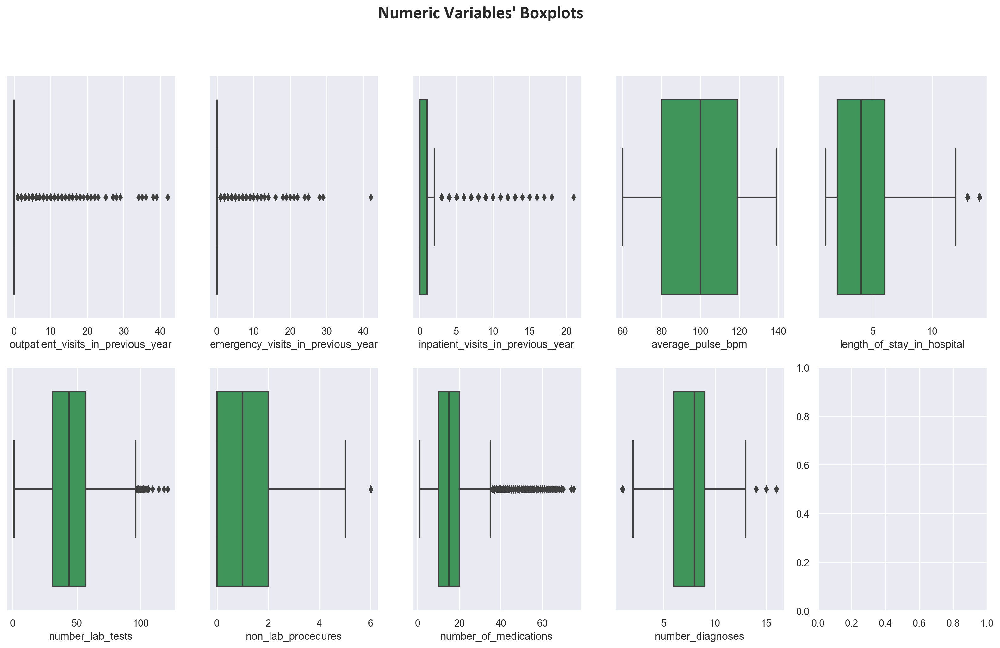

In [48]:
#numeric variables' Boxplots
sns.set()

#plot data
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=train[feat], ax=ax, color='#31a354')

title = "Numeric Variables' Boxplots"

plt.suptitle(title, size=20, weight='bold', family='Calibri')

plt.show()

In [49]:
print("Approximate number of outliers in non_lab_procedures is {}".format(len(train[train["non_lab_procedures"] > 5])))
print("Approximate number of outliers in number_diagnoses is {}".format(len(train[train["number_diagnoses"] > 13])))
print("Approximate number of outliers in length_of_stay_in_hospital is {}".format(len(train[train["length_of_stay_in_hospital"] > 12])))
print("Approximate number of outliers in number_of_medications is {}".format(len(train[train["number_of_medications"] > 35])))
print("Approximate number of outliers in number_lab_tests is {}".format(len(train[train["number_lab_tests"] > 97])))
print("Approximate number of outliers in outpatient_visits_in_previous_year is {}".format(len(train[train["outpatient_visits_in_previous_year"] > 0])))
print("Approximate number of outliers in inpatient_visits_in_previous_year is {}".format(len(train[train["inpatient_visits_in_previous_year"] > 3])))
print("Approximate number of outliers in emergency_visits_in_previous_year is {}".format(len(train[train["emergency_visits_in_previous_year"] > 0])))

Approximate number of outliers in non_lab_procedures is 2489
Approximate number of outliers in number_diagnoses is 31
Approximate number of outliers in length_of_stay_in_hospital is 1128
Approximate number of outliers in number_of_medications is 1272
Approximate number of outliers in number_lab_tests is 48
Approximate number of outliers in outpatient_visits_in_previous_year is 8154
Approximate number of outliers in inpatient_visits_in_previous_year is 1790
Approximate number of outliers in emergency_visits_in_previous_year is 5622


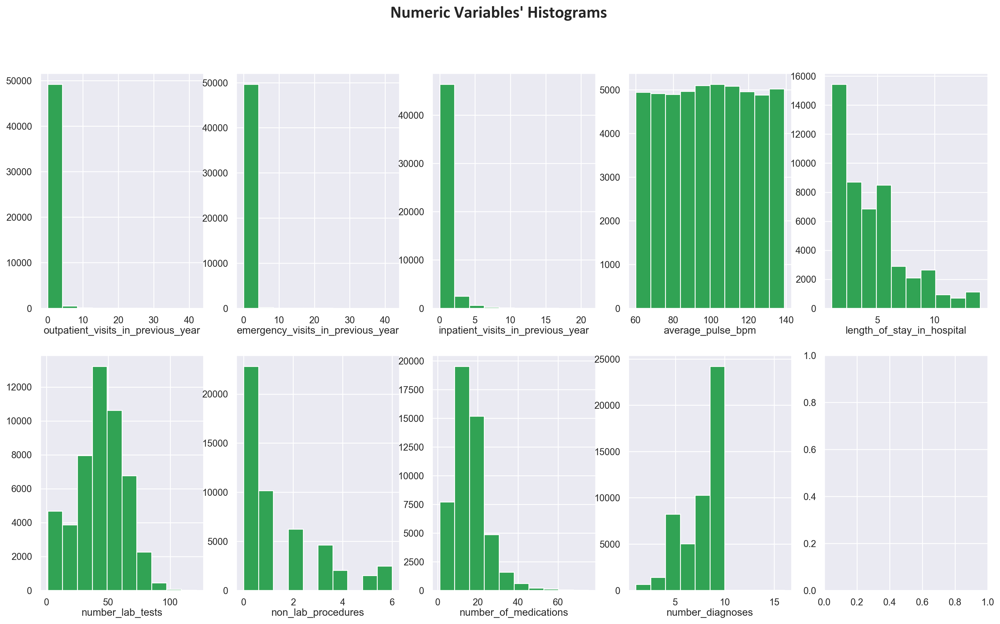

In [50]:
# All Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(
        axes.flatten(),
        metric_features):  # Notice the zip() function and flatten() method
    ax.hist(train[feat], color='#31a354')
    ax.set_title(feat, y=-0.13)

# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms"

plt.suptitle(title, size=20, weight='bold', family='Calibri')

plt.show()

Looking to the greater picture, we can point outpatient_visits_in_previous_year, emergency_visits_in_previous_year, inpatient_visits_in_previous_year, number_lab_tests and number_of_medications for further investigation.

<Axes: xlabel='emergency_visits_in_previous_year'>

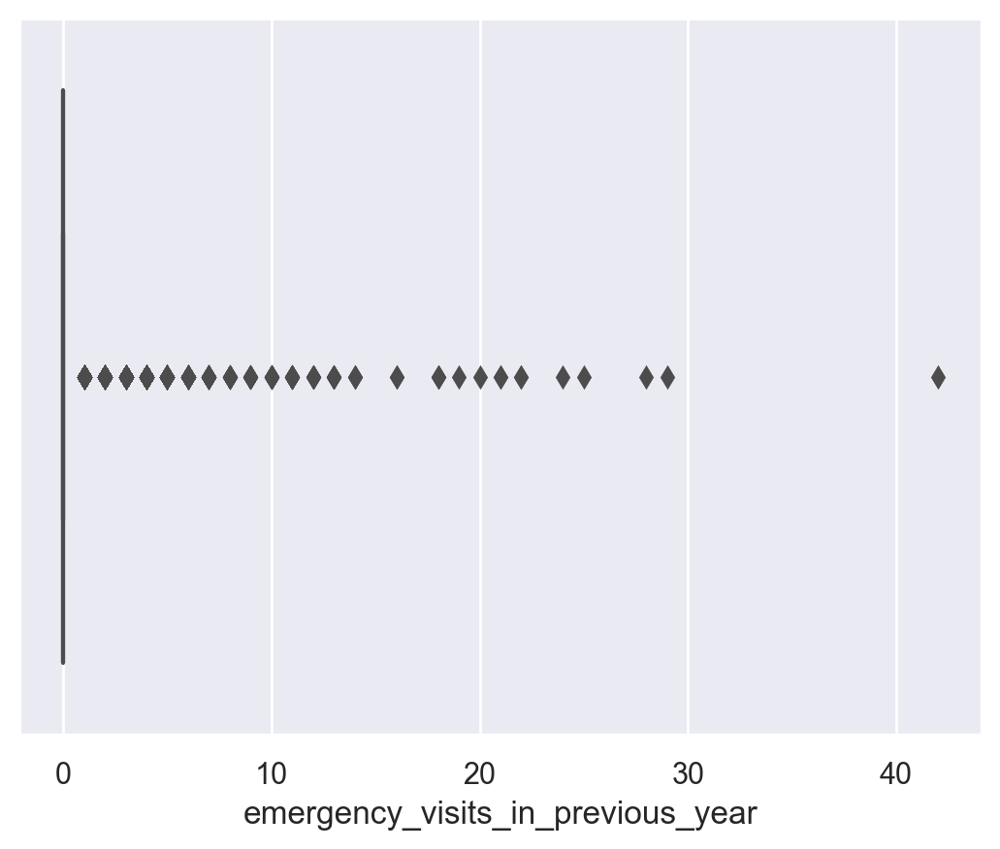

In [51]:
sns.boxplot(x='emergency_visits_in_previous_year', data = train)

<Axes: xlabel='inpatient_visits_in_previous_year', ylabel='Count'>

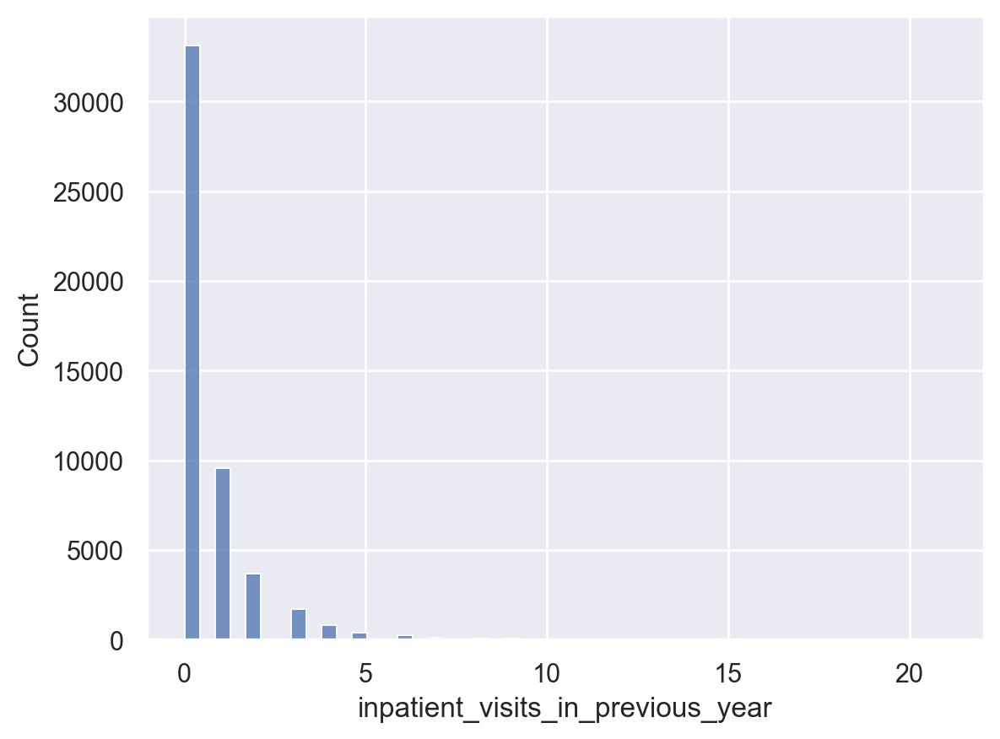

In [52]:
sns.histplot(x='inpatient_visits_in_previous_year', data = train, bins = 50)

In [53]:
filters1_train = (
    (train['outpatient_visits_in_previous_year']<=20)  
    &
    (train['inpatient_visits_in_previous_year']<=16)
    &
    (train['emergency_visits_in_previous_year']<=15)
    &
    (train['number_lab_tests']<=100)
    &
    (train['number_of_medications']<=70)
    & 
    (train['number_diagnoses']<13)
    & 
    (train['number_diagnoses']>2)
)

train1 = train[filters1_train]
print('Percentage of data kept after removing outliers:', np.round(train1.shape[0] / train.shape[0], 4))

Percentage of data kept after removing outliers: 0.9849


In [54]:
q25 = train[metric_features].quantile(.25)
q75 = train[metric_features].quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters2 = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters2.append(train[metric].between(llim, ulim, inclusive='both'))

filters2 = pd.Series(np.all(filters2, 0))
filters2.index = train.index  # Reindexing to match DataFrame indices

train2 = train[filters2]
print('Percentage of data kept after removing outliers:', np.round(train2.shape[0] / train.shape[0], 4)*100)

Percentage of data kept after removing outliers: 65.83


In [55]:
train3 = train[(filters1_train | filters2)]
print('Percentage of data kept after removing outliers:', np.round(train3.shape[0] / train.shape[0], 4)*100)

Percentage of data kept after removing outliers: 99.39


In [56]:
train = train3.copy()

### 4.4. Incoherencies

In [57]:
print("The percentage of expired patients is {:.2%}".format(len(train[(train["discharge_disposition"] == "Expired at home. Medicaid only, hospice.") | (train["discharge_disposition"] == "Expired in a medical facility. Medicaid only, hospice.") | (train["discharge_disposition"] == "Expired")]) / len(train)))

The percentage of expired patients is 1.61%


In [58]:
train = train[~((train["discharge_disposition"] == "Expired at home. Medicaid only, hospice.") |
             (train["discharge_disposition"] == "Expired in a medical facility. Medicaid only, hospice.") |
             (train["discharge_disposition"] == "Expired"))]

In [59]:
#Separating expired individuals from val and test
val_expired = val[((val["discharge_disposition"] == "Expired at home. Medicaid only, hospice.") |
                          (val["discharge_disposition"] == "Expired in a medical facility. Medicaid only, hospice.") |
                          (val["discharge_disposition"] == "Expired"))]

val_expired['readmitted_binary'] = 'No'
val_expired = val_expired[['encounter_id', 'readmitted_binary']]

In [60]:
val = val[~((val["discharge_disposition"] == "Expired at home. Medicaid only, hospice.") |
                          (val["discharge_disposition"] == "Expired in a medical facility. Medicaid only, hospice.") |
                          (val["discharge_disposition"] == "Expired"))]

In [61]:
test_expired = test[((test["discharge_disposition"] == "Expired at home. Medicaid only, hospice.") |
                          (test["discharge_disposition"] == "Expired in a medical facility. Medicaid only, hospice.") |
                          (test["discharge_disposition"] == "Expired"))]

test_expired['readmitted_binary'] = 'No'
test_expired = test_expired[['encounter_id', 'readmitted_binary']]

In [62]:
test = test[~((test["discharge_disposition"] == "Expired at home. Medicaid only, hospice.") |
                          (test["discharge_disposition"] == "Expired in a medical facility. Medicaid only, hospice.") |
                          (test["discharge_disposition"] == "Expired"))]

In [63]:
# Define the conditions
condition1 = (train['primary_diagnosis'] == train['secondary_diagnosis']) & (train['secondary_diagnosis'] != train['additional_diagnosis'])
condition2 = (train['primary_diagnosis'] == train['additional_diagnosis']) & (train['secondary_diagnosis'] != train['primary_diagnosis'])
condition3 = (train['secondary_diagnosis'] == train['additional_diagnosis']) & (train['primary_diagnosis'] != train['secondary_diagnosis'])
condition4 = (train['primary_diagnosis'] == train['additional_diagnosis']) & (train['primary_diagnosis'] == train['secondary_diagnosis'])

# Replace values based on conditions
# Replace values in 'secondary_diagnosis' with values from 'additional_diagnosis'
train.loc[condition1, 'secondary_diagnosis'] = train.loc[condition1, 'additional_diagnosis']
train.loc[condition1, 'additional_diagnosis'] = 'No diagnosis'
train.loc[condition2, 'additional_diagnosis'] = 'No diagnosis'
train.loc[condition3, 'additional_diagnosis'] = 'No diagnosis'
train.loc[condition4, ['secondary_diagnosis', 'additional_diagnosis']] = 'No diagnosis'

In [64]:
# Define the conditions
condition1 = (val['primary_diagnosis'] == val['secondary_diagnosis']) & (val['secondary_diagnosis'] != val['additional_diagnosis'])
condition2 = (val['primary_diagnosis'] == val['additional_diagnosis']) & (val['secondary_diagnosis'] != val['primary_diagnosis'])
condition3 = (val['secondary_diagnosis'] == val['additional_diagnosis']) & (val['primary_diagnosis'] != val['secondary_diagnosis'])
condition4 = (val['primary_diagnosis'] == val['additional_diagnosis']) & (val['primary_diagnosis'] == val['secondary_diagnosis'])

# Replace values based on conditions
# Replace values in 'secondary_diagnosis' with values from 'additional_diagnosis'
val.loc[condition1, 'secondary_diagnosis'] = val.loc[condition1, 'additional_diagnosis']
val.loc[condition1, 'additional_diagnosis'] = 'No diagnosis'
val.loc[condition2, 'additional_diagnosis'] = 'No diagnosis'
val.loc[condition3, 'additional_diagnosis'] = 'No diagnosis'
val.loc[condition4, ['secondary_diagnosis', 'additional_diagnosis']] = 'No diagnosis'

In [65]:
# Define the conditions
condition1 = (test['primary_diagnosis'] == test['secondary_diagnosis']) & (test['secondary_diagnosis'] != test['additional_diagnosis'])
condition2 = (test['primary_diagnosis'] == test['additional_diagnosis']) & (test['secondary_diagnosis'] != test['primary_diagnosis'])
condition3 = (test['secondary_diagnosis'] == test['additional_diagnosis']) & (test['primary_diagnosis'] != test['secondary_diagnosis'])
condition4 = (test['primary_diagnosis'] == test['additional_diagnosis']) & (test['primary_diagnosis'] == test['secondary_diagnosis'])

# Replace values based on conditions
# Replace values in 'secondary_diagnosis' with values from 'additional_diagnosis'
test.loc[condition1, 'secondary_diagnosis'] = test.loc[condition1, 'additional_diagnosis']
test.loc[condition1, 'additional_diagnosis'] = 'No diagnosis'
test.loc[condition2, 'additional_diagnosis'] = 'No diagnosis'
test.loc[condition3, 'additional_diagnosis'] = 'No diagnosis'
test.loc[condition4, ['secondary_diagnosis', 'additional_diagnosis']] = 'No diagnosis'

In [66]:
#No inconsistencies found 
train[(train['prescribed_diabetes_meds'] == 'Yes') & (train['medication'] == '[]')]

,encounter_id,patient_id,race,gender,age,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,average_pulse_bpm,discharge_disposition,admission_source,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,number_of_medications,primary_diagnosis,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication,readmitted_binary


In [67]:
val[(val['prescribed_diabetes_meds'] == 'Yes') & (val['medication'] == '[]')]

,encounter_id,patient_id,race,gender,age,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,average_pulse_bpm,discharge_disposition,admission_source,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,number_of_medications,primary_diagnosis,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication,readmitted_binary


In [68]:
test[(test['prescribed_diabetes_meds'] == 'Yes') & (test['medication'] == '[]')]

,encounter_id,patient_id,race,gender,age,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,average_pulse_bpm,discharge_disposition,admission_source,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,number_of_medications,primary_diagnosis,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication


### 4.5. Feature Engineering

In [69]:
train['encounter_count'] = train.groupby('patient_id')['encounter_id'].transform('count')
val['encounter_count'] = val.groupby('patient_id')['encounter_id'].transform('count')
test['encounter_count'] = test.groupby('patient_id')['encounter_id'].transform('count')

In [70]:
train.set_index('encounter_id', inplace = True)
val.set_index('encounter_id', inplace = True)
test.set_index('encounter_id', inplace = True)

In [71]:
train.drop(columns = 'patient_id', inplace = True)
val.drop(columns = 'patient_id', inplace = True)
test.drop(columns = 'patient_id', inplace = True)

In [72]:
specialty_mapping = {
    'AllergyandImmunology': 'AllergyandImmunology',
    'InternalMedicine': 'InternalMedicine',
    'Emergency/Trauma': 'Emergency/Trauma',
    'Family/GeneralPractice': 'Family/GeneralPractice',
    'Cardiology': 'InternalMedicine', 
    'Surgery-General': 'InternalMedicine', 
    'Nephrology': 'InternalMedicine', 
    'Orthopedics': 'Orthopedics',
    'Orthopedics-Reconstructive': 'Orhopedics',
    'Radiologist': 'DiagnosticRadiology', 
    'Pulmonology': 'InternalMedicine',
    'Psychiatry':'Psychiatry',
    'Urology': 'InternalMedicine',
    'ObstetricsandGynecology': 'ObstetricsandGynecology', 
    'Surgery-Cardiovascular/Thoracic': 'GeneralSurgery',
    'Gastroenterology': 'InternalMedicine',
    'Surgery-Vascular': 'GeneralSurgery',
    'Surgery-Neuro': 'GeneralSurgery',
    'PhysicalMedicineandRehabilitation': 'PhysicalMedicineandRehabilitation',
    'Oncology': 'InternalMedicine',
    'Pediatrics': 'Pediatrics',
    'Hematology/Oncology': 'InternalMedicine',
    'Neurology': 'Neurology',
    'Pediatrics-Endocrinology': 'Pediatrics',
    'Otolaryngology': 'Otolaryngology',
    'Surgery-Thoracic': 'GeneralSurgery',
    'Endocrinology': 'InternalMedicine',
    'Podiatry': 'OtherHealthcarePractitioners',
    'Psychology': 'Psychology' ,
    'Surgery-Cardiovascular':'GeneralSurgery',
    'Pediatrics-CriticalCare': 'Pediatrics',
    'Hematology': 'InternalMedicine',
    'Gynecology': 'ObstetricsandGynecology',
    'Radiology': 'DiagnosticRadiology',
    'Hospitalist': 'InternalMedicine',
    'Surgeon': 'GeneralSurgery',
    'Ophthalmology': 'Ophthalmology',
    'Osteopath': 'Osteopath',
    'Surgery-Plastic': 'GeneralSurgery',
    'SurgicalSpecialty': 'GeneralSurgery',
    'InfectiousDiseases': 'InternalMedicine',
    'Obsterics&Gynecology-GynecologicOnco': 'ObstetricsandGynecology',
    'Rheumatology': 'InternalMedicine',
    'Obstetrics': 'ObstetricsandGynecology',
    'Pediatrics-Pulmonology': 'Pediatrics',
    'Pathology': 'Pathology',
    'Anesthesiology-Pediatric': 'Anesthesiology',
    'Pediatrics-Neurology': 'Pediatrics',
    'Surgery-Maxillofacial': 'GeneralSurgery',
    'OutreachServices': 'Other',
    'Surgery-Colon&Rectal': 'GeneralSurgery',
    'Psychiatry-Child/Adolescent': 'Pediatrics',
    'PhysicianNotFound': 'PhysicalMedicineandRehabilitation',
    'Anesthesiology': 'Anesthesiology',
    'Cardiology-Pediatric': 'Pediatrics',
    'Endocrinology-Metabolism': 'InternalMedicine',
    'Dentistry': 'OtherHealthcarePractitioners',
    'Pediatrics-Hematology-Oncology': 'Pediatrics',
    'Surgery-Pediatric': 'GeneralSurgery',
    'DCPTEAM': 'InternalMedicine',
    'Pediatrics-AllergyandImmunology': 'Pediatrics',
    'Resident': 'OtherHealthcarePractitioners',
    'Pediatrics-EmergencyMedicine': 'Pediatrics',
    'Speech': 'OtherHealthcarePractitioners',
    'SportsMedicine': 'InternalMedicine',
    'Pediatrics-InfectiousDiseases': 'Pediatrics',
    'Proctology': 'InternalMedicine', 
    'Neurophysiology': 'InternalMedicine'
}

# Apply the mapping
train['medical_specialty'] = train['medical_specialty'].replace(specialty_mapping, regex=True)
val['medical_specialty'] = val['medical_specialty'].replace(specialty_mapping, regex=True)
test['medical_specialty'] = test['medical_specialty'].replace(specialty_mapping, regex=True)

In [73]:
def diagnosis_code(i):
    if pd.isna(i) or i == 'No diagnosis':
        return i
    i = str(i) # to make the code subscriptable
    if (i[0].isnumeric() == True): # if the code begins with a number
        i = pd.to_numeric(i) # change the code from categorical to numeric dtype
        # assign a code group to each code
        if (1 >= i <= 139):
            return "Infectious and parasitic diseases"
        elif (140 <= i <= 239):
            return "Neoplasms"
        elif (240 <= i <= 279):
            return "Endocrine, nutritional and metabolic diseases, and immunity disorders"
        elif (280 <= i <= 289):
            return "Blood and blood-forming organs diseases"
        elif (290 <= i <= 319):
            return "Mental disorders"
        elif (320 <= i <= 389):
            return "Nervous system and sense organs diseases"
        elif (390 <= i <= 459):
            return "Circulatory system diseases"
        elif (460 <= i <= 519):
            return "Respiratory system diseases"
        elif (520 <= i <= 579):
            return "Digestive system diseases"
        elif (580 <= i <= 629):
            return "Genitourinary system diseases"
        elif (630 <= i <= 679):
            return "Complications of pregnancy, childbirth, and the puerperium"
        elif (680 <= i <= 709):
            return "Skin and subcutaneous tissue diseases"
        elif (710 <= i <= 739):
            return "Musculoskeletal system and connective tissue diseases"
        elif (740 <= i <= 759):
            return "Congenital anomalies"
        elif (760 <= i <= 779):
            return "Conditions originating in the perinatal period"
        elif (780 <= i <= 799):
            return "Symptoms, signs, and ill-defined conditions"
        else:
            return "Injury and poisoning"
    else: # if the code does not begin with a number
        return "External causes of injury and supplemental classification"

In [74]:
train["primary_diagnosis"] = train["primary_diagnosis"].apply(diagnosis_code)
train["secondary_diagnosis"] = train["secondary_diagnosis"].apply(diagnosis_code)
train["additional_diagnosis"] = train["additional_diagnosis"].apply(diagnosis_code)

In [75]:
val["primary_diagnosis"] = val["primary_diagnosis"].apply(diagnosis_code)
val["secondary_diagnosis"] = val["secondary_diagnosis"].apply(diagnosis_code)
val["additional_diagnosis"] = val["additional_diagnosis"].apply(diagnosis_code)

In [76]:
test["primary_diagnosis"] = test["primary_diagnosis"].apply(diagnosis_code)
test["secondary_diagnosis"] = test["secondary_diagnosis"].apply(diagnosis_code)
test["additional_diagnosis"] = test["additional_diagnosis"].apply(diagnosis_code)

In [77]:
train['has_insurance'] = train['payer_code'].apply(lambda x: 0 if x == 'No Insurance/Unknown' else 1)
val['has_insurance'] = val['payer_code'].apply(lambda x: 0 if x == 'No Insurance/Unknown' else 1)
test['has_insurance'] = test['payer_code'].apply(lambda x: 0 if x == 'No Insurance/Unknown' else 1)

In [78]:
age_group = {
    '[0-10)': 'Child',
    '[10-20)': 'Teen',
    '[20-30)': 'Young Adult',
    '[30-40)': 'Adult',
    '[40-50)': 'Adult',
    '[50-60)': 'Adult',
    '[60-70)': 'Elderly',
    '[70-80)': 'Elderly',
    '[80-90)': 'Elderly',
    '[90-100)': 'Elderly'
}

train['age_groups'] = train['age'].map(age_group)
val['age_groups'] = val['age'].map(age_group)
test['age_groups'] = test['age'].map(age_group)

In [79]:
train['total_visits_in_previous_year'] = train['outpatient_visits_in_previous_year'] + train['inpatient_visits_in_previous_year'] + train['emergency_visits_in_previous_year']
val['total_visits_in_previous_year'] = val['outpatient_visits_in_previous_year'] + val['inpatient_visits_in_previous_year'] + val['emergency_visits_in_previous_year']
test['total_visits_in_previous_year'] = test['outpatient_visits_in_previous_year'] + test['inpatient_visits_in_previous_year'] + test['emergency_visits_in_previous_year']

In [80]:
# Convert 'medication' column from string to list
train['medication'] = train['medication'].apply(ast.literal_eval)

# Create binary column for Type II diabetes
train['type_II_diabetes'] = train['medication'].apply(lambda x: 1 if (len(x) == 1 and x[0] != 'insulin') or len(x) > 1 else 0)

In [81]:
# Convert 'medication' column from string to list
val['medication'] = val['medication'].apply(ast.literal_eval) 

# Create binary column for Type II diabetes
val['type_II_diabetes'] = val['medication'].apply(lambda x: 1 if (len(x) == 1 and x[0] != 'insulin') or len(x) > 1 else 0)

In [82]:
# Convert 'medication' column from string to list
test['medication'] = test['medication'].apply(ast.literal_eval) 

# Create binary column for Type II diabetes
test['type_II_diabetes'] = test['medication'].apply(lambda x: 1 if (len(x) == 1 and x[0] != 'insulin') or len(x) > 1 else 0)

In [83]:
train['medication'] = train['medication'].apply(str)
val['medication'] = val['medication'].apply(str)
test['medication'] = test['medication'].apply(str)

In [84]:
train['medication'].replace('[]', 'No Medication', inplace = True)
val['medication'].replace('[]', 'No Medication', inplace = True)
test['medication'].replace('[]', 'No Medication', inplace = True)

In [85]:
#Update metric and non_metric_features 
metric_features = ['encounter_count','outpatient_visits_in_previous_year', 'emergency_visits_in_previous_year', 'inpatient_visits_in_previous_year','total_visits_in_previous_year','average_pulse_bpm','length_of_stay_in_hospital','number_lab_tests', 'non_lab_procedures', 'number_of_medications', 'number_diagnoses']
non_metric_features = ['race','gender','age','age_groups', 'payer_code','has_insurance','admission_type','discharge_disposition', 'admission_source','primary_diagnosis','secondary_diagnosis','additional_diagnosis','glucose_test_result', 'a1c_test_result','change_in_meds_during_hospitalization', 'prescribed_diabetes_meds', 'medication', 'type_II_diabetes','medical_specialty']

### 4.6. Visualizations

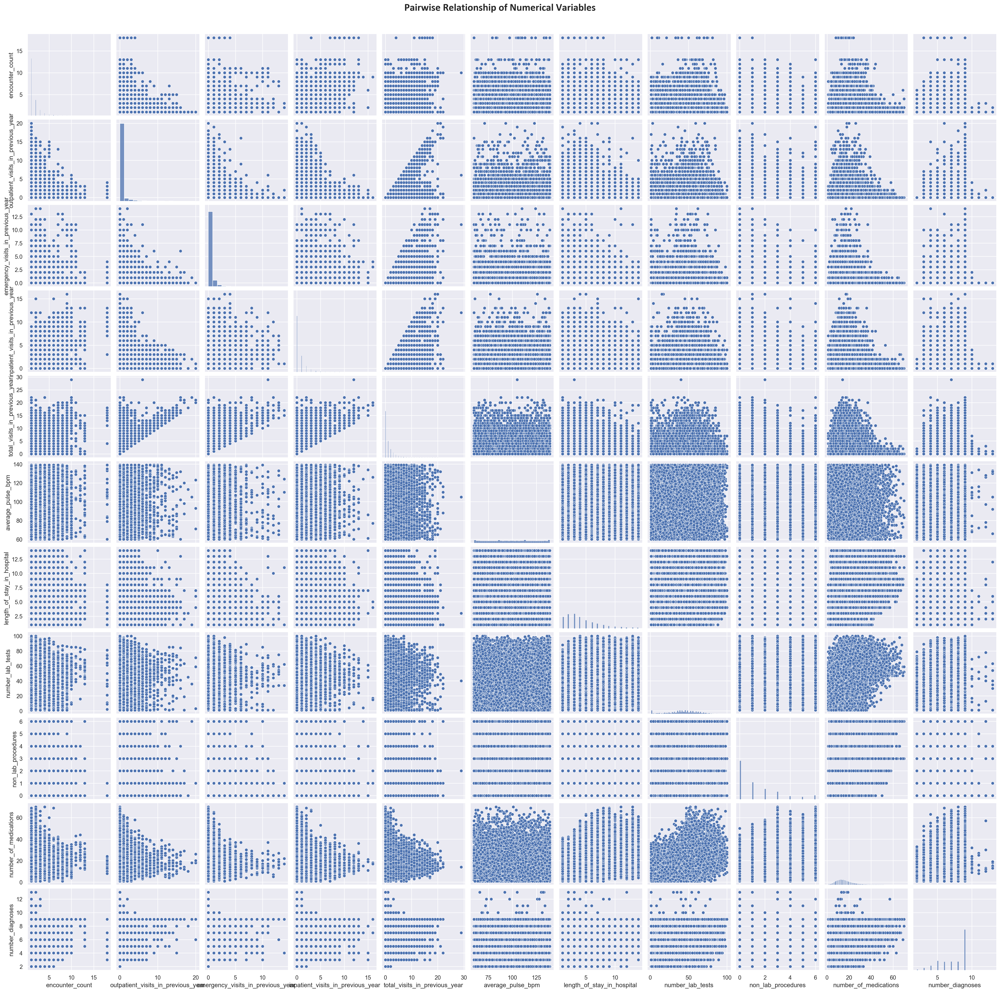

In [86]:
# Pairwise Relationship of Numerical Variables
palette = sns.light_palette("seagreen", as_cmap=True)
sns.set()

# Setting pairplot
sns.pairplot(train[metric_features], palette='#31a354', diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20, family='Calibri', weight='bold')

plt.show()

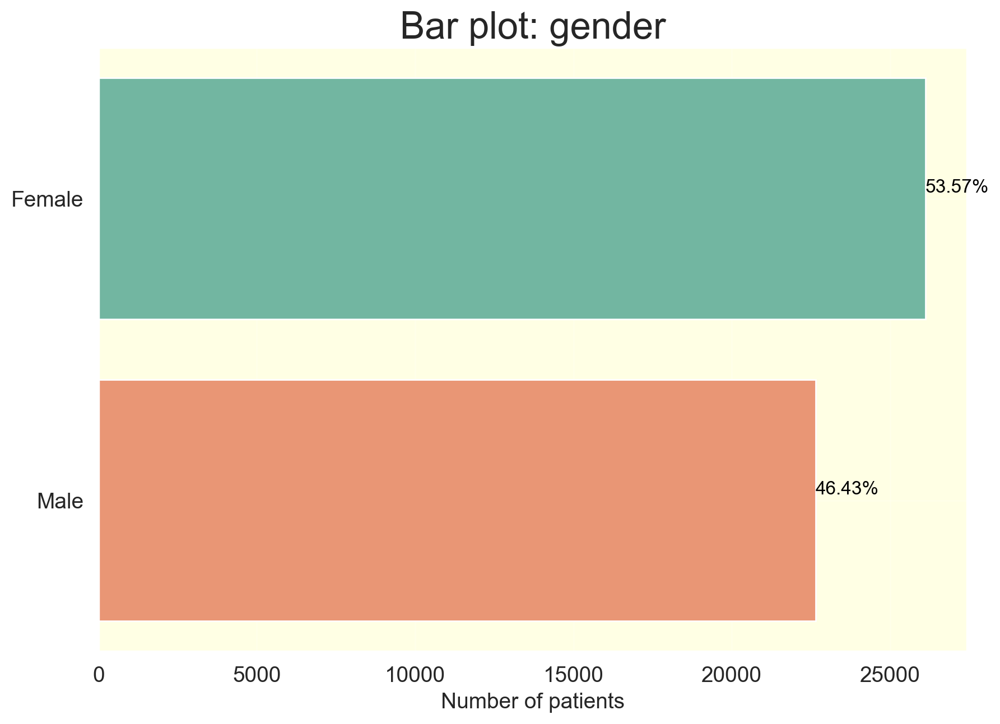

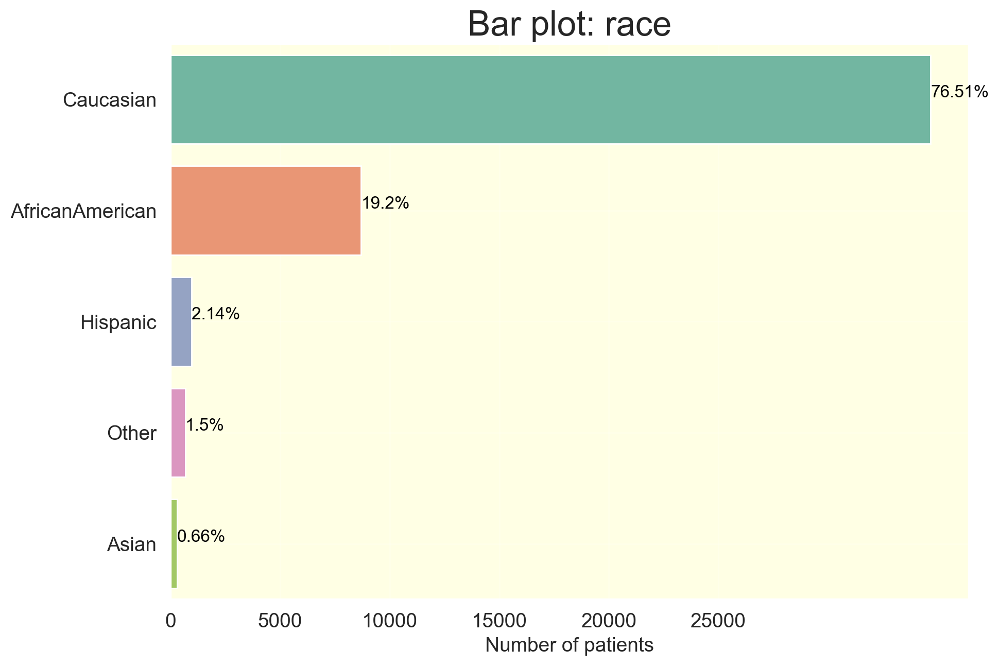

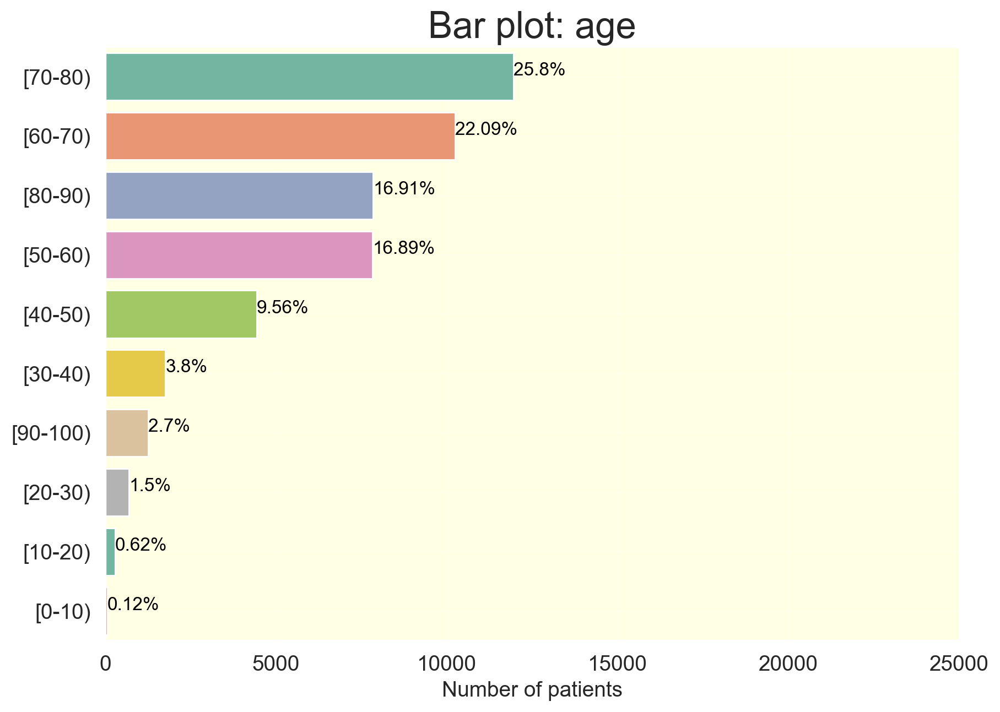

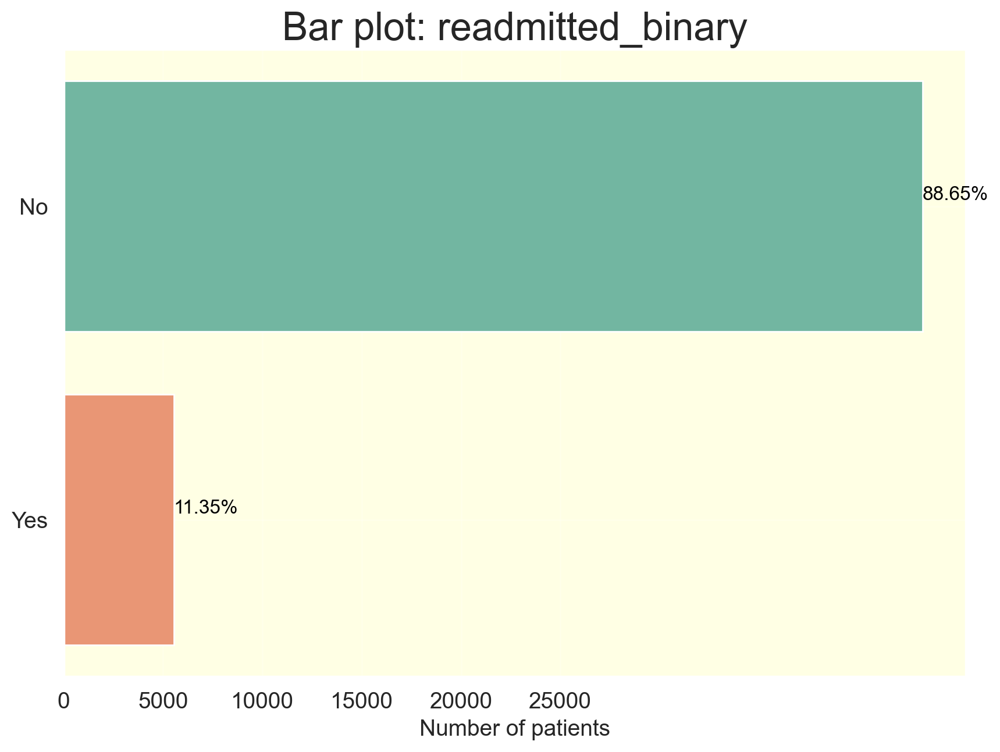

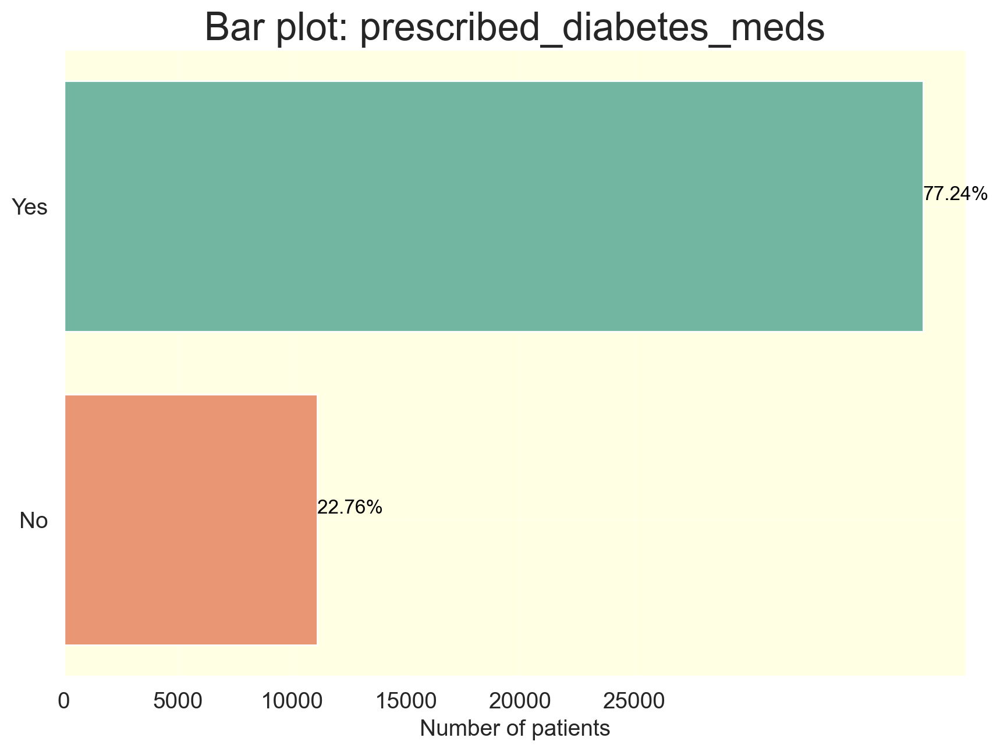

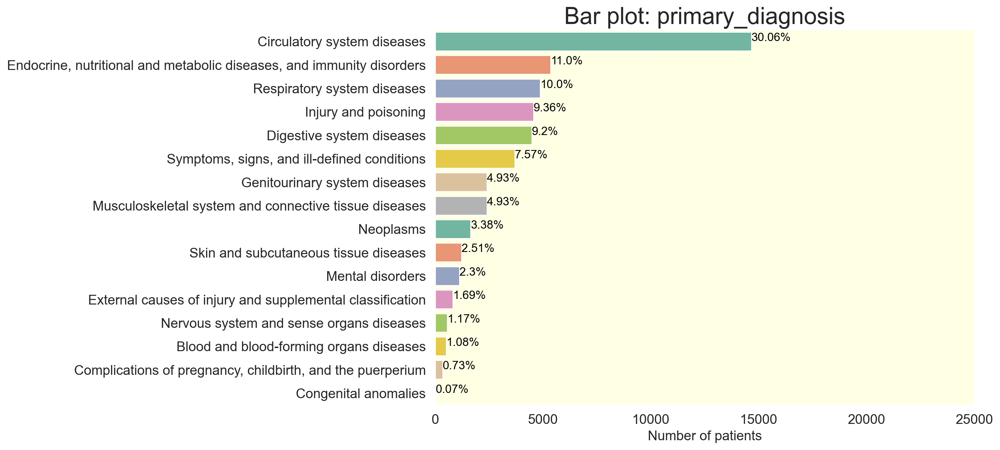

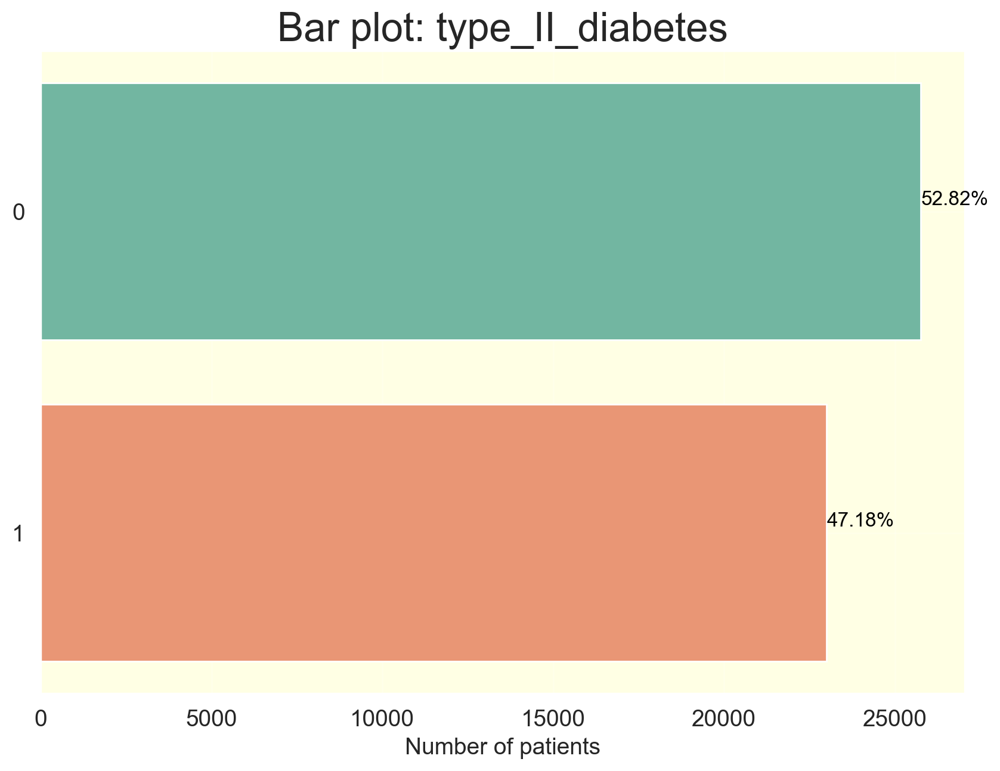

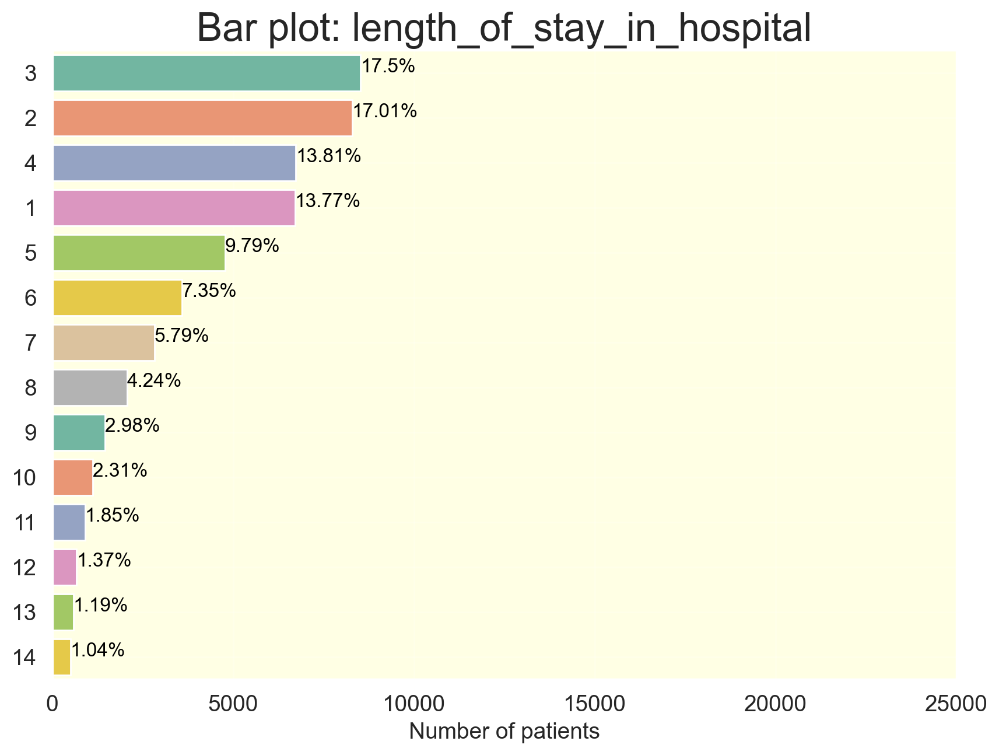

In [87]:
def plot_categorical_distribution(data, column):
    plt.figure(figsize=(10, 7))
    ax = sns.countplot(y=column, data=data, order=data[column].value_counts().index, palette="Set2")
    ax.set_alpha(0.8)
    ax.set_title("Bar plot: {}".format(column), fontsize=24)
    ax.set_xlabel("Number of patients", fontsize=14)
    ax.set_ylabel("")
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_xticks(range(0, 30000, 5000))
    ax.set_facecolor('xkcd:off white')
    ax.grid(alpha=0.2)

    # Add percentages to individual bars
    totals = []
    for i in ax.patches:
        totals.append(i.get_width())
    total = sum(totals)

    for i in ax.patches:
        ax.text(i.get_width() + .3, i.get_y() + .38, str(round((i.get_width() / total) * 100, 2)) + '%', fontsize=12,
                color='black')

    plt.show()
    print()

#List of columns to visualize
temp = ["gender", "race", "age", "readmitted_binary", "prescribed_diabetes_meds", "primary_diagnosis", "type_II_diabetes", "length_of_stay_in_hospital"]

# Loop through columns and generate plots
for col in temp:
    plot_categorical_distribution(train, col)

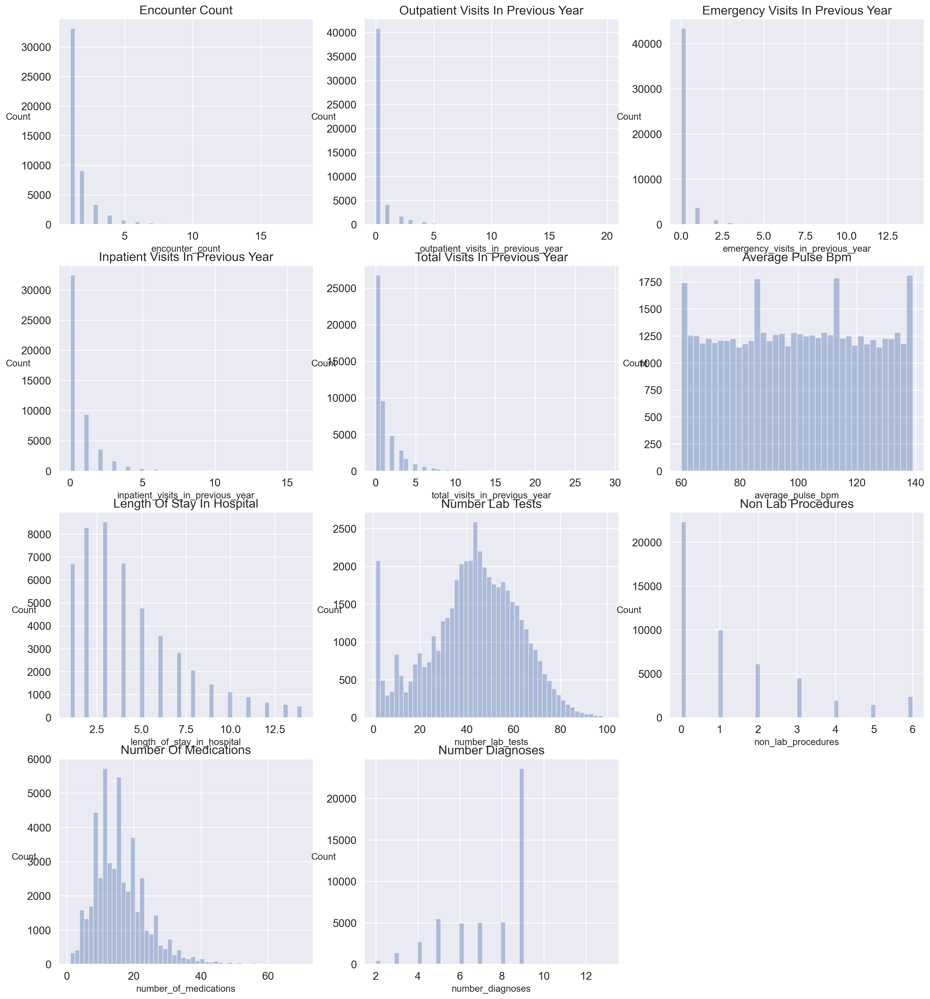

In [88]:
num_features = len(metric_features)
num_rows, num_cols = divmod(num_features, 3)  # Calculate the number of rows and columns

if num_cols > 0:
    num_rows += 1

fig, axes = plt.subplots(num_rows, 3, figsize=(20, 22))
sns.set_style("darkgrid")

for i, col in enumerate(metric_features):
    row, col_idx = divmod(i, 3)
    axes[row, col_idx].set_title(f"{col.replace('_', ' ').title()}", fontsize=16)
    sns.distplot(train[col], kde=False, ax=axes[row, col_idx])
    axes[row, col_idx].tick_params(labelsize=14)
    axes[row, col_idx].set_ylabel("Count", fontsize=12, rotation=0)

# Remove any empty subplots
for i in range(num_features, num_rows * 3):
    fig.delaxes(axes[divmod(i, 3)])

plt.show()

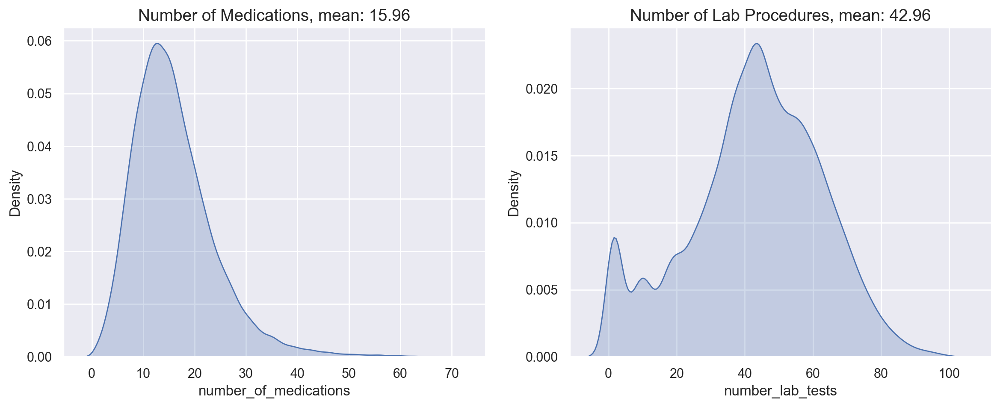

In [89]:
plt.figure(figsize=(14,5))

plt.subplot(1,2,1)
sns.kdeplot(train['number_of_medications'], shade=True, legend=False)
plt.title(f"Number of Medications, mean: {train['number_of_medications'].mean():.2f}", size=14)

plt.subplot(1,2,2)
sns.kdeplot(train['number_lab_tests'], shade=True, legend=False)
plt.title(f"Number of Lab Procedures, mean: {train['number_lab_tests'].mean():.2f}", size=14)
plt.show()

In [90]:
(train.prescribed_diabetes_meds.value_counts()/len(train))*100

prescribed_diabetes_meds
Yes    77.238707
No     22.761293
Name: count, dtype: float64

In [91]:
(train.race.value_counts()/len(train))*100 #78% of the customers are caucasian 

race
Caucasian          71.099309
AfricanAmerican    17.841983
Hispanic            1.984949
Other               1.390284
Asian               0.609018
Name: count, dtype: float64

In [92]:
(train.outpatient_visits_in_previous_year.value_counts()/len(train))*100 #83% of the obs are 0  

outpatient_visits_in_previous_year
0     83.700043
1      8.444235
2      3.440851
3      1.999303
4      1.064244
5      0.502389
6      0.280928
7      0.145590
8      0.100478
9      0.079972
10     0.067669
11     0.041011
13     0.028708
12     0.028708
14     0.028708
15     0.020506
16     0.010253
17     0.006152
20     0.006152
19     0.002051
18     0.002051
Name: count, dtype: float64

In [93]:
(train.emergency_visits_in_previous_year.value_counts()/len(train))*100 #88% of the obs are 0  

emergency_visits_in_previous_year
0     88.818258
1      7.593250
2      2.064921
3      0.701294
4      0.358849
5      0.164045
6      0.092276
7      0.061517
10     0.032809
8      0.030759
11     0.028708
9      0.022556
13     0.014354
12     0.012303
14     0.004101
Name: count, dtype: float64

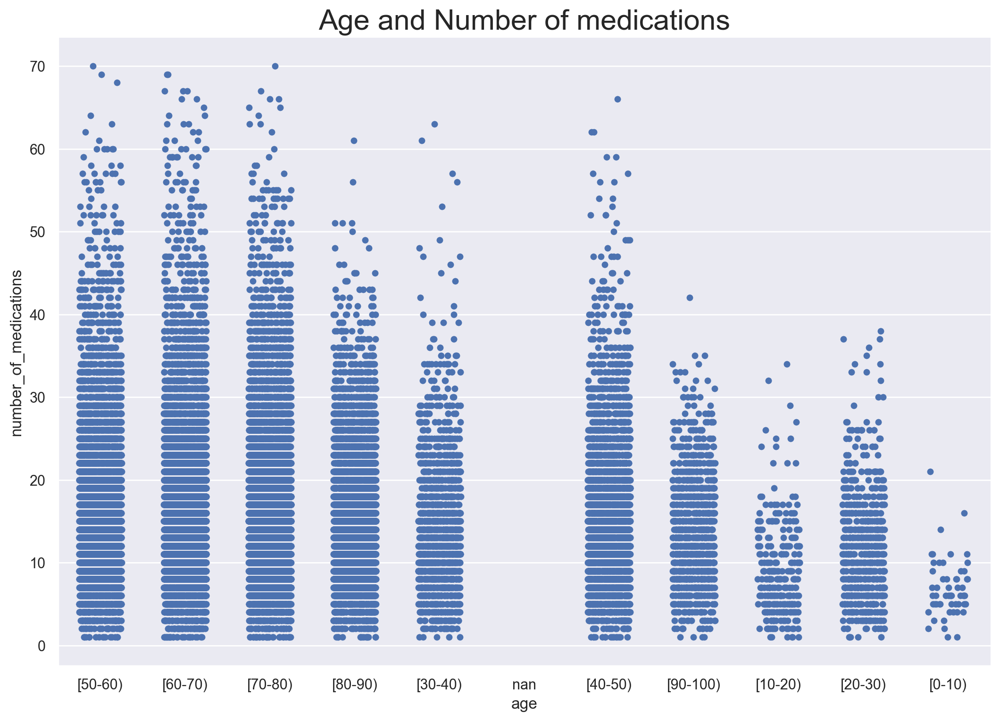

In [94]:
sns.catplot(x = "age", y = "number_of_medications", data=train, jitter = "0.25")
plt.gcf().set_size_inches(12, 8)
plt.title("Age and Number of medications", fontsize = 22)
plt.show()

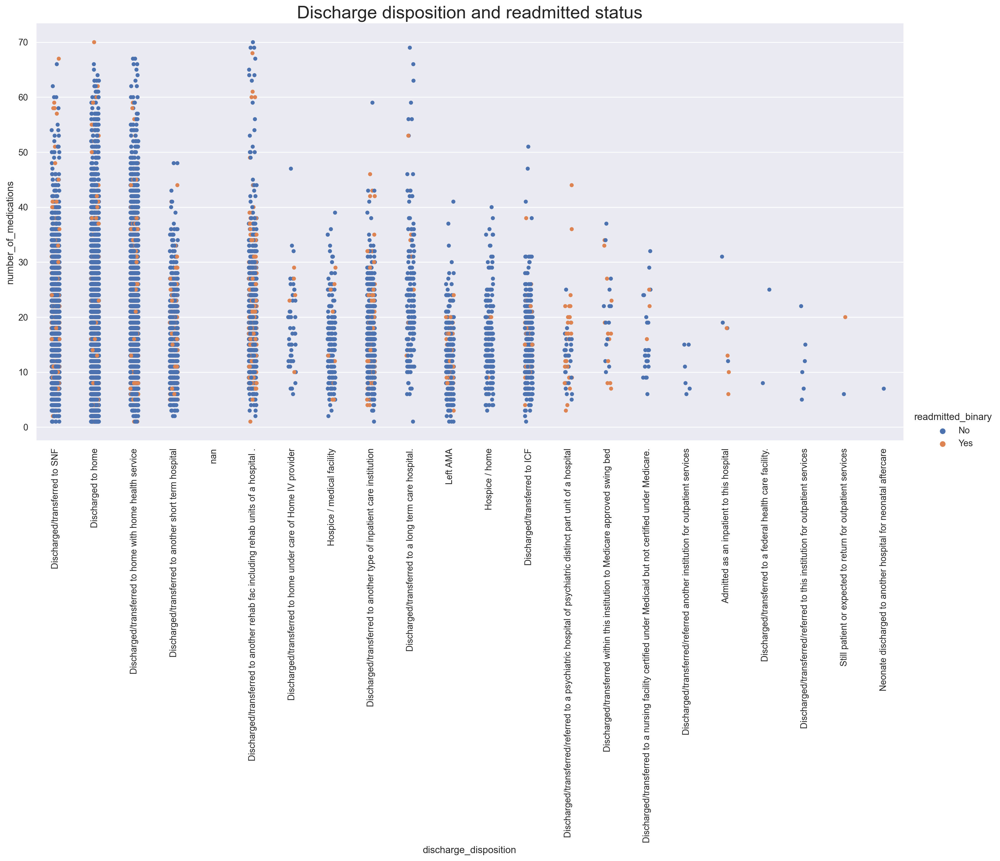

In [95]:
sns.catplot(x="discharge_disposition", y="number_of_medications", hue="readmitted_binary", data=train,height=8, aspect=2)
plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.title("Discharge disposition and readmitted status", fontsize=22)
plt.show()

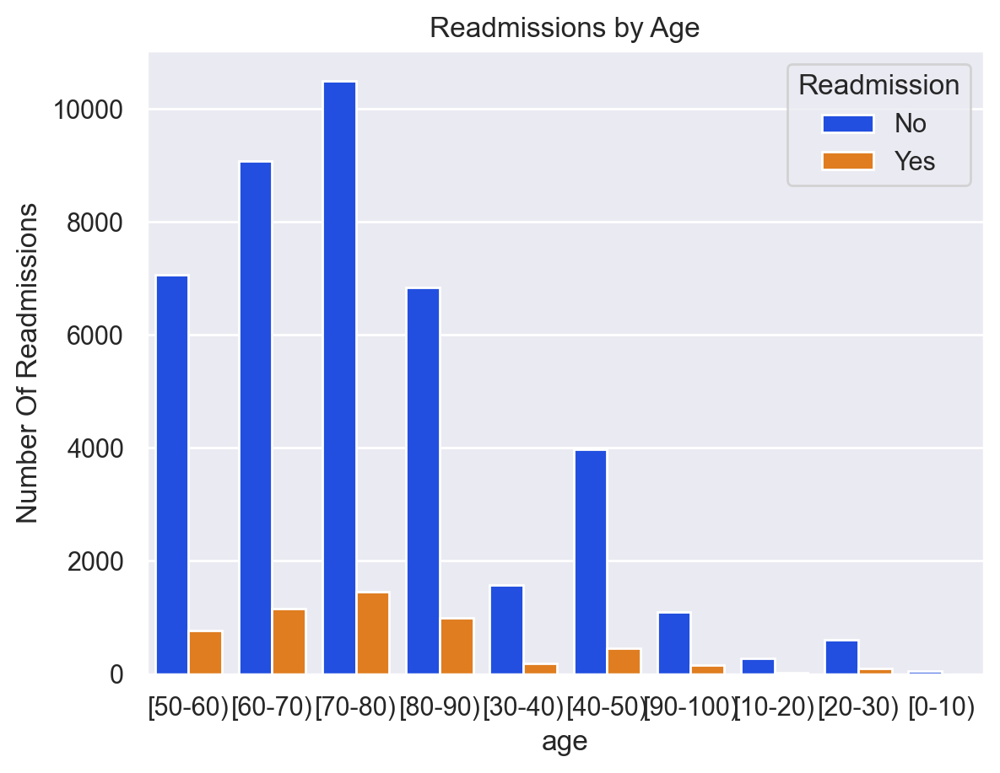

In [96]:
c =  sns.countplot(x = 'age', hue='readmitted_binary', data = train, palette="bright" )
c.set(title='Readmissions by Age')
c.set_ylabel('Number Of Readmissions')
plt.legend(title = 'Readmission')

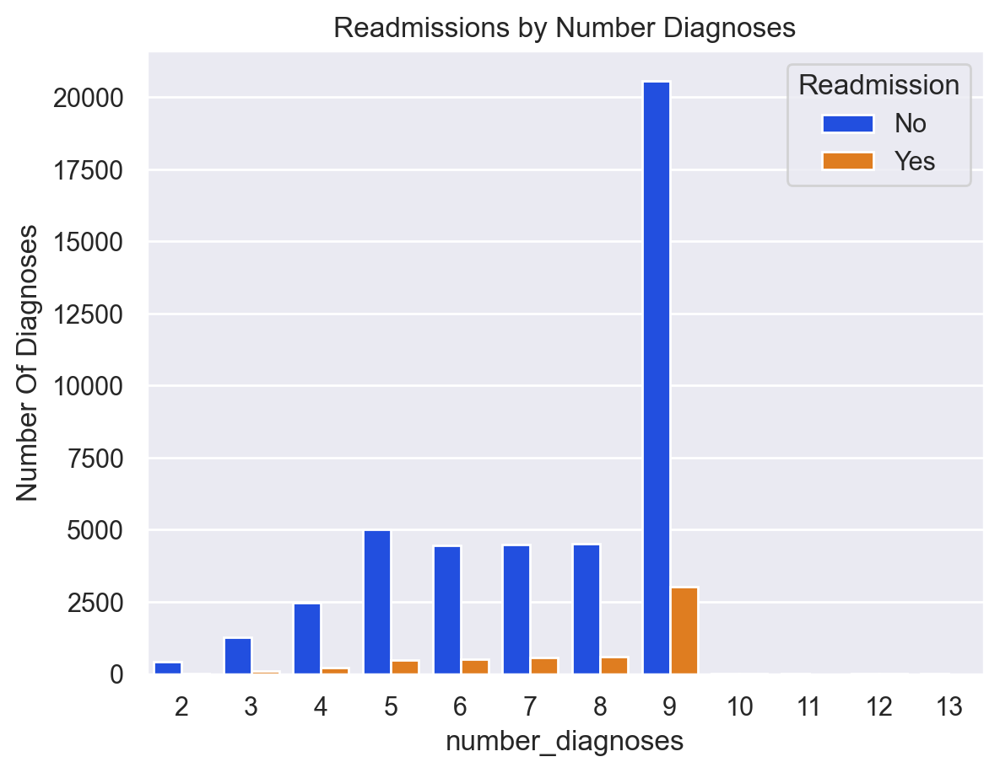

In [97]:
c = sns.countplot(x = 'number_diagnoses', hue='readmitted_binary', data = train, palette="bright" )
c.set(title='Readmissions by Number Diagnoses')
c.set_ylabel('Number Of Diagnoses')
plt.legend(title = 'Readmission')

### 4.7. Encoding

#### Dummy variables

In [98]:
train['caucasian'] = train['race'].apply(lambda x: 1 if pd.notna(x) and x == 'Caucasian' else (np.nan if pd.isna(x) else 0))
val['caucasian'] = val['race'].apply(lambda x: 1 if pd.notna(x) and x == 'Caucasian' else (np.nan if pd.isna(x) else 0))
test['caucasian'] = test['race'].apply(lambda x: 1 if pd.notna(x) and x == 'Caucasian' else (np.nan if pd.isna(x) else 0))

In [99]:
train.drop(columns = 'race', inplace = True)
val.drop(columns = 'race', inplace = True)
test.drop(columns = 'race', inplace = True)

In [100]:
non_metric_features = ['age','caucasian','gender','age_groups', 'payer_code','has_insurance','admission_type','discharge_disposition', 'admission_source','primary_diagnosis','secondary_diagnosis', 'additional_diagnosis','glucose_test_result','a1c_test_result','change_in_meds_during_hospitalization', 'prescribed_diabetes_meds', 'medication', 'type_II_diabetes','medical_specialty']

In [101]:
train['prescribed_diabetes_meds'].replace('Yes', 1, inplace = True)
train['prescribed_diabetes_meds'].replace('No', 0, inplace = True)

train['change_in_meds_during_hospitalization'].replace('Ch', 1, inplace = True)
train['change_in_meds_during_hospitalization'].replace('No', 0, inplace = True)

train['readmitted_binary'].replace('Yes', 1, inplace = True)
train['readmitted_binary'].replace('No', 0, inplace = True)

train['gender'].replace('Female', 1, inplace = True)
train['gender'].replace('Male', 0, inplace = True) 

In [102]:
val['prescribed_diabetes_meds'].replace('Yes', 1, inplace = True)
val['prescribed_diabetes_meds'].replace('No', 0, inplace = True)

val['change_in_meds_during_hospitalization'].replace('Ch', 1, inplace = True)
val['change_in_meds_during_hospitalization'].replace('No', 0, inplace = True)

val['readmitted_binary'].replace('Yes', 1, inplace = True)
val['readmitted_binary'].replace('No', 0, inplace = True) 

val_expired['readmitted_binary'].replace('No', 0, inplace = True) 

val['gender'].replace('Female', 1, inplace = True)
val['gender'].replace('Male', 0, inplace = True) 

In [103]:
test['prescribed_diabetes_meds'].replace('Yes', 1, inplace = True)
test['prescribed_diabetes_meds'].replace('No', 0, inplace = True)

test['change_in_meds_during_hospitalization'].replace('Ch', 1, inplace = True)
test['change_in_meds_during_hospitalization'].replace('No', 0, inplace = True)

test_expired['readmitted_binary'].replace('No', 0, inplace = True) 

test['gender'].replace('Female', 1, inplace = True)
test['gender'].replace('Male', 0, inplace = True) 

**Dataset Split**

In [104]:
X_train = train.drop(columns = ['readmitted_binary'], axis = 1)
y_train = train['readmitted_binary']

X_val = val.drop(columns = ['readmitted_binary'], axis = 1)
y_val = val['readmitted_binary']

#### Ordinal Encoding

In [105]:
X_train_encoded = X_train.copy()
X_val_encoded = X_val.copy()
X_test_encoded = test.copy()

In [106]:
#Ordinal Encoding
ordinal_columns = ['age','glucose_test_result', 'a1c_test_result', 'age_groups']

column_categories = { 
    'age' : ['[0-10)', '[10-20)','[20-30)', '[30-40)', '[40-50)', '[50-60)','[60-70)', '[70-80)', '[80-90)', '[90-100)'], 
    'glucose_test_result': ['Not Measured', 'Norm', '>200', '>300'],
    'a1c_test_result': ['Not Measured', 'Norm', '>7', '>8'],
    'age_groups' : ['Child', 'Teen', 'Young Adult', 'Adult', 'Elderly']
}

# Extract the selected columns for encoding
X_train_ordinal = X_train_encoded[ordinal_columns]
X_val_ordinal = X_val_encoded[ordinal_columns]
X_test_ordinal = X_test_encoded[ordinal_columns]

ordinal_encoder = OrdinalEncoder(categories=[column_categories[col] for col in ordinal_columns], handle_unknown='use_encoded_value', unknown_value=np.nan)
X_train_ordinal_encoded = ordinal_encoder.fit_transform(X_train_ordinal)

# Transform the validation and test data
X_val_ordinal_encoded = ordinal_encoder.transform(X_val_ordinal)
X_test_ordinal_encoded = ordinal_encoder.transform(X_test_ordinal)

# Update the original DataFrame with the encoded values
X_train_encoded[ordinal_columns] = X_train_ordinal_encoded
X_val_encoded[ordinal_columns] = X_val_ordinal_encoded
X_test_encoded[ordinal_columns] = X_test_ordinal_encoded

#### Target Encoding

In [107]:
target_columns = ['payer_code','admission_type','discharge_disposition', 'admission_source','primary_diagnosis','secondary_diagnosis', 'additional_diagnosis', 'medication','medical_specialty']

# Initialize the target encoder
target_encoder = ce.TargetEncoder(handle_missing='return_nan', cols=target_columns, smoothing=0.5)

# Fit and transform the training data
X_train_encoded = target_encoder.fit_transform(X_train_encoded, y_train)

# Transform the validation data
X_val_encoded = target_encoder.transform(X_val_encoded)
X_test_encoded = target_encoder.transform(X_test_encoded)

In [108]:
X_train_encoded 

,gender,age,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,average_pulse_bpm,discharge_disposition,admission_source,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,...,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication,encounter_count,has_insurance,age_groups,total_visits_in_previous_year,type_II_diabetes,caucasian
encounter_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
767545,0.0,5.0,0.097797,3,0,0,0.117057,0.118010,131,0.146467,0.118869,4,46,2,...,0.108565,0.137500,9,0.0,3.0,0,0,0.100180,1,1,3.0,3,0,1.0
260242,1.0,6.0,0.123301,2,0,0,0.117057,0.118010,130,0.146467,0.118869,3,1,0,...,0.117443,0.113208,9,0.0,0.0,1,1,0.133483,1,1,4.0,2,0,1.0
793358,0.0,5.0,0.117404,0,0,0,0.112342,0.111128,60,0.091937,0.106928,5,45,1,...,0.115320,0.109152,7,0.0,0.0,0,0,0.100180,1,0,3.0,0,0,1.0
907877,1.0,7.0,0.117404,0,0,0,0.117057,0.118010,69,0.128314,0.118869,5,2,0,...,0.113851,0.109152,6,0.0,0.0,0,1,0.133483,1,0,4.0,0,0,0.0
339521,0.0,8.0,0.117404,0,0,0,0.117057,0.118010,65,0.128314,0.118869,4,59,0,...,0.107077,0.106063,9,0.0,0.0,1,1,0.098660,1,0,4.0,0,1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
822088,1.0,7.0,0.117404,0,0,1,0.111538,0.111128,92,0.091937,0.106928,7,30,2,...,0.113851,0.129124,5,2.0,0.0,0,1,0.133483,1,0,4.0,1,0,1.0
504752,0.0,4.0,0.117404,0,0,0,0.117057,0.118010,85,0.091937,0.118869,6,48,0,...,0.114286,0.106063,9,0.0,0.0,0,1,0.133483,1,0,3.0,0,0,NaN
543787,1.0,5.0,0.117404,0,0,0,0.106006,0.111128,128,0.091937,0.106928,1,44,2,...,0.113851,0.106063,6,0.0,0.0,0,1,0.134950,1,0,3.0,0,1,1.0


In [109]:
X_val_encoded

,gender,age,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,average_pulse_bpm,discharge_disposition,admission_source,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,...,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication,encounter_count,has_insurance,age_groups,total_visits_in_previous_year,type_II_diabetes,caucasian
encounter_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
869866,1,6.0,0.117404,1,1,3,0.106006,0.111128,118,NaN,0.106928,14,66,1,...,0.113851,0.109152,9,0.0,3.0,0,0,0.100180,1,0,4.0,5,0,1.0
989857,1,6.0,0.123301,0,0,0,0.117057,0.118010,71,0.091937,0.118869,1,50,0,...,0.113851,0.109152,7,0.0,0.0,0,1,0.133483,1,1,4.0,0,0,0.0
259031,1,3.0,0.101027,0,0,0,0.112342,0.111128,109,0.128314,0.101338,9,47,3,...,0.113851,0.106063,9,0.0,0.0,0,1,0.133483,1,1,3.0,0,0,1.0
178479,1,6.0,0.097797,3,0,0,0.117057,0.118010,74,0.146467,0.118869,9,62,1,...,0.144721,0.137500,9,0.0,0.0,0,0,0.100180,2,1,4.0,3,0,1.0
452817,1,6.0,0.084228,0,0,0,0.106006,0.118010,83,0.091937,0.106928,8,62,4,...,0.107077,0.106063,9,0.0,0.0,1,1,0.132170,1,1,4.0,0,1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
628142,1,7.0,0.117404,0,1,2,0.111538,0.111128,106,0.146467,0.118869,9,53,2,...,0.113851,0.093621,6,0.0,0.0,1,1,0.133483,1,0,4.0,3,0,1.0
235759,1,7.0,0.123301,0,0,0,0.106006,0.118010,104,0.091937,0.106928,7,38,1,...,0.108565,0.144661,9,0.0,2.0,1,1,0.101044,1,1,4.0,0,1,1.0
299534,1,6.0,0.117404,0,0,1,0.117057,0.111128,137,0.091937,0.118869,1,35,0,...,0.113851,0.106063,8,0.0,0.0,0,0,0.100180,1,0,4.0,1,0,1.0


In [110]:
X_test_encoded

,gender,age,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,average_pulse_bpm,discharge_disposition,admission_source,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,...,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication,encounter_count,has_insurance,age_groups,total_visits_in_previous_year,type_II_diabetes,caucasian
encounter_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
499502,0,8.0,0.097797,0,0,0,0.117057,0.118010,139,0.091937,0.118869,3,48,0,...,0.113851,0.106063,6,0.0,0.0,0,1,0.085310,1,1,4.0,0,1,1.0
447319,0,2.0,0.097797,0,0,1,0.117057,0.118010,103,0.091937,0.118869,10,77,1,...,0.117443,0.125312,7,3.0,0.0,0,0,0.100180,2,1,2.0,1,0,1.0
309126,0,3.0,0.117404,0,0,0,0.117057,0.111128,99,0.091937,0.118869,2,44,3,...,0.107077,0.133045,6,0.0,0.0,0,1,0.133483,1,0,3.0,0,0,0.0
181183,0,5.0,0.090669,0,0,0,0.111538,0.118010,136,0.091937,0.118869,4,48,1,...,0.117443,0.093621,9,0.0,0.0,1,1,0.095798,1,1,3.0,0,1,1.0
359339,0,6.0,0.117404,0,0,0,0.117057,0.111128,137,0.091937,0.118869,1,43,0,...,0.113851,0.109152,9,0.0,0.0,0,1,0.085310,1,0,4.0,0,1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
451150,0,7.0,0.097797,0,0,0,0.117057,0.118010,133,0.146467,0.118869,4,51,0,...,0.107077,0.096805,9,0.0,0.0,0,0,0.100180,1,1,4.0,0,0,1.0
549298,0,6.0,0.117404,0,0,4,0.117057,0.119565,62,0.091937,0.118869,2,49,0,...,0.107077,0.106063,9,0.0,0.0,0,1,0.133483,2,0,4.0,4,0,1.0
327586,1,8.0,0.117404,0,0,0,0.117057,0.111128,121,0.146467,0.118869,2,32,3,...,0.113851,0.106063,6,0.0,0.0,0,1,0.133483,1,0,4.0,0,0,1.0


### 4.8. Data Scaling 

In [111]:
X_train_encoded_scaled = X_train_encoded.copy()
X_val_encoded_scaled = X_val_encoded.copy()
X_test_encoded_scaled = X_test_encoded.copy()

#### Standard Scaler 

In [112]:
# standard_scaler = StandardScaler()

# X_train_encoded_scaled = standard_scaler.fit_transform(X_train_encoded)
# X_val_encoded_scaled = standard_scaler.transform(X_val_encoded)
# X_test_encoded_scaled = standard_scaler.transform(X_test_encoded)

#### MinMax Scaler

In [113]:
#Metric, ordinal and target columns
columns_to_scale_minmax = ['age','encounter_count','payer_code','outpatient_visits_in_previous_year', 'emergency_visits_in_previous_year', 'inpatient_visits_in_previous_year', 'admission_type', 'medical_specialty', 'average_pulse_bpm','discharge_disposition','admission_source', 'length_of_stay_in_hospital', 'number_lab_tests', 'non_lab_procedures', 'number_of_medications', 'primary_diagnosis', 'secondary_diagnosis', 'additional_diagnosis', 'number_diagnoses', 'glucose_test_result', 'a1c_test_result', 'medication', 'age_groups', 'total_visits_in_previous_year']

In [114]:
X_train_scale = X_train_encoded[columns_to_scale_minmax].set_index(X_train.index)
X_val_scale = X_val_encoded[columns_to_scale_minmax].set_index(X_val.index)
X_test_scale = X_test_encoded[columns_to_scale_minmax].set_index(test.index)

In [115]:
scaler = MinMaxScaler()

#fit to training data
scaler.fit(X_train_scale)

#transform the data
X_train_minmax = scaler.transform(X_train_scale) 
X_train_minmax = pd.DataFrame(X_train_minmax, columns = X_train_scale.columns).set_index(X_train.index)

X_val_minmax = scaler.transform(X_val_scale)
X_val_minmax = pd.DataFrame(X_val_minmax, columns = X_val_scale.columns).set_index(X_val.index)

X_test_minmax = scaler.transform(X_test_scale)
X_test_minmax = pd.DataFrame(X_test_minmax, columns = X_test_scale.columns).set_index(test.index)

In [116]:
X_train_encoded_scaled[columns_to_scale_minmax] = X_train_minmax
X_val_encoded_scaled[columns_to_scale_minmax] = X_val_minmax
X_test_encoded_scaled[columns_to_scale_minmax] = X_test_minmax

In [117]:
X_train_encoded_scaled.describe()

,gender,age,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,average_pulse_bpm,discharge_disposition,admission_source,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,...,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication,encounter_count,has_insurance,age_groups,total_visits_in_previous_year,type_II_diabetes,caucasian
count,48764.000000,46340.000000,48767.000000,48767.000000,48767.000000,48767.000000,48767.000000,48767.000000,48767.000000,46505.000000,48767.000000,48767.000000,48767.000000,48767.000000,...,48767.000000,48767.000000,48767.000000,48767.000000,48767.000000,48767.000000,48767.000000,48767.000000,48767.000000,48767.000000,46340.000000,48767.000000,48767.000000,45317.000000
mean,0.535662,0.678298,0.714915,0.017672,0.013251,0.039366,0.682811,0.621401,0.500944,0.199824,0.283991,0.261383,0.423861,0.223314,...,0.626624,0.636434,0.492994,0.029337,0.121640,0.462485,0.772387,0.473444,0.035936,0.603523,0.910995,0.040304,0.471753,0.765121
std,0.498732,0.175653,0.113009,0.056276,0.050737,0.077345,0.381935,0.071473,0.291107,0.084191,0.101268,0.229382,0.197778,0.284485,...,0.100743,0.111111,0.172625,0.140016,0.295444,0.498596,0.419296,0.084482,0.073814,0.489171,0.139442,0.071623,0.499207,0.423928
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.555556,0.747931,0.000000,0.000000,0.000000,0.500547,0.608279,0.253165,0.153832,0.198362,0.076923,0.303030,0.000000,...,0.575655,0.580704,0.363636,0.000000,0.000000,0.000000,1.000000,0.417427,0.000000,0.000000,0.750000,0.000000,0.000000,1.000000
50%,1.000000,0.666667,0.747931,0.000000,0.000000,0.000000,1.000000,0.645947,0.506329,0.153832,0.353728,0.230769,0.434343,0.166667,...,0.629250,0.603791,0.545455,0.000000,0.000000,0.000000,1.000000,0.469995,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
75%,1.000000,0.777778,0.798058,0.000000,0.000000,0.062500,1.000000,0.645947,0.746835,0.234102,0.353728,0.384615,0.565657,0.333333,...,0.640227,0.644659,0.636364,0.000000,0.000000,1.000000,1.000000,0.556194,0.058824,1.000000,1.000000,0.068966,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [118]:
X_train_num_scaled = X_train_encoded_scaled[metric_features].set_index(X_train.index)
X_train_cat_scaled = X_train_encoded_scaled[non_metric_features].set_index(X_train.index)
X_val_num_scaled = X_val_encoded_scaled[metric_features].set_index(X_val.index)
X_val_cat_scaled = X_val_encoded_scaled[non_metric_features].set_index(X_val.index)

In [119]:
X_train = X_train_encoded_scaled.copy()
X_val = X_val_encoded_scaled.copy()
X_test = X_test_encoded_scaled.copy()

## 5. Missing Values Imputation - KNN Imputer

In [120]:
(X_train.isna().sum()/len(train))*100

gender                                   0.006152
age                                      4.976726
payer_code                               0.000000
outpatient_visits_in_previous_year       0.000000
emergency_visits_in_previous_year        0.000000
inpatient_visits_in_previous_year        0.000000
admission_type                           0.000000
medical_specialty                        0.000000
average_pulse_bpm                        0.000000
discharge_disposition                    4.638383
admission_source                         0.000000
length_of_stay_in_hospital               0.000000
number_lab_tests                         0.000000
non_lab_procedures                       0.000000
number_of_medications                    0.000000
primary_diagnosis                        0.020506
secondary_diagnosis                      0.000000
additional_diagnosis                     0.000000
number_diagnoses                         0.000000
glucose_test_result                      0.000000


- Number of Neighbours = 5 (Not used in the final dataset)

In [121]:
# knn_imputer = KNNImputer(n_neighbors=5)
# columns_to_impute = X_train.columns
# X_train_imputed = knn_imputer.fit_transform(X_train)
# X_train[columns_to_impute] = X_train_imputed

- Number of Neighbours = 3 (Not used in the final dataset)

In [122]:
# knn_imputer = KNNImputer(n_neighbors=3)
# columns_to_impute = X_train.columns
# X_train_imputed = knn_imputer.fit_transform(X_train)
# X_train[columns_to_impute] = X_train_imputed

- Number of Neighbours = 2 (Used in the final dataset)

In [123]:
knn_imputer = KNNImputer(n_neighbors=2)
columns_to_impute = X_train.columns
X_train_imputed = knn_imputer.fit_transform(X_train)
X_train[columns_to_impute] = X_train_imputed

In [124]:
X_val_imputed = knn_imputer.transform(X_val)
X_val[columns_to_impute] = X_val_imputed

In [125]:
X_test_imputed = knn_imputer.transform(X_test)
X_test[columns_to_impute] = X_test_imputed

## 6. Resampling Techniques

In [126]:
(y_train.value_counts()/len(y_train))*100

readmitted_binary
0    88.648061
1    11.351939
Name: count, dtype: float64

- SMOTE-ENN (Not used in the final dataset)

In [127]:
# smoteenn = SMOTEENN(random_state=42)
# X_train_resampled, y_train_resampled = smoteenn.fit_resample(X_train, y_train)

- Random Undersampling + Random Oversampling (Not used in the final dataset)

In [128]:
# # Apply random undersampling to the training data
# rus = RandomUnderSampler(random_state=42)
# X_train_resampled, y_train_resampled = rus.fit_resample(X_train, y_train)
# # Apply random oversampling to the training data
# ros = RandomOverSampler(random_state=42)
# X_train_resampled, y_train_resampled = ros.fit_resample(X_train, y_train)

- SMOTE-NC (Not used in the final dataset)

In [129]:
# smote_nc = SMOTENC(categorical_features = non_metric_features, random_state=42)
# X_train_resampled, y_train_resampled = smote_nc.fit_resample(X_train, y_train)

- Random Undersampling (Used in the final dataset)

In [130]:
undersampler = RandomUnderSampler(sampling_strategy='auto', random_state=42)
X_train_resampled, y_train_resampled = undersampler.fit_resample(X_train, y_train)

In [131]:
X_train_num = X_train_resampled[metric_features].set_index(X_train_resampled.index)
X_train_cat = X_train_resampled[non_metric_features].set_index(X_train_resampled.index)

In [132]:
X_val_num = X_val[metric_features].set_index(X_val.index)
X_val_cat = X_val[non_metric_features].set_index(X_val.index)

In [133]:
for var in X_train_cat:
    print(f"Feature: {var}, Unique values: {X_train_cat[var].nunique()}, Value counts:\n{X_train_cat[var].value_counts()}")

Feature: age, Unique values: 23, Value counts:
age
0.777778    2843
0.666667    2411
0.888889    1952
0.555556    1706
0.444444     982
0.333333     402
1.000000     285
0.222222     158
0.722222      58
0.833333      56
0.111111      55
0.611111      35
0.500000      32
0.722222      27
0.611111      23
0.777778      11
0.555556       9
0.388889       7
0.944444       7
0.500000       5
0.000000       5
0.388889       2
0.277778       1
Name: count, dtype: int64
Feature: caucasian, Unique values: 3, Value counts:
caucasian
1.0    8360
0.0    2452
0.5     260
Name: count, dtype: int64
Feature: gender, Unique values: 2, Value counts:
gender
1.0    5946
0.0    5126
Name: count, dtype: int64
Feature: age_groups, Unique values: 7, Value counts:
age_groups
1.000    7555
0.750    3114
0.875     179
0.500     159
0.250      55
0.000       5
0.625       5
Name: count, dtype: int64
Feature: payer_code, Unique values: 16, Value counts:
payer_code
0.747931    4505
0.798058    3649
0.581275     64

## 7. Feature Selection 

### 7.1. Filter Methods

#### Univariate Variables

In [134]:
X_train_num.var()

encounter_count                       0.009201
outpatient_visits_in_previous_year    0.003231
emergency_visits_in_previous_year     0.003946
inpatient_visits_in_previous_year     0.009700
total_visits_in_previous_year         0.007322
average_pulse_bpm                     0.084673
length_of_stay_in_hospital            0.053960
number_lab_tests                      0.038459
non_lab_procedures                    0.077881
number_of_medications                 0.013444
number_diagnoses                      0.028271
dtype: float64

#### Spearman Correlation

In [135]:
def cor_heatmap(cor):
    plt.figure(figsize=(12,10))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

In [136]:
cor_spearman = X_train_num.corr(method ='spearman')
cor_spearman

,encounter_count,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,total_visits_in_previous_year,average_pulse_bpm,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,number_of_medications,number_diagnoses
encounter_count,1.000000,0.121577,0.206348,0.472945,0.428033,0.002802,0.052047,-0.016238,-0.063852,0.092630,0.112715
outpatient_visits_in_previous_year,0.121577,1.000000,0.193987,0.161396,0.549966,0.010784,-0.016499,-0.023366,-0.029288,0.080678,0.106150
emergency_visits_in_previous_year,0.206348,0.193987,1.000000,0.260883,0.483597,0.010433,-0.005776,-0.010343,-0.049256,0.037188,0.085240
inpatient_visits_in_previous_year,0.472945,0.161396,0.260883,1.000000,0.824766,0.012831,0.089571,0.035826,-0.070745,0.122681,0.119213
total_visits_in_previous_year,0.428033,0.549966,0.483597,0.824766,1.000000,0.013238,0.051659,0.009023,-0.080127,0.120759,0.155790
average_pulse_bpm,0.002802,0.010784,0.010433,0.012831,0.013238,1.000000,-0.003408,-0.013645,-0.009058,-0.009541,-0.007075
length_of_stay_in_hospital,0.052047,-0.016499,-0.005776,0.089571,0.051659,-0.003408,1.000000,0.330965,0.206068,0.458487,0.221181
number_lab_tests,-0.016238,-0.023366,-0.010343,0.035826,0.009023,-0.013645,0.330965,1.000000,0.036521,0.259610,0.163623
non_lab_procedures,-0.063852,-0.029288,-0.049256,-0.070745,-0.080127,-0.009058,0.206068,0.036521,1.000000,0.335596,0.067333
number_of_medications,0.092630,0.080678,0.037188,0.122681,0.120759,-0.009541,0.458487,0.259610,0.335596,1.000000,0.286440


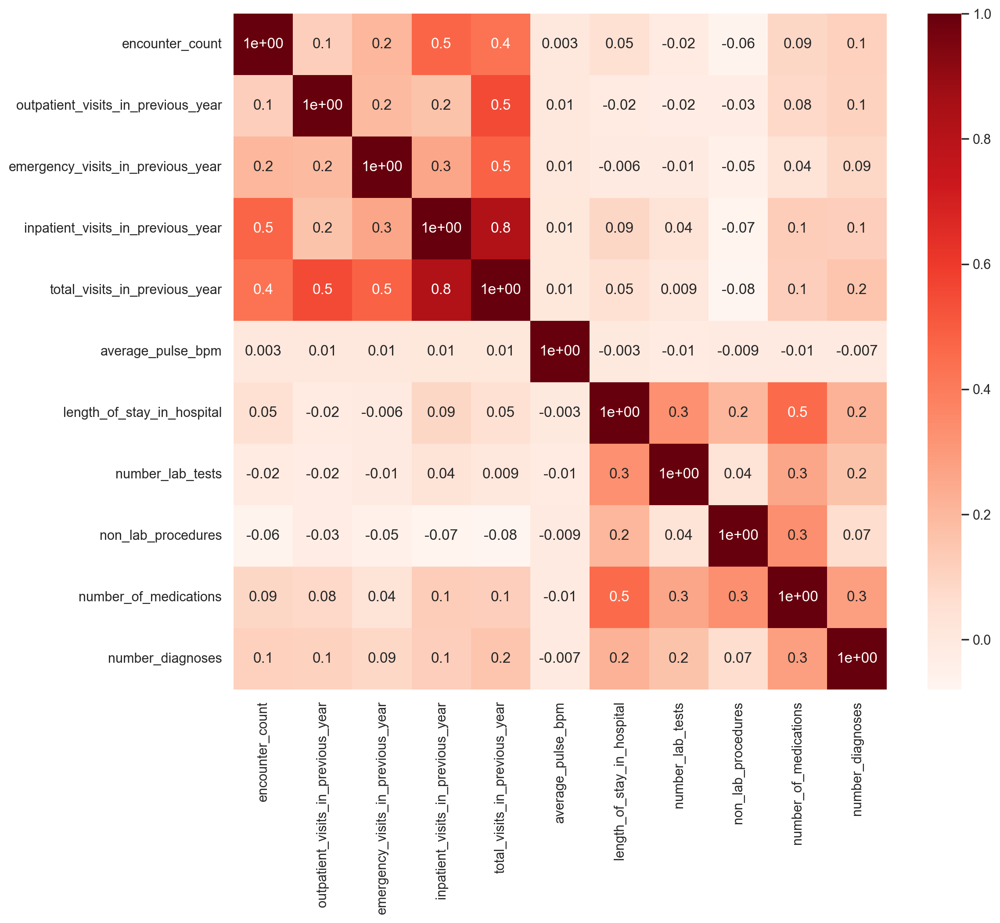

In [137]:
cor_heatmap(cor_spearman)

#### Chi Square for Categorical Data

In [138]:
def TestIndependence(X,y,var,alpha=0.05):        
    dfObserved = pd.crosstab(y,X) 
    chi2, p, dof, expected = stats.chi2_contingency(dfObserved.values)
    dfExpected = pd.DataFrame(expected, columns=dfObserved.columns, index = dfObserved.index)
    if p<alpha:
        result="{0} is IMPORTANT for Prediction".format(var)
    else:
        result="{0} is NOT an important predictor. (Discard {0} from model)".format(var)
    print(result)

In [139]:
for var in X_train_cat:
    TestIndependence(X_train_cat[var],y_train_resampled, var)

age is IMPORTANT for Prediction
caucasian is NOT an important predictor. (Discard caucasian from model)
gender is NOT an important predictor. (Discard gender from model)
age_groups is IMPORTANT for Prediction
payer_code is IMPORTANT for Prediction
has_insurance is NOT an important predictor. (Discard has_insurance from model)
admission_type is NOT an important predictor. (Discard admission_type from model)
discharge_disposition is IMPORTANT for Prediction
admission_source is IMPORTANT for Prediction
primary_diagnosis is IMPORTANT for Prediction
secondary_diagnosis is IMPORTANT for Prediction
additional_diagnosis is IMPORTANT for Prediction
glucose_test_result is NOT an important predictor. (Discard glucose_test_result from model)
a1c_test_result is IMPORTANT for Prediction
change_in_meds_during_hospitalization is IMPORTANT for Prediction
prescribed_diabetes_meds is IMPORTANT for Prediction
medication is IMPORTANT for Prediction
type_II_diabetes is IMPORTANT for Prediction
medical_speci

#### KBest - Mutual Info

In [140]:
selector = SelectKBest(score_func=mutual_info_classif)
selector.fit_transform(X_train_resampled, y_train_resampled)
X_train_resampled.columns[selector.get_support()]

Index(['inpatient_visits_in_previous_year', 'medical_specialty',
       'discharge_disposition', 'admission_source', 'number_of_medications',
       'secondary_diagnosis', 'prescribed_diabetes_meds', 'medication',
       'encounter_count', 'total_visits_in_previous_year'],
      dtype='object')

### 7.2. Wrapper Methods

#### RFE

In [141]:
nof_list = np.arange(1, 31)
high_score = 0
# Variable to store the optimum features
nof = 0
train_f1_list = []
val_f1_list = []

for n in range(len(nof_list)):
    model = LogisticRegression()

    rfe = RFE(estimator=model, n_features_to_select=nof_list[n])
    X_train_rfe = rfe.fit_transform(X_train_resampled, y_train_resampled)
    X_val_rfe = rfe.transform(X_val)
    model.fit(X_train_rfe, y_train_resampled)

    # storing results on training data
    train_pred = model.predict(X_train_rfe)
    train_f1 = f1_score(y_train_resampled, train_pred)
    train_f1_list.append(train_f1)

    # storing results on validation data
    val_pred = model.predict(X_val_rfe)
    val_f1 = f1_score(y_val, val_pred)
    val_f1_list.append(val_f1)

    # check best score
    if val_f1 >= high_score:
        high_score = val_f1
        nof = nof_list[n]

print("Optimum number of features: %d" % nof)
print("F1 score with %d features: %f" % (nof, high_score))

Optimum number of features: 3
F1 score with 3 features: 0.295276


In [142]:
model = LogisticRegression()
rfe = RFE(estimator = model, n_features_to_select = 3)
X_rfe = rfe.fit_transform(X = X_train_resampled, y = y_train_resampled)

In [143]:
selected_features = pd.Series(rfe.support_, index = X_train_resampled.columns)
selected_features

gender                                   False
age                                      False
payer_code                               False
outpatient_visits_in_previous_year       False
emergency_visits_in_previous_year        False
inpatient_visits_in_previous_year         True
admission_type                           False
medical_specialty                        False
average_pulse_bpm                        False
discharge_disposition                     True
admission_source                         False
length_of_stay_in_hospital               False
number_lab_tests                         False
non_lab_procedures                       False
number_of_medications                    False
primary_diagnosis                        False
secondary_diagnosis                      False
additional_diagnosis                     False
number_diagnoses                         False
glucose_test_result                      False
a1c_test_result                          False
change_in_med

### 7.3. Embedded Methods 

#### Lasso Regression 

In [144]:
def plot_importance(coef,name):
    imp_coef = coef.sort_values()
    plt.figure(figsize=(8,10))
    imp_coef.plot(kind = "barh")
    plt.title("Feature importance using " + name + " Model")
    plt.show()

In [145]:
reg = LassoCV()

In [146]:
reg.fit(X_train_resampled, y_train_resampled)

LassoCV()

In [147]:
coef = pd.Series(reg.coef_, index = X_train_resampled.columns)
coef

gender                                   0.004195
age                                      0.000235
payer_code                               0.087244
outpatient_visits_in_previous_year      -0.000000
emergency_visits_in_previous_year        0.096073
inpatient_visits_in_previous_year        0.200046
admission_type                          -0.012982
medical_specialty                        0.320237
average_pulse_bpm                        0.014772
discharge_disposition                    0.733734
admission_source                         0.101321
length_of_stay_in_hospital              -0.020137
number_lab_tests                         0.069366
non_lab_procedures                       0.024636
number_of_medications                    0.060674
primary_diagnosis                        0.128878
secondary_diagnosis                      0.130398
additional_diagnosis                     0.139713
number_diagnoses                         0.058266
glucose_test_result                      0.004887


In [148]:
#Check how many variables did Lasso picked (if the coef is different from 0) and how many variables did Lasso eliminated (if the coef is equal to 0)
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

Lasso picked 29 variables and eliminated the other 1 variables


In [149]:
coef.sort_values()

has_insurance                           -0.045530
a1c_test_result                         -0.029448
length_of_stay_in_hospital              -0.020137
admission_type                          -0.012982
prescribed_diabetes_meds                -0.009927
outpatient_visits_in_previous_year      -0.000000
age                                      0.000235
change_in_meds_during_hospitalization    0.001191
gender                                   0.004195
glucose_test_result                      0.004887
caucasian                                0.010673
average_pulse_bpm                        0.014772
type_II_diabetes                         0.016932
non_lab_procedures                       0.024636
number_diagnoses                         0.058266
number_of_medications                    0.060674
number_lab_tests                         0.069366
payer_code                               0.087244
emergency_visits_in_previous_year        0.096073
admission_source                         0.101321


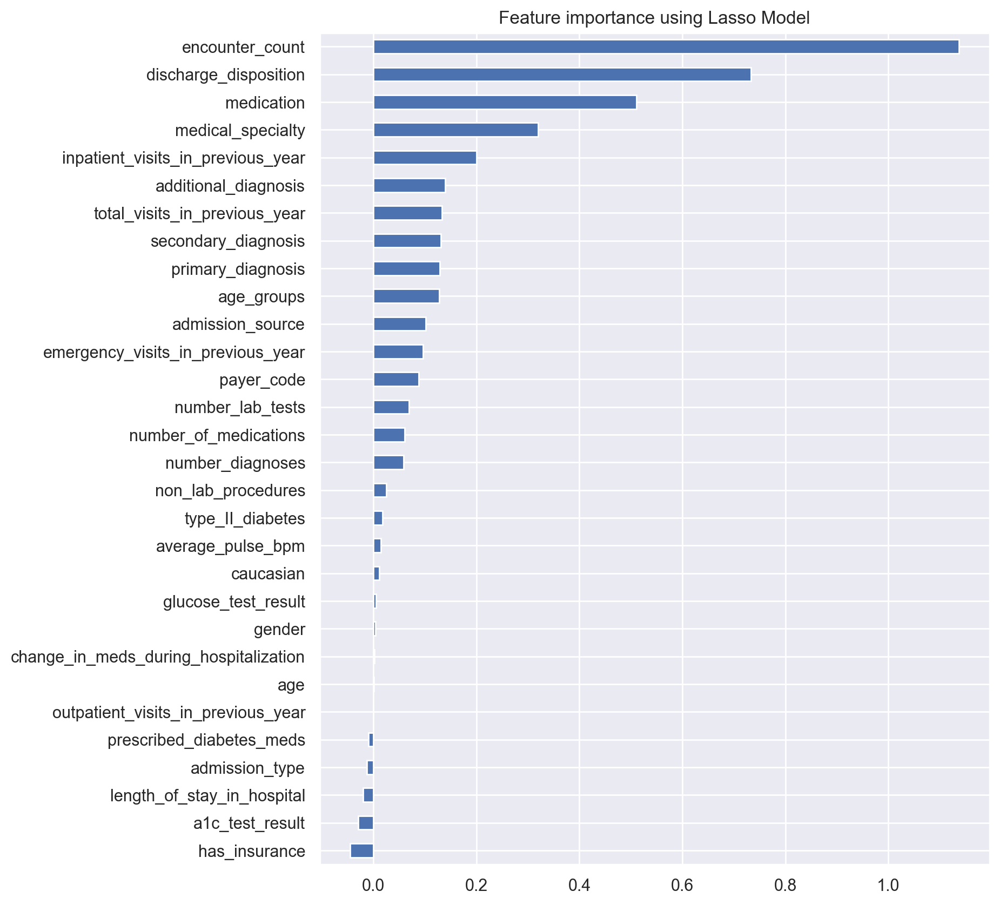

In [150]:
plot_importance(coef,'Lasso')

#### Random Forest 

In [151]:
sel = SelectFromModel(RandomForestClassifier(n_estimators=100))
sel.fit(X_train_resampled, y_train_resampled)

SelectFromModel(estimator=RandomForestClassifier())

In [152]:
sel.get_support()
X_train_resampled.columns[(sel.get_support())]

Index(['age', 'inpatient_visits_in_previous_year', 'average_pulse_bpm',
       'discharge_disposition', 'length_of_stay_in_hospital',
       'number_lab_tests', 'number_of_medications', 'primary_diagnosis',
       'secondary_diagnosis', 'additional_diagnosis', 'medication',
       'encounter_count', 'total_visits_in_previous_year'],
      dtype='object')

### 7.4. Drop Features

In [153]:
X_train_resampled.drop(columns = ['gender','payer_code','outpatient_visits_in_previous_year','admission_type', 'average_pulse_bpm','non_lab_procedures', 'number_diagnoses','glucose_test_result', 'a1c_test_result', 'change_in_meds_during_hospitalization','has_insurance', 'age_groups','type_II_diabetes', 'caucasian'], inplace = True)
X_val.drop(columns = ['gender','payer_code','outpatient_visits_in_previous_year','admission_type', 'average_pulse_bpm','non_lab_procedures', 'number_diagnoses','glucose_test_result', 'a1c_test_result', 'change_in_meds_during_hospitalization','has_insurance', 'age_groups','type_II_diabetes', 'caucasian'], inplace = True)
X_test.drop(columns = ['gender','payer_code','outpatient_visits_in_previous_year','admission_type', 'average_pulse_bpm','non_lab_procedures', 'number_diagnoses','glucose_test_result', 'a1c_test_result', 'change_in_meds_during_hospitalization','has_insurance', 'age_groups','type_II_diabetes', 'caucasian'], inplace = True)

X_train.drop(columns = ['gender','payer_code','outpatient_visits_in_previous_year','admission_type', 'average_pulse_bpm','non_lab_procedures', 'number_diagnoses','glucose_test_result', 'a1c_test_result', 'change_in_meds_during_hospitalization','has_insurance', 'age_groups','type_II_diabetes', 'caucasian'], inplace = True)

## 8. Modelling

## 8.1. Gaussian Naïve Bayes

In [154]:
model_bayes_resampled = GaussianNB().fit(X_train_resampled, y_train_resampled)
labels_train_bayes = model_bayes_resampled.predict(X_train_resampled)
labels_val_bayes = model_bayes_resampled.predict(X_val)

In [155]:
model_bayes_resampled.predict_proba(X_val)

array([[0.09075736, 0.90924264],
       [0.91765806, 0.08234194],
       [0.86601485, 0.13398515],
       ...,
       [0.95750395, 0.04249605],
       [0.99478524, 0.00521476],
       [0.94723354, 0.05276646]])

In [156]:
pos_label = 1 
print('Train:', f1_score(y_train_resampled, labels_train_bayes, pos_label = pos_label))
print('Validation:', f1_score(y_val, labels_val_bayes, pos_label = pos_label))
print('Difference:', f1_score(y_train_resampled, labels_train_bayes) - f1_score(y_val, labels_val_bayes))

Train: 0.4807185628742515
Validation: 0.2670986321094313
Difference: 0.21361993076482022


In [157]:
print('----------------------- TRAIN -----------------------')
print(classification_report(y_train_resampled, labels_train_bayes))
print('--------------------- VALIDATION ---------------------')
print(classification_report(y_val, labels_val_bayes))

----------------------- TRAIN -----------------------
              precision    recall  f1-score   support

           0       0.57      0.85      0.69      5536
           1       0.71      0.36      0.48      5536

    accuracy                           0.61     11072
   macro avg       0.64      0.61      0.58     11072
weighted avg       0.64      0.61      0.58     11072

--------------------- VALIDATION ---------------------
              precision    recall  f1-score   support

           0       0.91      0.87      0.89     18649
           1       0.23      0.31      0.27      2385

    accuracy                           0.81     21034
   macro avg       0.57      0.59      0.58     21034
weighted avg       0.83      0.81      0.82     21034



## 8.2. Complement Naïve Bayes

In [158]:
clf = ComplementNB().fit(X_train, y_train)

In [159]:
labels_train_clf = clf.predict(X_train)
labels_val_clf = clf.predict(X_val)

In [160]:
clf.predict_proba(X_val)

array([[0.44891004, 0.55108996],
       [0.53947946, 0.46052054],
       [0.52171372, 0.47828628],
       ...,
       [0.51505817, 0.48494183],
       [0.52412283, 0.47587717],
       [0.53486589, 0.46513411]])

In [161]:
pos_label = 1 
print('Train:', f1_score(y_train, labels_train_clf, pos_label = pos_label))
print('Validation:', f1_score(y_val, labels_val_clf, pos_label = pos_label))
print('Difference:', f1_score(y_train, labels_train_clf) - f1_score(y_val, labels_val_clf))

Train: 0.2767502553046636
Validation: 0.267803710353082
Difference: 0.008946544951581592


In [162]:
print('----------------------- TRAIN -----------------------')
print(classification_report(y_train, labels_train_clf))
print('--------------------- VALIDATION ---------------------')
print(classification_report(y_val, labels_val_clf))

----------------------- TRAIN -----------------------
              precision    recall  f1-score   support

           0       0.92      0.78      0.84     43231
           1       0.20      0.44      0.28      5536

    accuracy                           0.74     48767
   macro avg       0.56      0.61      0.56     48767
weighted avg       0.83      0.74      0.78     48767

--------------------- VALIDATION ---------------------
              precision    recall  f1-score   support

           0       0.91      0.82      0.86     18649
           1       0.21      0.38      0.27      2385

    accuracy                           0.77     21034
   macro avg       0.56      0.60      0.56     21034
weighted avg       0.83      0.77      0.79     21034



## 8.3. Logistic Regression

In [163]:
# lr = LogisticRegression(random_state = 42).fit(X_train_resampled, y_train_resampled)
# labels_train_lr = lr.predict(X_train_resampled)
# labels_val_lr = lr.predict(X_val)

In [164]:
# pred_prob_lr = lr.predict_proba(X_val)

In [165]:
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, labels_train_lr, pos_label = pos_label))
# print('Validation:', f1_score(y_val, labels_val_lr, pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, labels_train_lr) - f1_score(y_val, labels_val_lr))

Train: 0.6315993412767608
Validation: 0.2812943148124275
Difference: 0.35030502646433326


Random Search - Resampled Train

In [166]:
# scoring_metric = make_scorer(f1_score)

# # Define the hyperparameter grid
# param_dist = {
#     'penalty': ['l2'],  # Regularization penalty type
#     'solver': ['liblinear', 'lbfgs'], 
#     'class_weight': [None, 'balanced']
# }

# # Create a Logistic Regression model
# logreg = LogisticRegression()

# # Create a RandomizedSearchCV instance
# random_search = RandomizedSearchCV(logreg, param_distributions=param_dist, n_iter=200, cv=10, scoring=scoring_metric, random_state=42)

# # Fit the model
# random_search.fit(X_train_resampled, y_train_resampled)

# # Print the best hyperparameters
# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)

# Best hyperparameters: {'solver': 'lbfgs', 'penalty': 'l2', 'class_weight': 'balanced'}
# Best F1 Score: 0.6272391310643937

In [167]:
log_model_RS = LogisticRegression(solver = 'lbfgs', penalty = 'l2', class_weight = 'balanced', random_state = 42).fit(X_train_resampled, y_train_resampled)

labels_train_log = log_model_RS.predict(X_train_resampled)
labels_val_log = log_model_RS.predict(X_val)

pos_label = 1 
print('Train:', f1_score(y_train_resampled, labels_train_log, pos_label = pos_label))
print('Validation:', f1_score(y_val, labels_val_log, pos_label = pos_label))
print('Difference:', f1_score(y_train_resampled, labels_train_log) - f1_score(y_val, labels_val_log))

Train: 0.6315993412767608
Validation: 0.2812943148124275
Difference: 0.35030502646433326


GridSearch - Resampled Train

In [168]:
# scoring_metric = make_scorer(f1_score)

# gridsearch = GridSearchCV(logreg, param_dist,  scoring=scoring_metric)
# gridsearch.fit(X_train_resampled, y_train_resampled)

# print(gridsearch.best_params_)
# print(gridsearch.best_score_)

# {'class_weight': None, 'penalty': 'l2', 'solver': 'liblinear'}
# 0.6279863094487724

In [169]:
log_model_GS = LogisticRegression(solver = 'liblinear', penalty = 'l2', random_state = 42).fit(X_train_resampled, y_train_resampled)

pos_label = 1 
print('Train:', f1_score(y_train_resampled, log_model_GS.predict(X_train_resampled), pos_label = pos_label))
print('Validation:', f1_score(y_val, log_model_GS.predict(X_val), pos_label = pos_label))
print('Difference:', f1_score(y_train_resampled, log_model_GS.predict(X_train_resampled)) - f1_score(y_val, log_model_GS.predict(X_val)))

Train: 0.6314665631369504
Validation: 0.2832483326794822
Difference: 0.3482182304574682


Random Search (X_train, y_train)

In [170]:
# scoring_metric = make_scorer(f1_score)

# # Define the hyperparameter grid
# param_dist = {
#     'penalty': ['l2'],  # Regularization penalty type
#     'solver': ['liblinear', 'lbfgs'], 
#     'class_weight': ['balanced']
# }

# # Create a Logistic Regression model
# logreg = LogisticRegression()

# # Create a RandomizedSearchCV instance
# random_search = RandomizedSearchCV(logreg, param_distributions=param_dist, n_iter=200, cv=10, scoring=scoring_metric, random_state=42)

# # Fit the model
# random_search.fit(X_train, y_train)

# # # Print the best hyperparameters
# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)

# Best hyperparameters: {'solver': 'lbfgs', 'penalty': 'l2', 'class_weight': 'balanced'}
# Best F1 Score: 0.3130540856068822

In [171]:
# LR_random = random_search.best_estimator_
# LR_random.fit(X_train, y_train)

# pos_label = 1 
# print('Train:', f1_score(y_train, LR_random.predict(X_train), pos_label = pos_label))
# print('Validation:', f1_score(y_val, LR_random.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train, LR_random.predict(X_train)) - f1_score(y_val, LR_random.predict(X_val)))

# Train: 0.31320107763899097
# Validation: 0.2856751949651115
# Difference: 0.027525882673879454

In [172]:
log_balanced_RS = LogisticRegression(solver = 'lbfgs', penalty = 'l2', class_weight = 'balanced', random_state = 42).fit(X_train, y_train)

pos_label = 1 
print('Train:', f1_score(y_train, log_balanced_RS.predict(X_train), pos_label = pos_label))
print('Validation:', f1_score(y_val, log_balanced_RS.predict(X_val), pos_label = pos_label))
print('Difference:', f1_score(y_train, log_balanced_RS.predict(X_train)) - f1_score(y_val, log_balanced_RS.predict(X_val)))

Train: 0.31320107763899097
Validation: 0.2856751949651115
Difference: 0.027525882673879454


Grid Search (X_train, y_train)

In [173]:
# scoring_metric = make_scorer(f1_score)

# gridsearch = GridSearchCV(logreg, param_dist,  scoring=scoring_metric)
# gridsearch.fit(X_train, y_train)

# print(gridsearch.best_params_)
# print(gridsearch.best_score_)

# {'class_weight': balanced, 'penalty': 'l2', 'solver': 'liblinear'}
# 0.6279863094487724

In [174]:
# LR_GS = gridsearch.best_estimator_
# LR_GS.fit(X_train, y_train)

# pos_label = 1 
# print('Train:', f1_score(y_train, LR_GS.predict(X_train), pos_label = pos_label))
# print('Validation:', f1_score(y_val, LR_GS.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train, LR_GS.predict(X_train)) - f1_score(y_val, LR_GS.predict(X_val)))

# Train: 0.3133581796783052
# Validation: 0.2860672614962251
# Difference: 0.027290918182080126

In [175]:
log_balanced_GS = LogisticRegression(solver = 'liblinear', penalty = 'l2', class_weight = 'balanced', random_state = 42).fit(X_train, y_train)

pos_label = 1 
print('Train:', f1_score(y_train, log_balanced_GS.predict(X_train), pos_label = pos_label))
print('Validation:', f1_score(y_val, log_balanced_GS.predict(X_val), pos_label = pos_label))
print('Difference:', f1_score(y_train, log_balanced_GS.predict(X_train)) - f1_score(y_val, log_balanced_GS.predict(X_val)))

Train: 0.3133581796783052
Validation: 0.2860672614962251
Difference: 0.027290918182080126


In [176]:
pred_prob_lrfinal = log_balanced_GS.predict_proba(X_val)

**Logistic Regression Final Model**

In [177]:
print('----------------------- TRAIN -----------------------')
print(classification_report(y_train, log_balanced_GS.predict(X_train)))
print('--------------------- VALIDATION ---------------------')
print(classification_report(y_val, log_balanced_GS.predict(X_val)))

----------------------- TRAIN -----------------------
              precision    recall  f1-score   support

           0       0.93      0.73      0.82     43231
           1       0.22      0.58      0.31      5536

    accuracy                           0.71     48767
   macro avg       0.57      0.65      0.57     48767
weighted avg       0.85      0.71      0.76     48767

--------------------- VALIDATION ---------------------
              precision    recall  f1-score   support

           0       0.92      0.79      0.85     18649
           1       0.21      0.44      0.29      2385

    accuracy                           0.75     21034
   macro avg       0.56      0.62      0.57     21034
weighted avg       0.84      0.75      0.79     21034



## 8.4. Decision Trees

In [178]:
def plot_tree(model):
    dot_data = export_graphviz(model,
                               feature_names=X_train_resampled.columns,  
                               class_names=["No", "Yes"],
                               filled=True)
    pydot_graph = pydotplus.graph_from_dot_data(dot_data)
    pydot_graph.set_size('"20,20"')
    return graphviz.Source(pydot_graph.to_string())

In [179]:
# DT = DecisionTreeClassifier().fit(X_train_resampled, y_train_resampled)

# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, DT.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, DT.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, DT.predict(X_train_resampled)) - f1_score(y_val, DT.predict(X_val)))

Train: 1.0
Validation: 0.22264596386089167
Difference: 0.7773540361391084


In [180]:
# print('The defined three has a depth of ' + str(DT.get_depth()) + ', ' + str(DT.tree_.node_count) + 
#       ' nodes and a total of ' + str(DT.get_n_leaves()) + ' leaves.')

The defined three has a depth of 33, 5527 nodes and a total of 2764 leaves.


Random Search (X_train, y_train)

In [181]:
# scoring_metric = make_scorer(f1_score)

# # Define the hyperparameter grid
# param_dist = {
#     'splitter': ['random'], 
#     'max_depth': [5, 10, 100], 
#     'min_samples_split': [200, 700],
#     'min_samples_leaf': [200,700], 
#     'max_features' : [None, 0.5, 'sqrt', 'log2'],
#     'max_leaf_nodes' : [10,50], 
#     'class_weight' : ['balanced']
# }

# DT = DecisionTreeClassifier()

# # Create a RandomizedSearchCV instance
# random_search = RandomizedSearchCV(DT, param_distributions=param_dist, n_iter=200, cv=10, scoring=scoring_metric, random_state=42)

# # Fit the model
# random_search.fit(X_train, y_train)

# # Print the best hyperparameters
# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)

# Best hyperparameters: {'splitter': 'random', 'min_samples_split': 200, 'min_samples_leaf': 200, 'max_leaf_nodes': 50, 'max_features': None, 'max_depth': 10, 'class_weight': 'balanced'}
# Best F1 Score: 0.31118268372878216

In [182]:
# DT_random1 = random_search.best_estimator_
# DT_random1.fit(X_train, y_train)

# pos_label = 1 
# print('Train:', f1_score(y_train, DT_random1.predict(X_train), pos_label = pos_label))
# print('Validation:', f1_score(y_val, DT_random1.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train, DT_random1.predict(X_train)) - f1_score(y_val, DT_random1.predict(X_val)))

# Train: 0.314038305677601
# Validation: 0.2897394339857873
# Difference: 0.024298871691813717

In [183]:
DT_balanced_RS = DecisionTreeClassifier(splitter = 'random', min_samples_split = 200, min_samples_leaf = 200, max_leaf_nodes = 50, max_features = None, max_depth = 10, class_weight = 'balanced', random_state = 42).fit(X_train, y_train)
pos_label = 1 
print('Train:', f1_score(y_train, DT_balanced_RS.predict(X_train), pos_label = pos_label))
print('Validation:', f1_score(y_val, DT_balanced_RS.predict(X_val), pos_label = pos_label))
print('Difference:', f1_score(y_train, DT_balanced_RS.predict(X_train)) - f1_score(y_val, DT_balanced_RS.predict(X_val)))

Train: 0.314038305677601
Validation: 0.2897394339857873
Difference: 0.024298871691813717


Random Search - Resampled

In [184]:
# scoring_metric = make_scorer(f1_score)

# # Define the hyperparameter grid
# param_dist = {
#     'splitter': ['random'], 
#     'max_depth': [5, 10, 100], 
#     'min_samples_split': [200, 700],
#     'min_samples_leaf': [200,700], 
#     'max_features' : [None, 0.5, 'sqrt', 'log2'],
#     'max_leaf_nodes' : [10,50], 
#     'class_weight' : [None, 'balanced']
# }

# DT = DecisionTreeClassifier()

# # Create a RandomizedSearchCV instance
# random_search = RandomizedSearchCV(DT, param_distributions=param_dist, n_iter=200, cv=10, scoring=scoring_metric, random_state=42)

# # Fit the model
# random_search.fit(X_train_resampled, y_train_resampled)

# # Print the best hyperparameters
# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)

# Best hyperparameters: {'splitter': 'random', 'min_samples_split': 200, 'min_samples_leaf': 200, 'max_leaf_nodes': 50, 'max_features': None, 'max_depth': 10, 'class_weight': None}
# Best F1 Score: 0.6723057039229345

In [185]:
# DT_random = random_search.best_estimator_
# DT_random.fit(X_train_resampled, y_train_resampled)

# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, DT_random.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, DT_random.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, DT_random.predict(X_train_resampled)) - f1_score(y_val, DT_random.predict(X_val)))

# Train: 0.6618771299622364
# Validation: 0.2856417417798654
# Difference: 0.37623538818237096

In [186]:
DT_RS = DecisionTreeClassifier(splitter = 'random', min_samples_split = 200, min_samples_leaf = 200, max_leaf_nodes = 50, max_features = None, max_depth = 10, random_state = 42).fit(X_train_resampled, y_train_resampled)
pos_label = 1 
print('Train:', f1_score(y_train_resampled, DT_RS.predict(X_train_resampled), pos_label = pos_label))
print('Validation:', f1_score(y_val, DT_RS.predict(X_val), pos_label = pos_label))
print('Difference:', f1_score(y_train_resampled, DT_RS.predict(X_train_resampled)) - f1_score(y_val, DT_RS.predict(X_val)))

Train: 0.6618771299622364
Validation: 0.2856417417798654
Difference: 0.37623538818237096


Splitter: If random, it selects a random feature and a random split in each feature. 

In [187]:
# dt_best = DecisionTreeClassifier(splitter = 'best').fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, dt_best.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, dt_best.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, dt_best.predict(X_train_resampled)) - f1_score(y_val, dt_best.predict(X_val)))

Train: 1.0
Validation: 0.22196219621962196
Difference: 0.778037803780378


In [188]:
# dt_random = DecisionTreeClassifier(splitter = 'random').fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, dt_random.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, dt_random.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, dt_random.predict(X_train_resampled)) - f1_score(y_val, dt_random.predict(X_val)))

Train: 1.0
Validation: 0.22418879056047197
Difference: 0.775811209439528


max_depth

In [189]:
# t_min700 = DecisionTreeClassifier(min_samples_split = 900).fit(X_train_resampled, y_train_resampled)

In [190]:
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, t_min700.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, t_min700.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, t_min700.predict(X_train_resampled)) - f1_score(y_val, t_min700.predict(X_val)))

Train: 0.6748971193415638
Validation: 0.3063691885828244
Difference: 0.3685279307587394


min_samples_leaf: Changing the minimum number of samples required to be at a leaf node

In [191]:
# dt_min_sam200 = DecisionTreeClassifier(min_samples_leaf = 200).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, dt_min_sam200.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, dt_min_sam200.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, dt_min_sam200.predict(X_train_resampled)) - f1_score(y_val, dt_min_sam200.predict(X_val)))

Train: 0.6775072674418605
Validation: 0.30496537152247916
Difference: 0.37254189591938136


In [192]:
# dt_min_sam700 = DecisionTreeClassifier(min_samples_leaf = 700).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, dt_min_sam700.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, dt_min_sam700.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, dt_min_sam700.predict(X_train_resampled)) - f1_score(y_val, dt_min_sam700.predict(X_val)))

Train: 0.6694748162753182
Validation: 0.2872093023255814
Difference: 0.38226551394973685


max_features: by choosing a reduced number of features, we can increase the stability of the tree and reduce variance and overfitting

In [193]:
# dt_none = DecisionTreeClassifier(max_features = None, random_state = 42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, dt_none.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, dt_none.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, dt_none.predict(X_train_resampled)) - f1_score(y_val, dt_none.predict(X_val)))

Train: 1.0
Validation: 0.22155797101449276
Difference: 0.7784420289855072


In [194]:
# dt_int = DecisionTreeClassifier(max_features = 10, random_state = 42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, dt_int.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, dt_int.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, dt_int.predict(X_train_resampled)) - f1_score(y_val, dt_int.predict(X_val)))

Train: 1.0
Validation: 0.22680601393472682
Difference: 0.7731939860652732


In [195]:
# dt_float = DecisionTreeClassifier(max_features = 0.5, random_state = 42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, dt_float.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, dt_float.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, dt_float.predict(X_train_resampled)) - f1_score(y_val, dt_float.predict(X_val)))

Train: 1.0
Validation: 0.23289272547432785
Difference: 0.7671072745256722


In [196]:
# dt_auto = DecisionTreeClassifier(max_features = 'sqrt', random_state = 42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, dt_auto.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, dt_auto.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, dt_auto.predict(X_train_resampled)) - f1_score(y_val, dt_auto.predict(X_val)))

Train: 1.0
Validation: 0.22218234027279254
Difference: 0.7778176597272075


In [197]:
# dt_log2 = DecisionTreeClassifier(max_features = 'log2', random_state = 42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, dt_log2.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, dt_log2.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, dt_log2.predict(X_train_resampled)) - f1_score(y_val, dt_log2.predict(X_val)))

Train: 1.0
Validation: 0.22218234027279254
Difference: 0.7778176597272075


max_leaf_nodes

In [198]:
# dt_maxleaf10 = DecisionTreeClassifier(max_leaf_nodes = 10, random_state = 42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, dt_maxleaf10.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, dt_maxleaf10.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, dt_maxleaf10.predict(X_train_resampled)) - f1_score(y_val, dt_maxleaf10.predict(X_val)))

Train: 0.6618113912231559
Validation: 0.29828722002635044
Difference: 0.36352417119680547


Grid Search - Resampled

In [199]:
# parameter_spaceDT = {
#     'criterion': ['gini'],
#     'splitter': ['random'], 
#     'max_depth':[2,5,10],
#     'min_samples_split': [700, 900], 
#     'min_samples_leaf': [200,700],
#     'max_features': [None, 15, 0.5],
#     'max_leaf_nodes': [10,50],
#     'min_impurity_decrease': [0.,0.02,0.05]
# }

In [200]:
# scoring_metric = make_scorer(f1_score)
# DTGS = GridSearchCV(DT, parameter_spaceDT, scoring=scoring_metric)
# DTGS.fit(X_train_resampled, y_train_resampled)
# print(DTGS.best_params_)
# print(DTGS.best_score_)

# {'criterion': 'gini', 'max_depth': 5, 'max_features': 15, 'max_leaf_nodes': 50, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 300, 'min_samples_split': 900, 'splitter': 'random'}
# 0.6615784633391858

In [201]:
# DT_GS = DTGS.best_estimator_
# DT_GS.fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, DT_GS.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, DT_GS.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, DT_GS.predict(X_train_resampled)) - f1_score(y_val, DT_GS.predict(X_val)))

# Train: 0.6212824819681849
# Validation: 0.27344141734915595
# Difference: 0.347841064619029

In [202]:
DT_GS = DecisionTreeClassifier(criterion = 'gini', splitter = 'random', min_samples_split = 900, min_samples_leaf = 300, max_leaf_nodes = 50, max_features = 15, max_depth = 5, random_state = 42).fit(X_train_resampled, y_train_resampled)

pos_label = 1 
print('Train:', f1_score(y_train_resampled, DT_GS.predict(X_train_resampled), pos_label = pos_label))
print('Validation:', f1_score(y_val, DT_GS.predict(X_val), pos_label = pos_label))
print('Difference:', f1_score(y_train_resampled, DT_GS.predict(X_train_resampled)) - f1_score(y_val, DT_GS.predict(X_val)))

Train: 0.6212824819681849
Validation: 0.27344141734915595
Difference: 0.347841064619029


Grid Search (X_train, y_train)

In [203]:
# parameter_spaceDT = {
#     'criterion': ['gini'],
#     'splitter': ['random'], 
#     'max_depth':[2,5,10],
#     'min_samples_split': [700, 900], 
#     'min_samples_leaf': [200,700],
#     'max_features': [None, 15, 0.5],
#     'max_leaf_nodes': [10,50],
#     'class_weight' : ['balanced']
# }

In [204]:
# scoring_metric = make_scorer(f1_score)
# DTGS = GridSearchCV(DT, parameter_spaceDT, scoring=scoring_metric)
# DTGS.fit(X_train, y_train)
# print(DTGS.best_params_)
# print(DTGS.best_score_)

# {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 10, 'max_features': None, 'max_leaf_nodes': 50, 'min_samples_leaf': 200, 'min_samples_split': 700, 'splitter': 'random'}
# 0.3127762298156364

In [205]:
# DT_GS = DTGS.best_estimator_
# DT_GS.fit(X_train, y_train)
# pos_label = 1 
# print('Train:', f1_score(y_train, DT_GS.predict(X_train), pos_label = pos_label))
# print('Validation:', f1_score(y_val, DT_GS.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train, DT_GS.predict(X_train)) - f1_score(y_val, DT_GS.predict(X_val)))

# Train: 0.3124741329360152
# Validation: 0.3061200516856572
# Difference: 0.0063540812503580235

In [206]:
DT_balanced_GS = DecisionTreeClassifier(criterion = 'gini', splitter = 'random', min_samples_split = 700, min_samples_leaf = 300, max_leaf_nodes = 50, max_features = None, max_depth = 10, class_weight = 'balanced', random_state = 42).fit(X_train, y_train)

pos_label = 1 
print('Train:', f1_score(y_train, DT_balanced_GS.predict(X_train), pos_label = pos_label))
print('Validation:', f1_score(y_val, DT_balanced_GS.predict(X_val), pos_label = pos_label))
print('Difference:', f1_score(y_train, DT_balanced_GS.predict(X_train)) - f1_score(y_val, DT_balanced_GS.predict(X_val)))

Train: 0.31746445806704054
Validation: 0.28571428571428575
Difference: 0.03175017235275479


**Decision Trees Final Model**

In [207]:
DT_balanced_final = DecisionTreeClassifier(criterion = 'gini', splitter = 'random', min_samples_split = 200, min_samples_leaf = 200, max_leaf_nodes = 50, max_features = None, max_depth = 10, class_weight = 'balanced', random_state = 42).fit(X_train, y_train)

pos_label = 1 
print('Train:', f1_score(y_train, DT_balanced_final.predict(X_train), pos_label = pos_label))
print('Validation:', f1_score(y_val, DT_balanced_final.predict(X_val), pos_label = pos_label))
print('Difference:', f1_score(y_train, DT_balanced_final.predict(X_train)) - f1_score(y_val, DT_balanced_final.predict(X_val)))

Train: 0.314038305677601
Validation: 0.2897394339857873
Difference: 0.024298871691813717


In [208]:
DT_pred_prob = DT_balanced_final.predict_proba(X_val)

In [209]:
print('----------------------- TRAIN -----------------------')
print(classification_report(y_train, DT_balanced_final.predict(X_train)))
print('--------------------- VALIDATION ---------------------')
print(classification_report(y_val, DT_balanced_final.predict(X_val)))

----------------------- TRAIN -----------------------
              precision    recall  f1-score   support

           0       0.94      0.67      0.78     43231
           1       0.21      0.66      0.31      5536

    accuracy                           0.67     48767
   macro avg       0.57      0.67      0.55     48767
weighted avg       0.86      0.67      0.73     48767

--------------------- VALIDATION ---------------------
              precision    recall  f1-score   support

           0       0.92      0.76      0.83     18649
           1       0.21      0.49      0.29      2385

    accuracy                           0.73     21034
   macro avg       0.56      0.62      0.56     21034
weighted avg       0.84      0.73      0.77     21034



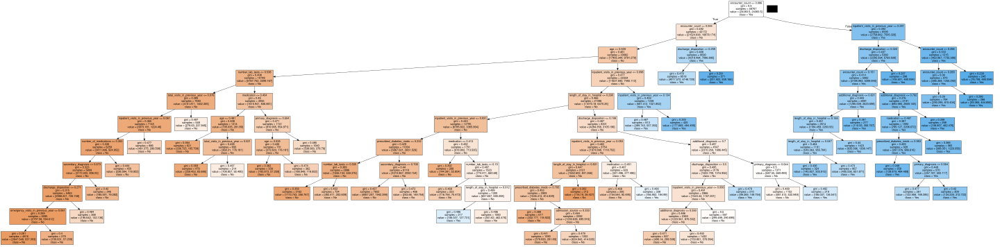

In [210]:
plot_tree(DT_balanced_final)

## 8.5. K-Nearest Neighbors

In [211]:
# modelKNN = KNeighborsClassifier()

In [212]:
# modelKNN.fit(X = X_train_resampled, y = y_train_resampled)
# labels_KNNtrain = modelKNN.predict(X_train_resampled)
# labels_KNNval = modelKNN.predict(X_val)

In [213]:
# modelKNN.predict_proba(X_val)

array([[0.4, 0.6],
       [1. , 0. ],
       [0.2, 0.8],
       ...,
       [0.8, 0.2],
       [1. , 0. ],
       [0.6, 0.4]])

In [214]:
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, labels_KNNtrain, pos_label = pos_label))
# print('Validation:', f1_score(y_val, labels_KNNval, pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, labels_KNNtrain) - f1_score(y_val, labels_KNNval))

Train: 0.7268685746040566
Validation: 0.23210161662817552
Difference: 0.4947669579758811


Number of Neighbours: A small number of neighbors could lead to overfitting; A big number of neighbors can lead to underfitting.

In [215]:
# numberK_list = np.arange(1, 20)
# high_score = 0
# nof = 0
# score_list_train = []
# score_list_val = []

# for n in numberK_list:
#     model = KNeighborsClassifier(n_neighbors=n).fit(X_train, y_train)
#     # Calculate F1 score for train set
#     y_train_pred = model.predict(X_train)
#     score_train = f1_score(y_train, y_train_pred, average='binary')  # Assuming binary classification
#     # Calculate F1 score for validation set
#     y_val_pred = model.predict(X_val)
#     score_val = f1_score(y_val, y_val_pred, average='binary')  # Assuming binary classification
    
#     score_list_train.append(score_train)
#     score_list_val.append(score_val)

#     if score_val > high_score:
#         high_score = score_val
#         nof = numberK_list[n - 1]

# print("Best number of neighbors: %d" % nof)
# print("Mean F1 score in train with %d neighbors: %f" % (nof, score_list_train[nof - 1]))
# print("Mean F1 score in validation with %d neighbors: %f" % (nof, high_score))

#Resampled train: 
# Best number of neighbors: 19
# Mean F1 score in train with 19 neighbors: 0.649311
# Mean F1 score in validation with 19 neighbors: 0.252361

#X_train, y_train:
# Best number of neighbors: 1
# Mean F1 score in train with 1 neighbors: 1.000000
# Mean F1 score in validation with 1 neighbors: 0.149770

Random Search - Resampled

In [216]:
# scoring_metric = make_scorer(f1_score)

# # Define the hyperparameter grid
# param_dist = {
#     'n_neighbors': [19,20], 
#     'algorithm': ['kd_tree', 'brute', 'ball_tree'], 
#     'metric': ['manhattan', 'euclidean'],
#     'weights': ['uniform','distance']
# }

# KNN = KNeighborsClassifier()

# # Create a RandomizedSearchCV instance
# random_search = RandomizedSearchCV(KNN, param_distributions=param_dist, n_iter=200, cv=10, scoring=scoring_metric, random_state=42)

# # Fit the model
# random_search.fit(X_train_resampled, y_train_resampled)

# # Print the best hyperparameters
# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)

# Best hyperparameters: {'weights': 'uniform', 'n_neighbors': 19, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
# Best F1 Score: 0.5906165326086423

In [217]:
# KNN_random = random_search.best_estimator_
# KNN_random.fit(X_train_resampled, y_train_resampled)

# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, KNN_random.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, KNN_random.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, KNN_random.predict(X_train_resampled)) - f1_score(y_val, KNN_random.predict(X_val)))

# Train: 0.6493108728943338
# Validation: 0.2523612437652552
# Difference: 0.39694962912907855

In [218]:
KNN_RS = KNeighborsClassifier(algorithm='kd_tree', n_neighbors=19, metric = 'euclidean', weights='uniform').fit(X_train_resampled, y_train_resampled)

pos_label = 1 
print('Train:', f1_score(y_train_resampled, KNN_RS.predict(X_train_resampled), pos_label = pos_label))
print('Validation:', f1_score(y_val, KNN_RS.predict(X_val), pos_label = pos_label))
print('Difference:', f1_score(y_train_resampled, KNN_RS.predict(X_train_resampled)) - f1_score(y_val, KNN_RS.predict(X_val)))

Train: 0.6493108728943338
Validation: 0.2523612437652552
Difference: 0.39694962912907855


Random Search (X_train, y_train)

In [219]:
# scoring_metric = make_scorer(f1_score)

# # Define the hyperparameter grid
# param_dist = {
#     'n_neighbors': [19,20], 
#     'algorithm': ['kd_tree', 'brute', 'ball_tree'], 
#     'metric': ['manhattan', 'euclidean'],
#     'weights': ['uniform','distance']
# }

# KNN = KNeighborsClassifier()

# # Create a RandomizedSearchCV instance
# random_search = RandomizedSearchCV(KNN, param_distributions=param_dist, n_iter=200, cv=10, scoring=scoring_metric, random_state=42)

# # Fit the model
# random_search.fit(X_train, y_train)

# # Print the best hyperparameters
# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)

# Best hyperparameters: {'weights': 'uniform', 'n_neighbors': 1, 'metric': 'manhattan', 'algorithm': 'kd_tree'}
# Best F1 Score: 0.16618157823927673

In [220]:
# KNN_random = random_search.best_estimator_
# KNN_random.fit(X_train, y_train)

# pos_label = 1 
# print('Train:', f1_score(y_train, KNN_random.predict(X_train), pos_label = pos_label))
# print('Validation:', f1_score(y_val, KNN_random.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train, KNN_random.predict(X_train)) - f1_score(y_val, KNN_random.predict(X_val)))

# Train: 1.0
# Validation: 0.14103456274646253
# Difference: 0.8589654372535375

In [221]:
KNN_balanced_RS = KNeighborsClassifier(algorithm='kd_tree', n_neighbors=1, metric = 'manhattan', weights='uniform').fit(X_train, y_train)

pos_label = 1 
print('Train:', f1_score(y_train, KNN_balanced_RS.predict(X_train), pos_label = pos_label))
print('Validation:', f1_score(y_val, KNN_balanced_RS.predict(X_val), pos_label = pos_label))
print('Difference:', f1_score(y_train, KNN_balanced_RS.predict(X_train)) - f1_score(y_val, KNN_balanced_RS.predict(X_val)))

Train: 1.0
Validation: 0.14103456274646253
Difference: 0.8589654372535375


Algorithm

In [222]:
# start = time.time()
# modelKNNT = KNeighborsClassifier(algorithm='kd_tree').fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, modelKNNT.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, modelKNNT.predict(X_val), pos_label = pos_label))
# print('Time:', time.time()-start)

Train: 0.7268685746040566
Validation: 0.23210161662817552
Time: 8.851467370986938


In [223]:
# start = time.time()
# modelKNNB = KNeighborsClassifier(algorithm='brute').fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, modelKNNB.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, modelKNNB.predict(X_val), pos_label = pos_label))
# print('Time:', time.time()-start)

Train: 0.7268685746040566
Validation: 0.23210161662817552
Time: 2.2491655349731445


In [224]:
# start = time.time()
# modelKNNBT = KNeighborsClassifier(algorithm='ball_tree').fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, modelKNNBT.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, modelKNNBT.predict(X_val), pos_label = pos_label))
# print('Time:', time.time()-start)

Train: 0.7268685746040566
Validation: 0.23210161662817552
Time: 11.39573049545288


Distance Metric

In [225]:
# modelKNNM = KNeighborsClassifier(metric = 'manhattan').fit(X = X_train_resampled, y = y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, modelKNNM.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, modelKNNM.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, modelKNNM.predict(X_train_resampled)) - f1_score(y_val, modelKNNM.predict(X_val)))

Train: 0.7291588785046729
Validation: 0.23518556489645273
Difference: 0.49397331360822017


In [226]:
# modelKNNE = KNeighborsClassifier(metric = 'euclidean').fit(X = X_train_resampled, y = y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, modelKNNE.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, modelKNNE.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, modelKNNE.predict(X_train_resampled)) - f1_score(y_val, modelKNNE.predict(X_val)))

Train: 0.7268685746040566
Validation: 0.23210161662817552
Difference: 0.4947669579758811


Distance weighted KNN

- Distance (nearest neighbors have more influence/weight on the prediction than the farthest ones)

In [227]:
# modelKNNW = KNeighborsClassifier(weights = 'distance').fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, modelKNNW.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, modelKNNW.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, modelKNNW.predict(X_train_resampled)) - f1_score(y_val, modelKNNW.predict(X_val)))

Train: 1.0
Validation: 0.2321737459158178
Difference: 0.7678262540841823


- Uniform

In [228]:
# modelKNNU = KNeighborsClassifier(weights = 'uniform').fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, modelKNNU.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, modelKNNU.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, modelKNNU.predict(X_train_resampled)) - f1_score(y_val, modelKNNU.predict(X_val)))

Train: 0.7268685746040566
Validation: 0.23210161662817552
Difference: 0.4947669579758811


Grid Search (X_train, y_train)

In [229]:
# parameter_spaceKNN = {
#     'n_neighbors': [1, 2, 3],
#     'algorithm': ['brute'],
#     'metric': ['manhattan', 'euclidean'], 
#     'weights': ['distance', 'uniform']
# }

In [230]:
# scoring_metric = make_scorer(f1_score)
# KNNGS = GridSearchCV(modelKNN, parameter_spaceKNN, scoring=scoring_metric)
# KNNGS.fit(X_train, y_train)

# print(KNNGS.best_params_)
# print(KNNGS.best_score_)

# {'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 1, 'weights': 'distance'}
# 0.16569228924079252

In [231]:
# KNN_GS = KNNGS.best_estimator_
# KNN_GS.fit(X_train, y_train)

# print(KNNGS.best_params_)
# print(KNNGS.best_score_)

# pos_label = 1 
# print('Train:', f1_score(y_train, KNN_GS.predict(X_train), pos_label = pos_label))
# print('Validation:', f1_score(y_val, KNN_GS.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train, KNN_GS.predict(X_train)) - f1_score(y_val, KNN_GS.predict(X_val)))

# Train: 1.0
# Validation: 0.14103456274646253
# Difference: 0.8589654372535375

In [232]:
KNN_balanced_GS = KNeighborsClassifier(n_neighbors = 1, metric = 'manhattan', algorithm = 'brute', weights='distance').fit(X_train, y_train)

pos_label = 1 
print('Train:', f1_score(y_train, KNN_balanced_GS.predict(X_train), pos_label = pos_label))
print('Validation:', f1_score(y_val, KNN_balanced_GS.predict(X_val), pos_label = pos_label))
print('Difference:', f1_score(y_train, KNN_balanced_GS.predict(X_train)) - f1_score(y_val, KNN_balanced_GS.predict(X_val)))

Train: 1.0
Validation: 0.14103456274646253
Difference: 0.8589654372535375


Grid Search - Resampled

In [233]:
# scoring_metric = make_scorer(f1_score)
# KNNGS = GridSearchCV(modelKNN, parameter_spaceKNN, scoring=scoring_metric)
# KNNGS.fit(X_train_resampled, y_train_resampled)

#{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 19, 'weights': 'uniform'}
#0.6258114073992509

In [234]:
# KNN_GS = KNNGS.best_estimator_
# KNN_GS.fit(X_train_resampled, y_train_resampled)

# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, KNN_GS.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, KNN_GS.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, KNN_GS.predict(X_train_resampled)) - f1_score(y_val, KNN_GS.predict(X_val)))

# Train: 0.6485853658536586
# Validation: 0.25714950011625204
# Difference: 0.3914358657374065

In [235]:
KNN_GS = KNeighborsClassifier(algorithm='brute', n_neighbors=19, metric = 'manhattan', weights='uniform').fit(X_train_resampled, y_train_resampled)

pos_label = 1 
print('Train:', f1_score(y_train_resampled, KNN_GS.predict(X_train_resampled), pos_label = pos_label))
print('Validation:', f1_score(y_val, KNN_GS.predict(X_val), pos_label = pos_label))
print('Difference:', f1_score(y_train_resampled, KNN_GS.predict(X_train_resampled)) - f1_score(y_val, KNN_GS.predict(X_val)))

Train: 0.6485853658536586
Validation: 0.25714950011625204
Difference: 0.3914358657374065


**KNN Final Model**

In [236]:
KNNfinal_model = KNeighborsClassifier(algorithm='brute', n_neighbors=20, metric = 'manhattan', weights='uniform').fit(X_train_resampled, y_train_resampled)

pos_label = 1 
print('Train:', f1_score(y_train_resampled, KNNfinal_model.predict(X_train_resampled), pos_label = pos_label))
print('Validation:', f1_score(y_val, KNNfinal_model.predict(X_val), pos_label = pos_label))
print('Difference:', f1_score(y_train_resampled, KNNfinal_model.predict(X_train_resampled)) - f1_score(y_val, KNNfinal_model.predict(X_val)))

Train: 0.6208036359880177
Validation: 0.2578341927806426
Difference: 0.36296944320737506


In [237]:
KNNfinal_model.predict_proba(X_val)

array([[0.45, 0.55],
       [0.75, 0.25],
       [0.5 , 0.5 ],
       ...,
       [0.8 , 0.2 ],
       [0.7 , 0.3 ],
       [0.85, 0.15]])

In [238]:
print('----------------------- TRAIN -----------------------')
print(classification_report(y_train_resampled, KNNfinal_model.predict(X_train_resampled)))
print('--------------------- VALIDATION ---------------------')
print(classification_report(y_val, KNNfinal_model.predict(X_val)))

----------------------- TRAIN -----------------------
              precision    recall  f1-score   support

           0       0.63      0.79      0.71      5536
           1       0.72      0.54      0.62      5536

    accuracy                           0.67     11072
   macro avg       0.68      0.67      0.66     11072
weighted avg       0.68      0.67      0.66     11072

--------------------- VALIDATION ---------------------
              precision    recall  f1-score   support

           0       0.91      0.77      0.84     18649
           1       0.19      0.41      0.26      2385

    accuracy                           0.73     21034
   macro avg       0.55      0.59      0.55     21034
weighted avg       0.83      0.73      0.77     21034



## 8.6. Neural Networks

In [239]:
# MLP = MLPClassifier(random_state=42).fit(X_train, y_train)

In [240]:
# pred_train_NN = MLP.predict(X_train)
# pred_val_NN = MLP.predict(X_val)

In [241]:
# print('Train:' ,f1_score(y_train, pred_train_NN)) 
# print('Validation:' ,f1_score(y_val, pred_val_NN)) 
# print('Difference:', f1_score(y_train, pred_train_NN) - f1_score(y_val, pred_val_NN))

Train: 0.05850787606023888
Validation: 0.025141930251419302
Difference: 0.033365945808819575


Random Search

In [242]:
# scoring_metric = make_scorer(f1_score)

# # Define the hyperparameter grid
# param_dist = {
#     'hidden_layer_sizes': [(20), (10,10)], 
#     'max_iter': [20,50], 
#     'activation': ['logistic'],
#     'solver': ['sgd'],
#     'learning_rate': ['invscaling'], 
#     'learning_rate_init': [0.001, 0.00001, 0.000002]
# }

# NN = MLPClassifier()

# # Create a RandomizedSearchCV instance
# random_search = RandomizedSearchCV(NN, param_distributions=param_dist, n_iter=100, cv=10, scoring=scoring_metric, random_state=42)

# # Fit the model
# random_search.fit(X_train_resampled, y_train_resampled)

# # Print the best hyperparameters
# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)

# Best hyperparameters: {'solver': 'sgd', 'max_iter': 20, 'learning_rate_init': 0.01, 'learning_rate': 'invscaling', 'hidden_layer_sizes': 20, 'activation': 'logistic'}
# Best F1 Score: 0.46674689123743623

In [243]:
# NN_random = random_search.best_estimator_
# NN_random.fit(X_train_resampled, y_train_resampled)

# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, NN_random.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, NN_random.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, NN_random.predict(X_train_resampled)) - f1_score(y_val, NN_random.predict(X_val)))

# Train: 0.6666666666666666
# Validation: 0.20368077202271662
# Difference: 0.46298589464395

In [244]:
MLP_RS = MLPClassifier(solver = 'sgd', max_iter = 20, learning_rate_init = 0.01, learning_rate = 'invscaling', hidden_layer_sizes = 20, activation = 'logistic').fit(X_train_resampled, y_train_resampled)

pos_label = 1 
print('Train:', f1_score(y_train_resampled, MLP_RS.predict(X_train_resampled), pos_label = pos_label))
print('Validation:', f1_score(y_val, MLP_RS.predict(X_val), pos_label = pos_label))
print('Difference:', f1_score(y_train_resampled, MLP_RS.predict(X_train_resampled)) - f1_score(y_val, MLP_RS.predict(X_val)))

Train: 0.13617719442165707
Validation: 0.09014463504877228
Difference: 0.04603255937288479


Hidden Layers 

In [245]:
# MLP_simple = MLPClassifier(hidden_layer_sizes=(8,8,8), random_state = 42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, MLP_simple.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, MLP_simple.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, MLP_simple.predict(X_train_resampled)) - f1_score(y_val, MLP_simple.predict(X_val)))

Train: 0.6900574612571826
Validation: 0.29922463688981105
Difference: 0.39083282436737155


In [246]:
# MLP_medium = MLPClassifier(hidden_layer_sizes=(20), random_state = 42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, MLP_medium.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, MLP_medium.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, MLP_medium.predict(X_train_resampled)) - f1_score(y_val, MLP_medium.predict(X_val)))

Train: 0.6837835428367657
Validation: 0.30091572968586994
Difference: 0.38286781315089574


Maximum Iterations

In [247]:
# model_maxiter_20 = MLPClassifier(max_iter = 20, hidden_layer_sizes=(10)).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, model_maxiter_20.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, model_maxiter_20.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, model_maxiter_20.predict(X_train_resampled)) - f1_score(y_val, model_maxiter_20.predict(X_val)))

Train: 0.6193259302552114
Validation: 0.2932094891427137
Difference: 0.3261164411124977


In [248]:
# model_maxiter_30 = MLPClassifier(max_iter = 30, hidden_layer_sizes=(10)).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, model_maxiter_30.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, model_maxiter_30.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, model_maxiter_30.predict(X_train_resampled)) - f1_score(y_val, model_maxiter_30.predict(X_val)))

Train: 0.6417173252279635
Validation: 0.29230395727118236
Difference: 0.3494133679567812


Activation Function

In [249]:
# model_relu = MLPClassifier(activation='relu', random_state=42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, model_relu.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, model_relu.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, model_relu.predict(X_train_resampled)) - f1_score(y_val, model_relu.predict(X_val)))

Train: 0.6591365942375802
Validation: 0.30803822372119166
Difference: 0.35109837051638854


In [250]:
# model_identity = MLPClassifier(activation='identity', random_state=42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, model_identity.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, model_identity.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, model_identity.predict(X_train_resampled)) - f1_score(y_val, model_identity.predict(X_val)))

Train: 0.6320085511612088
Validation: 0.2814560801899235
Difference: 0.3505524709712853


In [251]:
# model_logistic = MLPClassifier(activation='logistic', random_state=42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, model_logistic.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, model_logistic.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, model_logistic.predict(X_train_resampled)) - f1_score(y_val, model_logistic.predict(X_val)))

Train: 0.6371698664847482
Validation: 0.2966744859942045
Difference: 0.3404953804905437


In [252]:
# model_tanh = MLPClassifier(activation='tanh', random_state=42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, model_tanh.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, model_tanh.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, model_tanh.predict(X_train_resampled)) - f1_score(y_val, model_tanh.predict(X_val)))

Train: 0.6468085106382978
Validation: 0.29780205818828615
Difference: 0.34900645245001166


Solver

In [253]:
# model_sgd = MLPClassifier(solver = 'sgd', random_state = 42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, model_sgd.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, model_sgd.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, model_sgd.predict(X_train_resampled)) - f1_score(y_val, model_sgd.predict(X_val)))

Train: 0.6224260759246609
Validation: 0.2866911485374192
Difference: 0.3357349273872417


In [254]:
# model_adam = MLPClassifier(solver = 'adam', random_state = 42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, model_adam.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, model_adam.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, model_adam.predict(X_train_resampled)) - f1_score(y_val, model_adam.predict(X_val)))

Train: 0.6591365942375802
Validation: 0.30803822372119166
Difference: 0.35109837051638854


Learning Rate (Only for sgd)

In [255]:
# model_constant = MLPClassifier(solver = 'sgd', learning_rate = 'constant', random_state=42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, model_constant.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, model_constant.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, model_constant.predict(X_train_resampled)) - f1_score(y_val, model_constant.predict(X_val)))

Train: 0.6224260759246609
Validation: 0.2866911485374192
Difference: 0.3357349273872417


In [256]:
# model_invscaling = MLPClassifier(solver = 'sgd', learning_rate = 'invscaling', random_state=42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, model_invscaling.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, model_invscaling.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, model_invscaling.predict(X_train_resampled)) - f1_score(y_val, model_invscaling.predict(X_val)))

Train: 0.5114916216463694
Validation: 0.19107438016528927
Difference: 0.32041724148108014


In [257]:
# model_adaptive = MLPClassifier(solver = 'sgd', learning_rate = 'adaptive', random_state=42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, model_adaptive.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, model_adaptive.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, model_adaptive.predict(X_train_resampled)) - f1_score(y_val, model_adaptive.predict(X_val)))

Train: 0.6224260759246609
Validation: 0.2866911485374192
Difference: 0.3357349273872417


Learning Rate Initialization (only for sgd and adam)

In [258]:
# model_lr_big = MLPClassifier(learning_rate_init = 0.05, random_state = 42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, model_lr_big.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, model_lr_big.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, model_lr_big.predict(X_train_resampled)) - f1_score(y_val, model_lr_big.predict(X_val)))

Train: 0.6995214507598019
Validation: 0.2934325144367231
Difference: 0.4060889363230788


In [259]:
# model_lr_medium = MLPClassifier(learning_rate_init = 0.0005, random_state = 42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, model_lr_medium.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, model_lr_medium.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, model_lr_medium.predict(X_train_resampled)) - f1_score(y_val, model_lr_medium.predict(X_val)))

Train: 0.6892263966604494
Validation: 0.3040802370640529
Difference: 0.3851461595963965


In [260]:
# model_lr_small = MLPClassifier(learning_rate_init = 0.00001, random_state = 42).fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, model_lr_small.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, model_lr_small.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, model_lr_small.predict(X_train_resampled)) - f1_score(y_val, model_lr_small.predict(X_val)))

Train: 0.6028596440035016
Validation: 0.27311456534254464
Difference: 0.3297450786609569


Grid Search - Resampled

In [261]:
# parameter_space = {
#     'hidden_layer_sizes': [(20)],
#     'activation': ['logistic'],
#     'solver': ['sgd'],
#     'learning_rate_init': [0.00001, 0.001, 0.0005],
#     'learning_rate': ['invscaling'], 
#     'batch_size' : [1] 
# }

In [262]:
# scoring_metric = make_scorer(f1_score)
# MLP_GS = GridSearchCV(NN, parameter_space, scoring=scoring_metric)
# MLP_GS.fit(X_train_resampled, y_train_resampled)
# print(MLP_GS.best_params_)
# print(MLP_GS.best_score_)

# {'activation': 'logistic', 'batch_size': 1, 'hidden_layer_sizes': 20, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'solver': 'sgd'}
# 0.5801112151076364

In [263]:
# MLPGS = MLP_GS.best_estimator_
# MLPGS.fit(X_train_resampled, y_train_resampled)

# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, MLPGS.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, MLPGS.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, MLPGS.predict(X_train_resampled)) - f1_score(y_val, MLPGS.predict(X_val)))

# Train: 0.5915083189380852
# Validation: 0.23900184842883548
# Difference: 0.3525064705092497

In [264]:
MLP_GS = MLPClassifier(solver = 'sgd', learning_rate_init = 0.001, learning_rate = 'invscaling', hidden_layer_sizes = 20, activation = 'logistic', batch_size = 1).fit(X_train_resampled, y_train_resampled)

pos_label = 1 
print('Train:', f1_score(y_train_resampled, MLP_GS.predict(X_train_resampled), pos_label = pos_label))
print('Validation:', f1_score(y_val, MLP_GS.predict(X_val), pos_label = pos_label))
print('Difference:', f1_score(y_train_resampled, MLP_GS.predict(X_train_resampled)) - f1_score(y_val, MLP_GS.predict(X_val)))

Train: 0.6092634511579313
Validation: 0.24246938099966894
Difference: 0.3667940701582624


**Neural Networks Final Model** 

In [265]:
print('----------------------- TRAIN -----------------------')
print(classification_report(y_train_resampled, MLP_GS.predict(X_train_resampled)))
print('--------------------- VALIDATION ---------------------')
print(classification_report(y_val, MLP_GS.predict(X_val)))

----------------------- TRAIN -----------------------
              precision    recall  f1-score   support

           0       0.60      0.56      0.58      5536
           1       0.59      0.63      0.61      5536

    accuracy                           0.59     11072
   macro avg       0.60      0.59      0.59     11072
weighted avg       0.60      0.59      0.59     11072

--------------------- VALIDATION ---------------------
              precision    recall  f1-score   support

           0       0.92      0.56      0.69     18649
           1       0.15      0.61      0.24      2385

    accuracy                           0.56     21034
   macro avg       0.53      0.59      0.47     21034
weighted avg       0.83      0.56      0.64     21034



## 8.7. Support Vector Machines

Random Search

In [266]:
# scoring_metric = make_scorer(f1_score)

# # Define the hyperparameter grid
# param_dist = {
#     'C': [0.1, 0.5, 1.0], 
#     'kernel': ['linear', 'poly', 'sigmoid']
# }         

# SVM = SVC()

# # Create a RandomizedSearchCV instance
# random_search = RandomizedSearchCV(SVM, param_distributions=param_dist, n_iter=20, cv=10, scoring=scoring_metric, random_state=42)

# # Fit the model
# random_search.fit(X_train_resampled, y_train_resampled)

# # Print the best hyperparameters
# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)

# Best hyperparameters: {'kernel': 'poly', 'C': 1.0}
# Best F1 Score: 0.6180325981160013

In [267]:
# SVM_random = random_search.best_estimator_
# SVM_random.fit(X_train_resampled, y_train_resampled)

# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, SVM_random.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, SVM_random.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, SVM_random.predict(X_train_resampled)) - f1_score(y_val, SVM_random.predict(X_val)))

# Train: 0.6288060897435898
# Validation: 0.2933526011560693
# Difference: 0.33545348858752044

C - Regularization Parameter 

In [268]:
# modelSVM_ch = SVC(C=10, random_state = 42).fit(X_train_resampled, y_train_resampled)

# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, modelSVM_ch.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, modelSVM_ch.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, modelSVM_ch.predict(X_train_resampled)) - f1_score(y_val, modelSVM_ch.predict(X_val)))

# Train: 0.6610735055772715
# Validation: 0.2937956204379562
# Difference: 0.3672778851393153

In [269]:
# modelSVM_ch = SVC(C=0.1, random_state = 42).fit(X_train_resampled, y_train_resampled)

# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, modelSVM_ch.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, modelSVM_ch.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, modelSVM_ch.predict(X_train_resampled)) - f1_score(y_val, modelSVM_ch.predict(X_val)))

# Train: 0.607077856420627
# Validation: 0.28106348345089527
# Difference: 0.3260143729697317

Kernel

In [270]:
# modelSVM_kl = SVC(kernel='linear', random_state = 42).fit(X_train_resampled, y_train_resampled)

# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, modelSVM_kl.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, modelSVM_kl.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, modelSVM_kl.predict(X_train_resampled)) - f1_score(y_val, modelSVM_kl.predict(X_val)))

# Train: 0.5980066445182725
# Validation: 0.2920847268673356
# Difference: 0.30592191765093685

In [271]:
# modelSVM_kp = SVC(kernel='poly', random_state = 42).fit(X_train_resampled, y_train_resampled)

# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, modelSVM_kp.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, modelSVM_kp.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, modelSVM_kp.predict(X_train_resampled)) - f1_score(y_val, modelSVM_kp.predict(X_val)))

# Train: 0.6288060897435898
# Validation: 0.2933526011560693
# Difference: 0.33545348858752044

In [272]:
# modelSVM_ks = SVC(kernel='sigmoid', random_state = 42).fit(X_train_resampled, y_train_resampled)

# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, modelSVM_ks.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, modelSVM_ks.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, modelSVM_ks.predict(X_train_resampled)) - f1_score(y_val, modelSVM_ks.predict(X_val)))

# Train: 0.43424966200991433
# Validation: 0.1561257679797615
# Difference: 0.2781238940301528

Degree (only for kernel = 'poly')

In [273]:
# modelSVM_kp2 = SVC(kernel = 'poly', degree = 2, random_state = 42).fit(X_train_resampled, y_train_resampled)

# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, modelSVM_kp2.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, modelSVM_kp2.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, modelSVM_kp2.predict(X_train_resampled)) - f1_score(y_val, modelSVM_kp2.predict(X_val)))

# Train: 0.6140494180110273
# Validation: 0.2949771689497717
# Difference: 0.3190722490612556

Gamma (Kernel coefficient for ‘rbf’, ‘poly’)

In [274]:
# modelSVM_rg = SVC(kernel = 'poly', gamma = 'auto', random_state = 42).fit(X_train_resampled, y_train_resampled)

# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, modelSVM_rg.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, modelSVM_rg.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, modelSVM_rg.predict(X_train_resampled)) - f1_score(y_val, modelSVM_rg.predict(X_val)))

# Train: 0.5137211855104281
# Validation: 0.24325076537712217
# Difference: 0.2704704201333059

In [275]:
# modelSVM_rg = SVC(kernel = 'rbf', gamma = 'auto', random_state = 42).fit(X_train_resampled, y_train_resampled)

# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, modelSVM_rg.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, modelSVM_rg.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, modelSVM_rg.predict(X_train_resampled)) - f1_score(y_val, modelSVM_rg.predict(X_val)))

# Train: 0.5884696016771488
# Validation: 0.28397318708104813
# Difference: 0.30449641459610066

GridSearch - Resampled

In [276]:
# parameter_space = {
#     'C': [0.1,1.0], 
#     'kernel': ['poly', 'linear'], 
#     'gamma' : ['auto', 'scale'], 
#     'degree' : [2,3]
# }

# {'C': 0.1, 'gamma': 'scale', 'kernel': 'poly'}
# Train: 0.6023970818134444
# Validation: 0.2884737175427486
# Difference: 0.31392336427069584

In [277]:
# scoring_metric = make_scorer(f1_score)
# SVM_GS = GridSearchCV(SVM, parameter_space, scoring=scoring_metric)
# SVM_GS.fit(X_train_resampled, y_train_resampled)
# print(SVM_GS.best_params_)
# print(SVM_GS.best_score_)
# {'C': 1.0, 'degree': 3, 'gamma': 'scale', 'kernel': 'poly'}
# 0.6190579904701428

In [278]:
# SVMGS = SVM_GS.best_estimator_
# SVMGS.fit(X_train_resampled, y_train_resampled)

# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, SVMGS.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, SVMGS.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, SVMGS.predict(X_train_resampled)) - f1_score(y_val, SVMGS.predict(X_val)))

# Train: 0.6288060897435898
# Validation: 0.2933526011560693
# Difference: 0.33545348858752044

In [279]:
SVM_resampledfinal = svm.SVC(C = 0.1, kernel = 'poly', gamma = 'scale', random_state = 42).fit(X_train_resampled, y_train_resampled)
labels_SVM_rtrain = SVM_resampledfinal.predict(X_train_resampled)
labels_SVM_rval = SVM_resampledfinal.predict(X_val)

print('Train:', f1_score(y_train_resampled, labels_SVM_rtrain))
print('Validation', f1_score(y_val, labels_SVM_rval))
print('Difference:', f1_score(y_train_resampled, labels_SVM_rtrain) - f1_score(y_val, labels_SVM_rval)) 

Train: 0.6023970818134444
Validation 0.2884737175427486
Difference: 0.31392336427069584


Grid Search (X_train, y_train)

In [280]:
# parameter_space = {
#     'C': [0.1], 
#     'kernel': ['linear', 'poly'], 
#     'class_weight' : ['balanced']
# }

In [281]:
# scoring_metric = make_scorer(f1_score)
# SVM_GS = GridSearchCV(SVM, parameter_space, scoring=scoring_metric)
# SVM_GS.fit(X_train, y_train)
# print(SVM_GS.best_params_)
# print(SVM_GS.best_score_)

# {'C': 0.1, 'class_weight': 'balanced', 'kernel': 'poly'}
# 0.3236431327772767

In [282]:
# SVMGS = SVM_GS.best_estimator_
# SVMGS.fit(X_train, y_train)
# pos_label = 1 
# print('Train:', f1_score(y_train, SVMGS.predict(X_train), pos_label = pos_label))
# print('Validation:', f1_score(y_val, SVMGS.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train, SVMGS.predict(X_train)) - f1_score(y_val, SVMGS.predict(X_val)))

# Train: 0.3278909274532907
# Validation: 0.29564077351687973
# Difference: 0.03225015393641095

In [283]:
# parameter_space = {
#     'C': [0.1], 
#     'kernel': ['poly'], 
#     'class_weight' : ['balanced'], 
#     'gamma' : ['auto', 'scale'], 
#     'degree': [2,3]
# }

# scoring_metric = make_scorer(f1_score)
# SVM_GS2 = GridSearchCV(SVM, parameter_space, scoring=scoring_metric)
# SVM_GS2.fit(X_train, y_train)
# print(SVM_GS2.best_params_)
# print(SVM_GS2.best_score_)

# {'C': 0.1, 'class_weight': 'balanced', 'degree': 3, 'gamma': 'scale', 'kernel': 'poly'}
# 0.3236431327772767

In [284]:
# SVMGS = SVM_GS2.best_estimator_
# SVMGS.fit(X_train, y_train)
# pos_label = 1 
# print('Train:', f1_score(y_train, SVMGS.predict(X_train), pos_label = pos_label))
# print('Validation:', f1_score(y_val, SVMGS.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train, SVMGS.predict(X_train)) - f1_score(y_val, SVMGS.predict(X_val)))

# Train: 0.3278909274532907
# Validation: 0.29564077351687973
# Difference: 0.03225015393641095

In [285]:
SVM_balanced_final = svm.SVC(C = 0.1, kernel = 'poly', gamma = 'scale', class_weight = 'balanced', random_state = 42).fit(X_train, y_train)
labels_SVM_train = SVM_balanced_final.predict(X_train)
labels_SVM_val = SVM_balanced_final.predict(X_val)

print('Train:', f1_score(y_train, labels_SVM_train))
print('Validation', f1_score(y_val, labels_SVM_val))
print('Difference:', f1_score(y_train, labels_SVM_train) - f1_score(y_val, labels_SVM_val)) 

Train: 0.3278909274532907
Validation 0.29564077351687973
Difference: 0.03225015393641095


**Support Vector Machines Final Model**

In [286]:
print('----------------------- TRAIN -----------------------')
print(classification_report(y_train, SVM_balanced_final.predict(X_train)))
print('--------------------- VALIDATION ---------------------')
print(classification_report(y_val, SVM_balanced_final.predict(X_val)))

----------------------- TRAIN -----------------------
              precision    recall  f1-score   support

           0       0.93      0.78      0.85     43231
           1       0.24      0.53      0.33      5536

    accuracy                           0.75     48767
   macro avg       0.58      0.66      0.59     48767
weighted avg       0.85      0.75      0.79     48767

--------------------- VALIDATION ---------------------
              precision    recall  f1-score   support

           0       0.91      0.85      0.88     18649
           1       0.24      0.38      0.30      2385

    accuracy                           0.80     21034
   macro avg       0.58      0.61      0.59     21034
weighted avg       0.84      0.80      0.81     21034



## 8.8. Random Forest

In [287]:
# CRF = RandomForestClassifier(random_state = 42).fit(X_train_resampled, y_train_resampled)
# labels_CRFTrain = CRF.predict(X_train_resampled)
# labels_CRFVal = CRF.predict(X_val)

In [288]:
# print('Train:', f1_score(y_train_resampled, labels_CRFTrain))
# print('Validation:', f1_score(y_val, labels_CRFVal))
# print('Difference:', f1_score(y_train_resampled, labels_CRFTrain) - f1_score(y_val, labels_CRFVal))

Train: 1.0
Validation: 0.2911350997710173
Difference: 0.7088649002289826


Random Search (X_train, y_train)

In [289]:
# scoring_metric = make_scorer(f1_score)

# # Define the hyperparameter grid
# param_dist = {
#     'n_estimators': [1,10,20], 
#     'max_samples': [0.1, 0.5,0.8], 
#     'max_depth' : [1, 5, 10],
#     'class_weight' : ['balanced']
# }

# RF = RandomForestClassifier()

# # Create a RandomizedSearchCV instance
# random_search = RandomizedSearchCV(RF, param_distributions=param_dist, n_iter=100, cv=10, scoring=scoring_metric, random_state=42)

# # Fit the model
# random_search.fit(X_train, y_train)

#  # Print the best hyperparameters
# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)

# Best hyperparameters: {'n_estimators': 20, 'max_samples': 0.8, 'max_depth': 10, 'class_weight': 'balanced'}
# Best F1 Score: 0.3259738362222268

In [290]:
# RF_random_balanced = random_search.best_estimator_
# RF_random_balanced.fit(X_train, y_train)

# pos_label = 1 
# print('Train:', f1_score(y_train, RF_random_balanced.predict(X_train), pos_label = pos_label))
# print('Validation:', f1_score(y_val, RF_random_balanced.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train, RF_random_balanced.predict(X_train)) - f1_score(y_val, RF_random_balanced.predict(X_val)))

# Train: 0.37626821857135506
# Validation: 0.28885211373551983
# Difference: 0.08741610483583523

In [291]:
RF_random_balanced = RandomForestClassifier(n_estimators = 20, max_samples = 0.8, max_depth = 10, class_weight = 'balanced', random_state = 42).fit(X_train, y_train)
labels_RFB_train = RF_random_balanced.predict(X_train)
labels_RFB_val = RF_random_balanced.predict(X_val)

print('Train:', f1_score(y_train, labels_RFB_train))
print('Validation', f1_score(y_val, labels_RFB_val))
print('Difference:', f1_score(y_train, labels_RFB_train) - f1_score(y_val, labels_RFB_val)) 

Train: 0.388678291635077
Validation 0.30101735487731895
Difference: 0.08766093675775805


Random Search - Resampled

In [292]:
# scoring_metric = make_scorer(f1_score)

# # Define the hyperparameter grid
# param_dist = {
#     'n_estimators': [1,10,20], 
#     'max_samples': [0.1, 0.5,0.8], 
#     'max_depth' : [1, 5, 10],
#     'class_weight' : [None,'balanced']
# }

# RF = RandomForestClassifier()

# # Create a RandomizedSearchCV instance
# random_search = RandomizedSearchCV(RF, param_distributions=param_dist, n_iter=100, cv=10, scoring=scoring_metric, random_state=42)

# # Fit the model
# random_search.fit(X_train_resampled, y_train_resampled)

#  # Print the best hyperparameters
# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)

# Best hyperparameters: {'n_estimators': 20, 'max_samples': 0.5, 'max_depth': 10, 'class_weight': 'balanced'}
# Best F1 Score: 0.6794434910082564

In [293]:
# RF_random = random_search.best_estimator_
# RF_random.fit(X_train_resampled, y_train_resampled)

# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, RF_random.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, RF_random.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, RF_random.predict(X_train_resampled)) - f1_score(y_val, RF_random.predict(X_val)))

# Train: 0.7549633339295295
# Validation: 0.29826512455516013
# Difference: 0.4566982093743694

In [294]:
RF_random = RandomForestClassifier(n_estimators = 20, max_samples = 0.5, max_depth = 10, class_weight = 'balanced', random_state = 42).fit(X_train_resampled, y_train_resampled)
labels_RF_train = RF_random.predict(X_train_resampled)
labels_RF_val = RF_random.predict(X_val)

print('Train:', f1_score(y_train_resampled, labels_RF_train))
print('Validation', f1_score(y_val, labels_RF_val))
print('Difference:', f1_score(y_train_resampled, labels_RF_train) - f1_score(y_val, labels_RF_val)) 

Train: 0.7475901463762942
Validation 0.29701627486437615
Difference: 0.450573871511918


GridSearch (X_train, y_train)

In [295]:
# parameter_space = {
#     'n_estimators': [1,5,10], 
#     'max_samples': [0.1, 0.8], 
#     'max_depth' : [2, 5],
#     'class_weight' : ['balanced']
# }

# scoring_metric = make_scorer(f1_score)
# RF_GS = GridSearchCV(RF, parameter_space, scoring=scoring_metric)
# RF_GS.fit(X_train, y_train)
# print(RF_GS.best_params_)
# print(RF_GS.best_score_)

# {'class_weight': 'balanced', 'max_depth': 5, 'max_samples': 0.1, 'n_estimators': 10}
# 0.31917091810113496

In [296]:
# RFGS = RF_GS.best_estimator_
# RFGS.fit(X_train, y_train)
# pos_label = 1 
# print('Train:', f1_score(y_train, RFGS.predict(X_train), pos_label = pos_label))
# print('Validation:', f1_score(y_val, RFGS.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train, RFGS.predict(X_train)) - f1_score(y_val, RFGS.predict(X_val)))

# Train: 0.3222952016055464
# Validation: 0.30325302844698515
# Difference: 0.01904217315856127

In [297]:
RFGS_balanced = RandomForestClassifier(n_estimators = 30, max_samples = 0.8, max_depth = 10, class_weight = 'balanced', random_state = 42).fit(X_train, y_train)
labels_RFGSB_train = RFGS_balanced.predict(X_train)
labels_RFGSB_val = RFGS_balanced.predict(X_val)

print('Train:', f1_score(y_train, labels_RFGSB_train))
print('Validation', f1_score(y_val, labels_RFGSB_val))
print('Difference:', f1_score(y_train, labels_RFGSB_train) - f1_score(y_val, labels_RFGSB_val)) 

Train: 0.38977829402555425
Validation 0.2984542211652794
Difference: 0.09132407286027483


Grid Search - Resampled

In [298]:
# parameter_space = {
#     'n_estimators': [10,20,30], 
#     'max_samples': [0.1, 0.5,0.8], 
#     'max_depth' : [5, 10],
#     'class_weight' : [None, 'balanced']
# }

# scoring_metric = make_scorer(f1_score)
# RF_GS = GridSearchCV(RF, parameter_space, scoring=scoring_metric)
# RF_GS.fit(X_train_resampled, y_train_resampled)
# print(RF_GS.best_params_)
# print(RF_GS.best_score_)

# {'class_weight': None, 'max_depth': 10, 'max_samples': 0.8, 'n_estimators': 30}
# 0.6828509987665907

In [299]:
# RFGS = RF_GS.best_estimator_
# RFGS.fit(X_train_resampled, y_train_resampled)
# pos_label = 1 
# print('Train:', f1_score(y_train_resampled, RFGS.predict(X_train_resampled), pos_label = pos_label))
# print('Validation:', f1_score(y_val, RFGS.predict(X_val), pos_label = pos_label))
# print('Difference:', f1_score(y_train_resampled, RFGS.predict(X_train_resampled)) - f1_score(y_val, RFGS.predict(X_val)))

# Train: 0.7634534183810978
# Validation: 0.30485196442643253
# Difference: 0.4586014539546653

In [300]:
RFGS_ = RandomForestClassifier(n_estimators = 30, max_samples = 0.8, max_depth = 10, random_state = 42).fit(X_train_resampled, y_train_resampled)
labels_RFGS_train = RFGS_.predict(X_train_resampled)
labels_RFGS_val = RFGS_.predict(X_val)

print('Train:', f1_score(y_train_resampled, labels_RFGS_train))
print('Validation', f1_score(y_val, labels_RFGS_val))
print('Difference:', f1_score(y_train_resampled, labels_RFGS_train) - f1_score(y_val, labels_RFGS_val)) 

Train: 0.7594868574504352
Validation 0.29976684800710557
Difference: 0.45972000944332964


**Random Forest Final Model**

In [301]:
CRF_final_model = RandomForestClassifier(n_estimators = 1, max_samples = 0.1, max_depth = 2, class_weight = 'balanced', random_state = 42).fit(X_train, y_train)
labelsRF_train = CRF_final_model.predict(X_train)
labelsRF_val = CRF_final_model.predict(X_val)

print('Train:', f1_score(y_train, labelsRF_train))
print('Validation', f1_score(y_val, labelsRF_val))
print('Difference:', f1_score(y_train, labelsRF_train) - f1_score(y_val, labelsRF_val)) 

Train: 0.31567501739735565
Validation 0.3021400531847537
Difference: 0.013534964212601974


In [302]:
CRF_final_model.predict_proba(X_val)

array([[0.22152905, 0.77847095],
       [0.65625619, 0.34374381],
       [0.65625619, 0.34374381],
       ...,
       [0.65625619, 0.34374381],
       [0.65625619, 0.34374381],
       [0.65625619, 0.34374381]])

In [303]:
print('----------------------- TRAIN -----------------------')
print(classification_report(y_train, CRF_final_model.predict(X_train)))
print('--------------------- VALIDATION ---------------------')
print(classification_report(y_val, CRF_final_model.predict(X_val)))

----------------------- TRAIN -----------------------
              precision    recall  f1-score   support

           0       0.94      0.68      0.79     43231
           1       0.21      0.66      0.32      5536

    accuracy                           0.68     48767
   macro avg       0.57      0.67      0.55     48767
weighted avg       0.86      0.68      0.74     48767

--------------------- VALIDATION ---------------------
              precision    recall  f1-score   support

           0       0.92      0.77      0.84     18649
           1       0.22      0.50      0.30      2385

    accuracy                           0.74     21034
   macro avg       0.57      0.63      0.57     21034
weighted avg       0.84      0.74      0.78     21034



## 9. Model Comparison 

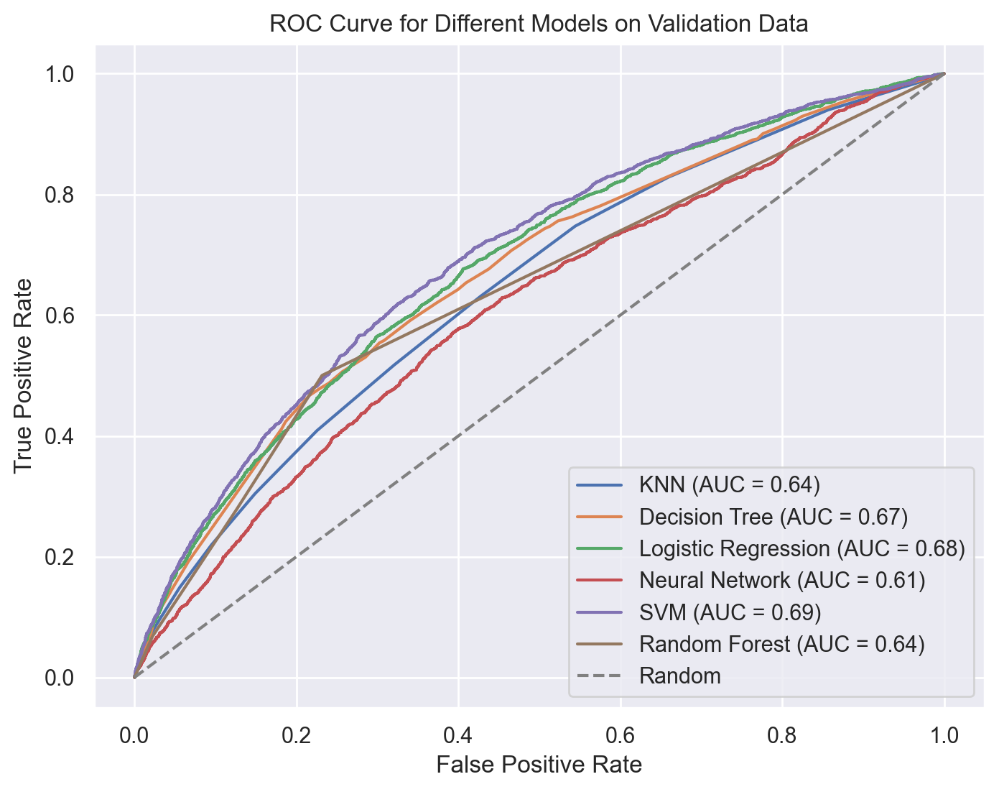

In [304]:
models = [
    ('KNN', KNNfinal_model),
    ('Decision Tree', DT_balanced_final),
    ('Logistic Regression', log_balanced_GS),
    ('Neural Network', MLP_GS),
    ('SVM', SVM_balanced_final),
    ('Random Forest', CRF_final_model)
]


plt.figure(figsize=(8, 6))

for name, model in models:
    if hasattr(model, "predict_proba"): 
        probs = model.predict_proba(X_val)[:, 1]
    else:
        probs = model.decision_function(X_val)  
    
    fpr, tpr, _ = roc_curve(y_val, probs)
    auc_value = auc(fpr, tpr)
    
    plt.plot(fpr, tpr, label=f'{name} (AUC = {auc_value:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Different Models on Validation Data')
plt.legend()
plt.show()

## 10. Deployment 

In [305]:
labels_test = CRF_final_model.predict(X_test)

In [306]:
CRF_final_model.predict_proba(X_test)

array([[0.65625619, 0.34374381],
       [0.34090082, 0.65909918],
       [0.65625619, 0.34374381],
       ...,
       [0.65625619, 0.34374381],
       [0.65625619, 0.34374381],
       [0.65625619, 0.34374381]])

In [307]:
index = test.index.T
readmitted = pd.DataFrame([index, labels_test]).T
readmitted.columns = ['encounter_id','readmitted_binary']
readmitted

,encounter_id,readmitted_binary
0,499502,0
1,447319,1
2,309126,0
3,181183,0
4,359339,0
...,...,...
30015,451150,0
30016,549298,1
30017,327586,0
30018,351214,0


In [308]:
readmitted = pd.concat([readmitted, test_expired])

In [309]:
readmitted['readmitted_binary'].replace(1, 'Yes', inplace = True)
readmitted['readmitted_binary'].replace(0, 'No', inplace = True) 

In [310]:
readmitted

,encounter_id,readmitted_binary
0,499502,No
1,447319,Yes
2,309126,No
3,181183,No
4,359339,No
...,...,...
30295,247251,No
30301,118892,No
30314,943949,No
30319,925146,No


In [311]:
# readmitted.to_csv('Group15_Version43.csv', index = None)